In [12]:
import matplotlib.pyplot as plt
%matplotlib inline

In [13]:
from gensim.models.word2vec import Word2Vec

In this section, you can decide which model for which corpus you want to use for your analysis. Here by default, it's the Revue des Deux Mondes corpus within the years 1820-1900. We tested over 10-year slides, it's clearly much less effective due to the small size of the French corpora.
After the load, put the path to your directory of models, and then select your range in "year in range".

In [14]:
from collections import OrderedDict

models = OrderedDict([
    (year, Word2Vec.load('/home/odysseus/Téléchargements/hist-vec-master/r2m/LemCorpR2M_models/{}.bin'.format(year)))
    for year in range(1820, 1900, 20)
])

In [15]:
def cosine_series(anchor, query):
    
    series = OrderedDict()
    
    for year, model in models.items():
        
        series[year] = (
            model.similarity(anchor, query)
            if query in model else 0
        )

    return series

In [16]:
import numpy as np
import statsmodels.api as sm

def lin_reg(series):

    x = np.array(list(series.keys()))
    y = np.array(list(series.values()))

    x = sm.add_constant(x)

    return sm.OLS(y, x).fit()

In [17]:
def plot_cosine_series(anchor, query, w=5, h=4):
    
    series = cosine_series(anchor, query)
    
    fit = lin_reg(series)

    x1 = list(series.keys())[0]
    x2 = list(series.keys())[-1]

    y1 = fit.predict()[0]
    y2 = fit.predict()[-1]
    
    print(query)
    
    plt.figure(figsize=(w, h))
    plt.ylim(0, 1)
    plt.title(query)
    plt.xlabel('Year')
    plt.ylabel('Similarity')
    plt.plot(list(series.keys()), list(series.values()))
    plt.plot([x1, x2], [y1, y2], color='gray', linewidth=0.5)
    plt.show()

The cell below (which calls the methods above), shows how two words differ from one another <b>through time</b>, with <b>cosine</b> similarity. Here, we show how "poésie" evolves compared to "littérature". You can manually change both below.

poésie


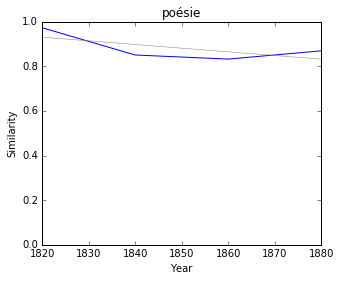

In [18]:
plot_cosine_series('littérature', 'poésie')

The two next cells get the 200 most similar terms to a specific term, from the training models, here "littérature".

In [19]:
def union_neighbor_vocab(anchor, topn=200):
    
    vocab = set()
    
    for year, model in models.items():
        similar = model.most_similar(anchor, topn=topn)
        vocab.update([s[0] for s in similar])
        
    return vocab

At this point, we'll do the same thing as above, and calculate, for each token in the 200 nearest terms to the main entry, the <b>proximity</b> of this term and its <b>significance</b>. The significance is calculated with the p value, that is to say that, below a certain threshold (0.05) we have a strong likelyhood that the result is sure and significant.

In [20]:
testList = ('littérature','poésie', 'science', 'savoir', 'histoire', 'philosophie', 'lettre', 'critique', 
            'roman', 'théâtre', 'drame', 'esprit', 'langue', 'diplomatie', 'politique', 'morale', 'société', 
            'pouvoir', 'théologie', 'droit', 'loi', 'méthode', 'génie', 'romantisme', 'réalisme', 'symbolisme', 
            'naturalisme')
entries={}

for word in testList:
    data = []
    for token in union_neighbor_vocab(word):
    
        series = cosine_series('littérature', token)
        fit = lin_reg(series)
    
        if fit.pvalues[1] < 0.05:
            data.append((token, fit.params[1], fit.pvalues[1]))
    entries[word]=data

# Increasing

In this part, we want to show what terms <b>emerge</b> more and more with the main entry, that is to say each word of the given test list. The <b>"slope"</b> is the degree of progress, and the <b>"p" value</b> its efficiency. So here, the main emergence with "littérature" which is significant is "humanisme". All terms seem to be significant, except "fédéralisme", "welschinger", "maniere", "hennet", "réapparition", "deffence", "bourgin", "colonie", "naturalisme", "réalisme", "sillery", "gréco", "compétence", "symbolisme", "catholique", "japonais", "manuel", "romand", "topographie, "organisme", "prédominance". That is to say that those terms can be nearest, but that statistically they are not significant enough to be sure, while the others are more certain.

In this following cell, we show how the top ten most similar vectors change through time compared to the words in the test list : "humanisme" for example seems to be very rare before 1860, and then becomes more and more similar to "littérature". Those show the terms that were not similar in the beginning, but <b>tend to be more and more related</b> to "littérature". You should keep in mind the p values associated to each vector.

### <i><b>littérature</i></b>

            token     slope         p
16    physiologie  0.015517  0.039857
74    positiviste  0.015063  0.002245
7     sauvegarder  0.014201  0.024549
45      arbitrage  0.011269  0.003807
69         adepte  0.008166  0.026672
95   consécration  0.003431  0.000266
18      orthodoxe  0.003419  0.002439
91    suppression  0.001464  0.040740
110  traditionnel  0.001363  0.007826
55   enseignement -0.000700  0.043674



physiologie


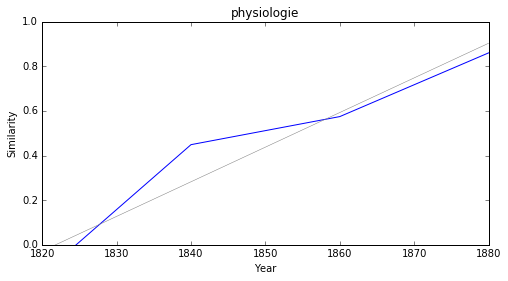

positiviste


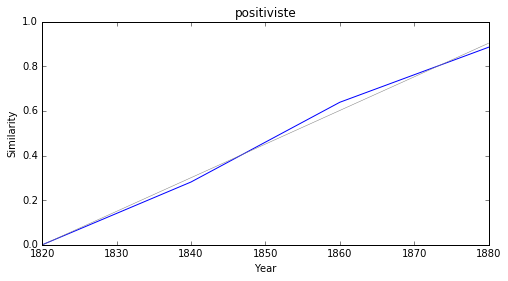

sauvegarder


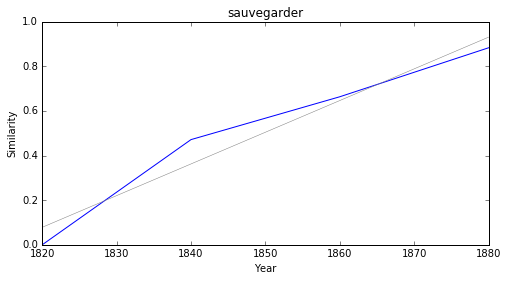

arbitrage


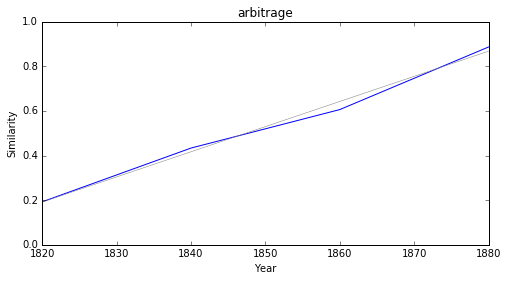

adepte


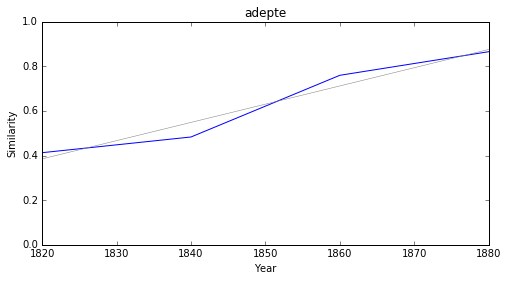

consécration


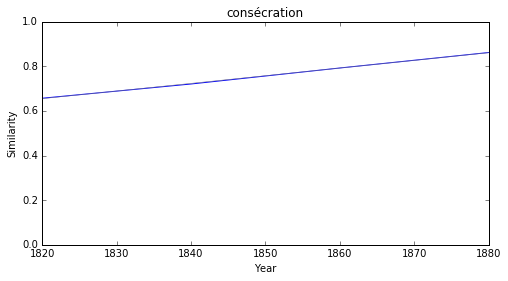

orthodoxe


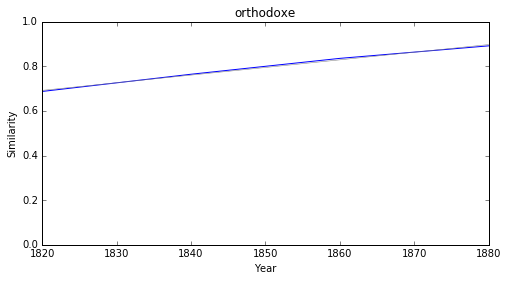

suppression


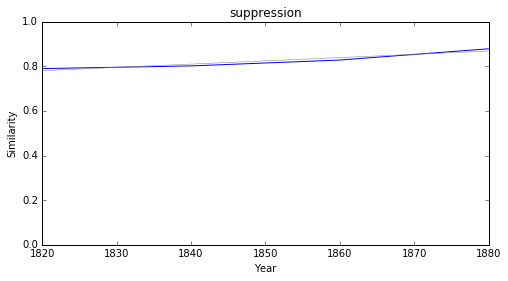

traditionnel


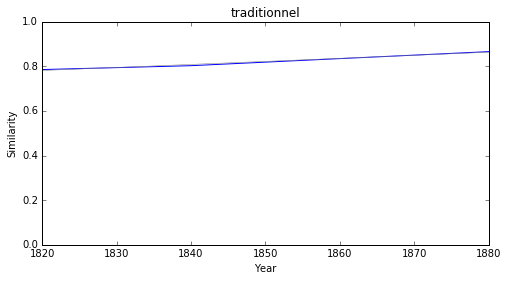

enseignement


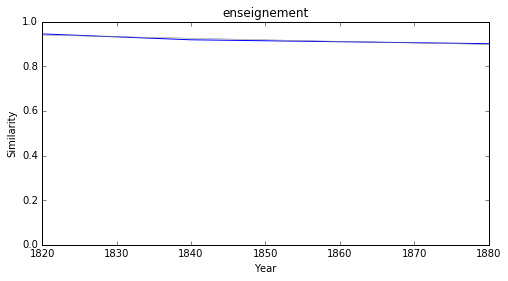

### <i><b>poésie</i></b>

            token     slope         p
8    infiltration  0.014695  0.029478
32    liquidation  0.012153  0.011917
77    suppression  0.001464  0.040740
42   enseignement -0.000700  0.043674
76     historique -0.001139  0.035809
29     démocratie -0.001301  0.035032
0     application -0.001379  0.043726
46          union -0.001916  0.007480
41        logique -0.002004  0.008464
9   établissement -0.002051  0.003521



infiltration


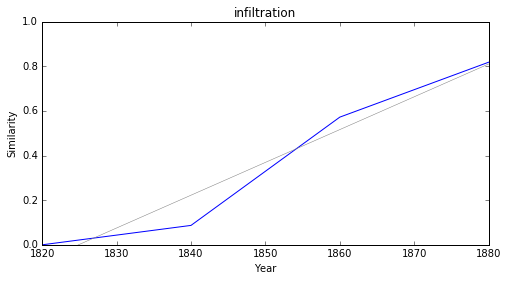

liquidation


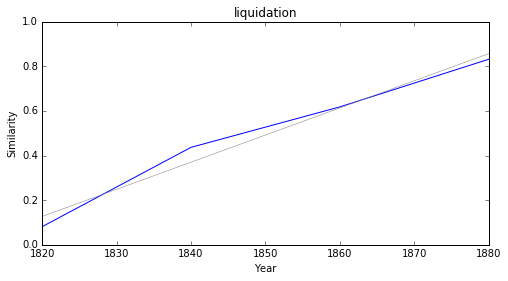

suppression


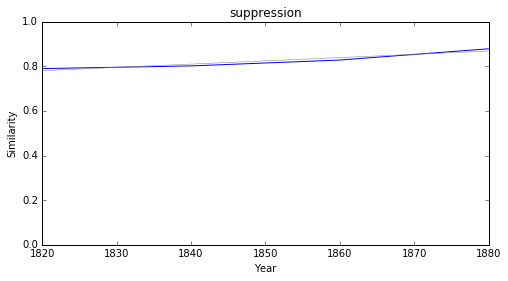

enseignement


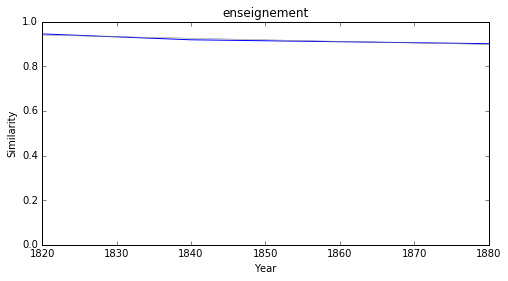

historique


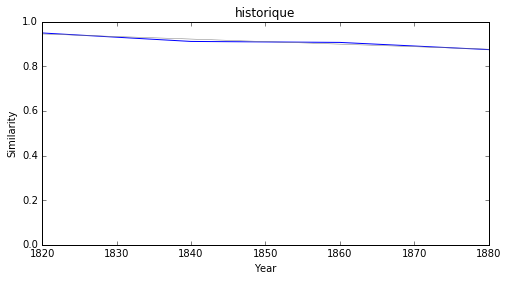

démocratie


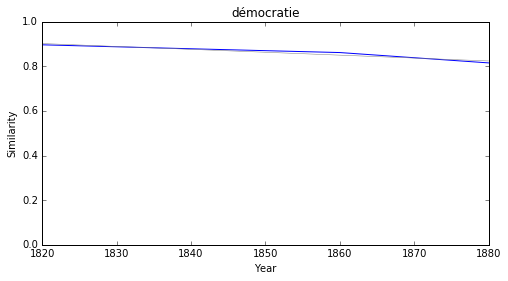

application


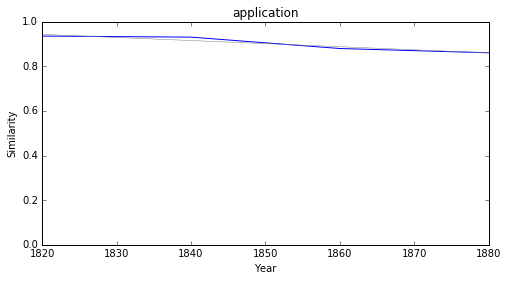

union


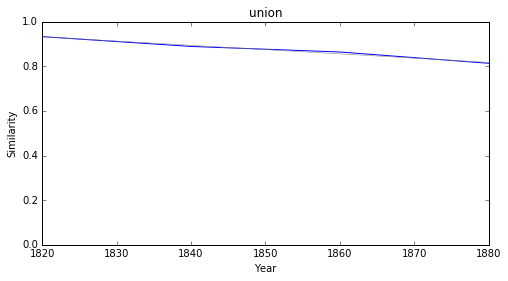

logique


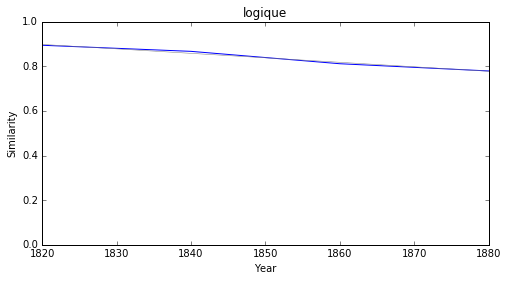

établissement


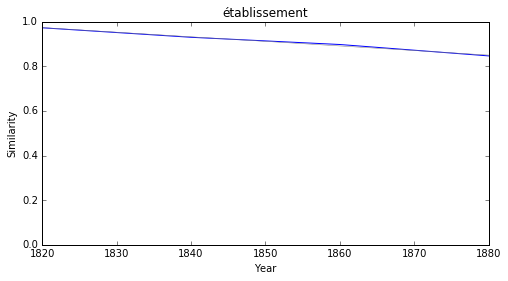

### <i><b>science</i></b>

           token     slope         p
49  enseignement -0.000700  0.043674
47   législation -0.001048  0.030707
78    historique -0.001139  0.035809
35    démocratie -0.001301  0.035032
0    application -0.001379  0.043726
45     phénomène -0.001547  0.035476
93    protecteur -0.001627  0.013806
18      européen -0.001821  0.034444
91  conservateur -0.001905  0.042349
52         union -0.001916  0.007480



enseignement


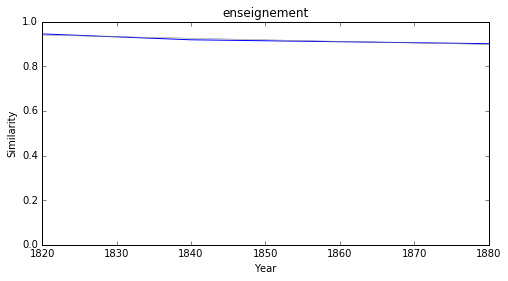

législation


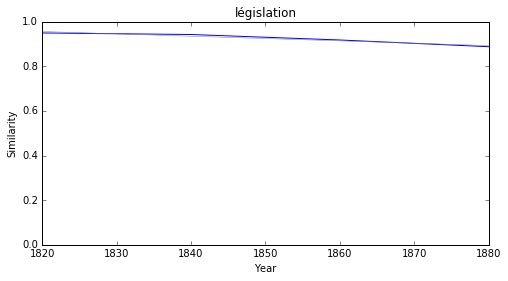

historique


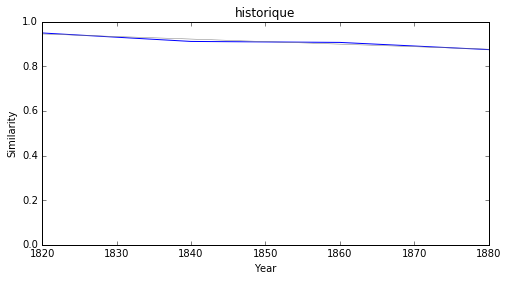

démocratie


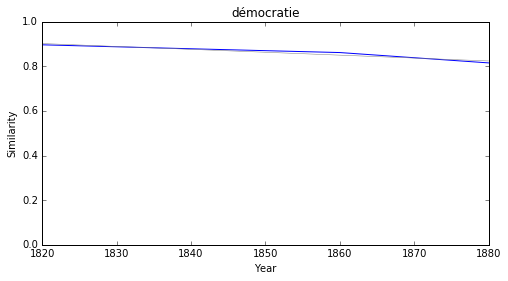

application


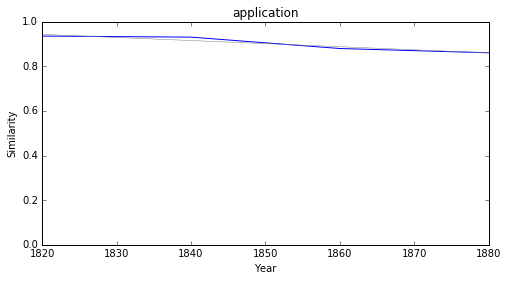

phénomène


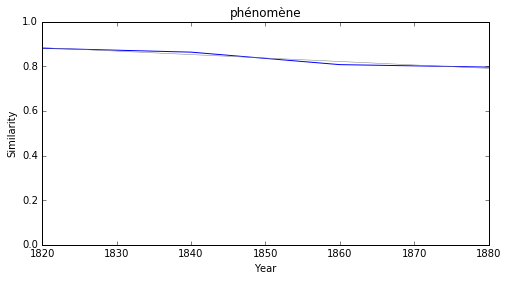

protecteur


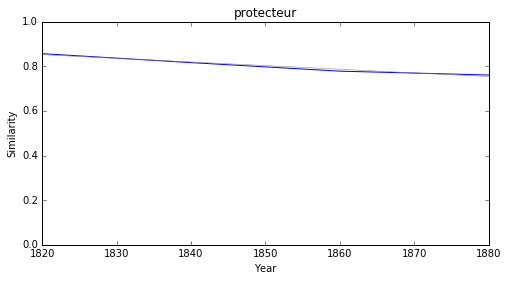

européen


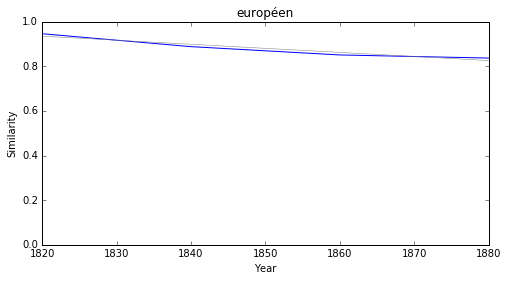

conservateur


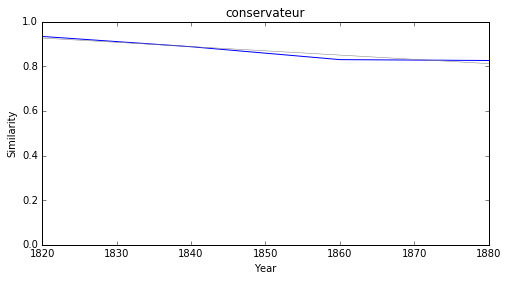

union


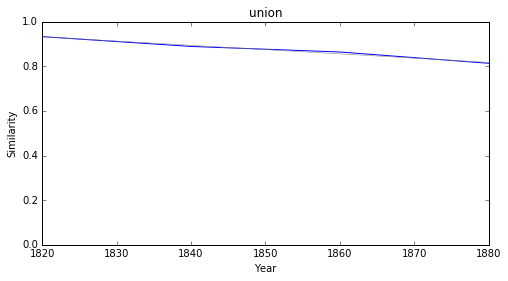

### <i><b>savoir</i></b>

           token     slope         p
0       hobereau  0.013626  0.022700
6       ébruiter  0.012450  0.018804
4   décontenancé  0.011693  0.004711
7          fêler  0.009469  0.011227
11     patienter  0.008329  0.033861
10      détrôner -0.002702  0.042744
2         crotté -0.003682  0.015536
9       posséder -0.003813  0.022901
8      intention -0.004164  0.023288
5   connaissance -0.004738  0.012819



hobereau


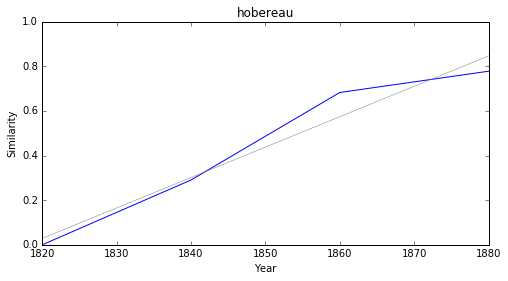

ébruiter


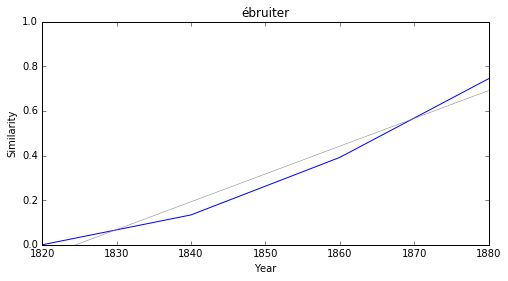

décontenancé


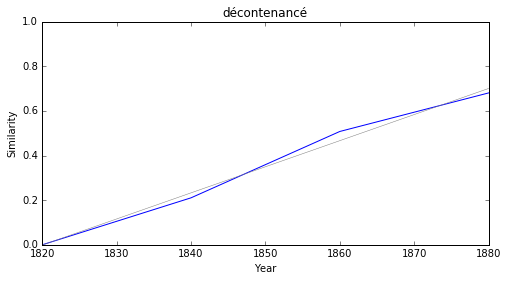

fêler


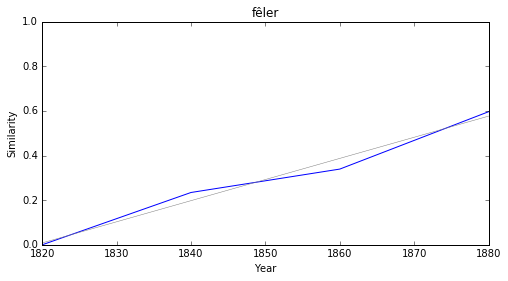

patienter


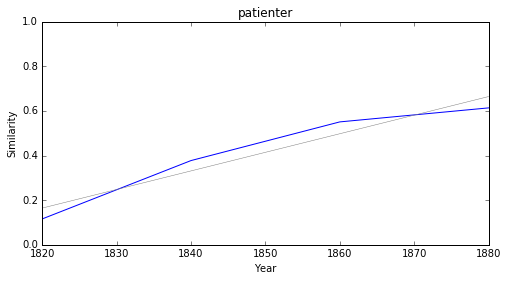

détrôner


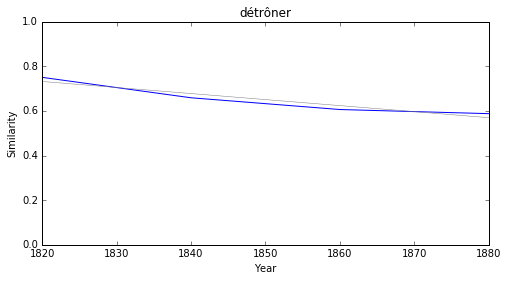

crotté


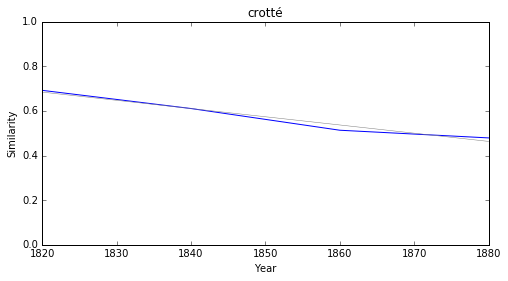

posséder


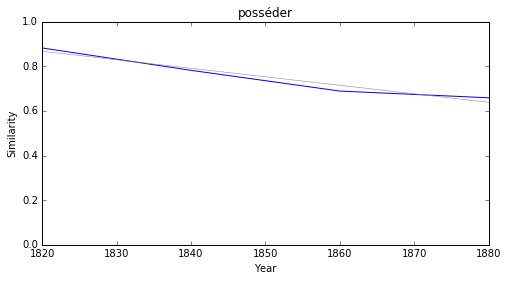

intention


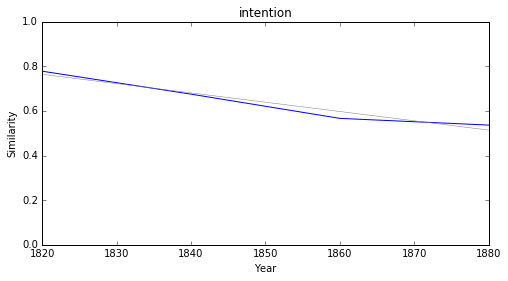

connaissance


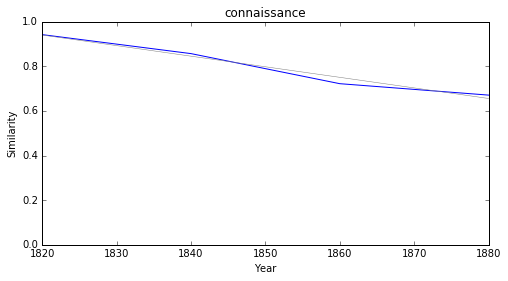

### <i><b>histoire</i></b>

           token     slope         p
72        mirage  0.010030  0.042582
47  enseignement -0.000700  0.043674
45   législation -0.001048  0.030707
82    historique -0.001139  0.035809
33    démocratie -0.001301  0.035032
0    application -0.001379  0.043726
43     phénomène -0.001547  0.035476
94  conservateur -0.001905  0.042349
50         union -0.001916  0.007480
46       logique -0.002004  0.008464



mirage


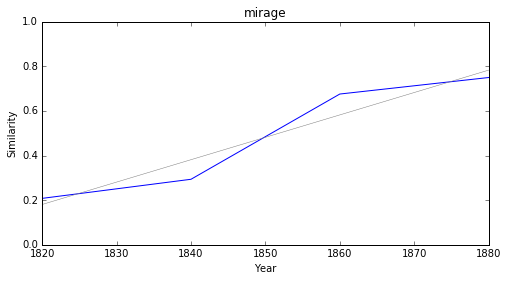

enseignement


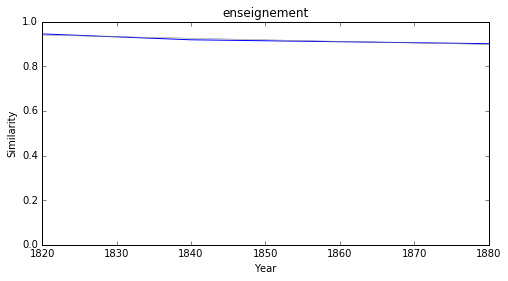

législation


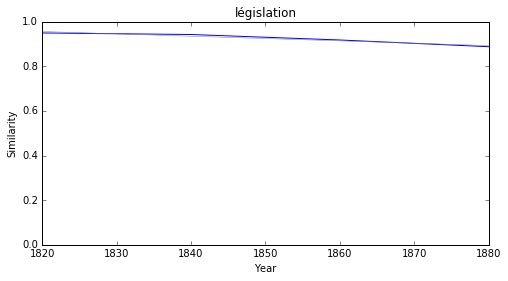

historique


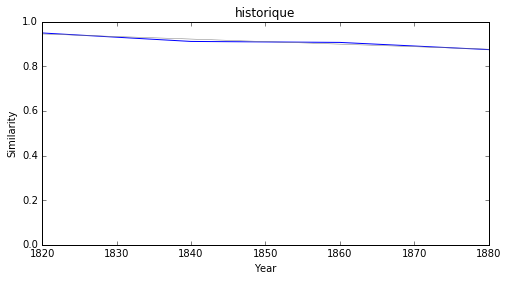

démocratie


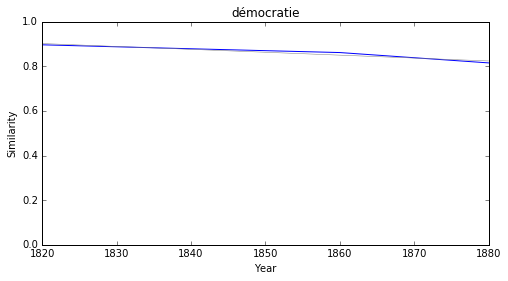

application


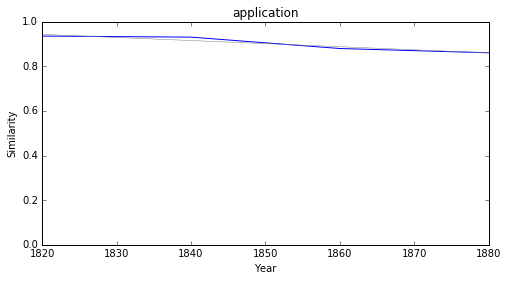

phénomène


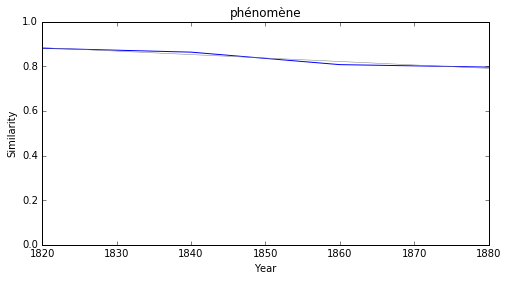

conservateur


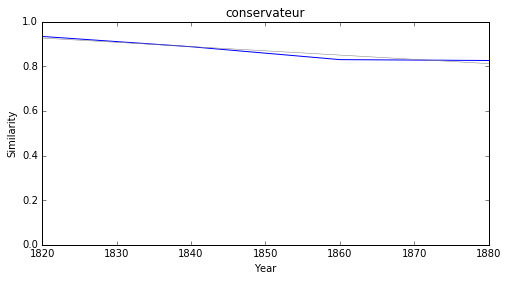

union


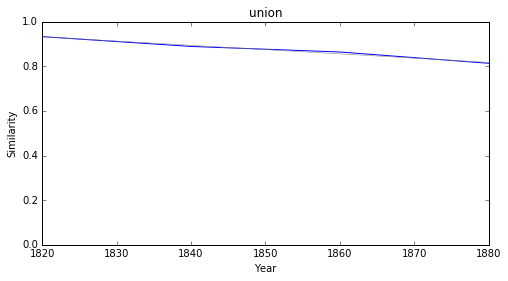

logique


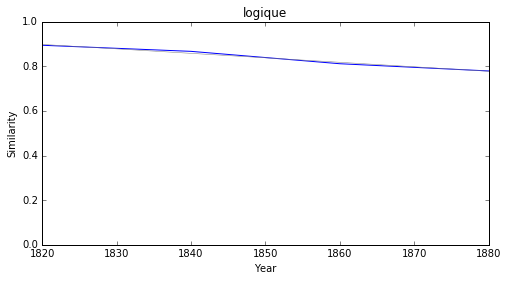

### <i><b>philosophie</i></b>

           token     slope         p
36   liquidation  0.012153  0.011917
76   suppression  0.001464  0.040740
46  enseignement -0.000700  0.043674
43   législation -0.001048  0.030707
75    historique -0.001139  0.035809
30    démocratie -0.001301  0.035032
0    application -0.001379  0.043726
41     phénomène -0.001547  0.035476
15      européen -0.001821  0.034444
88  conservateur -0.001905  0.042349



liquidation


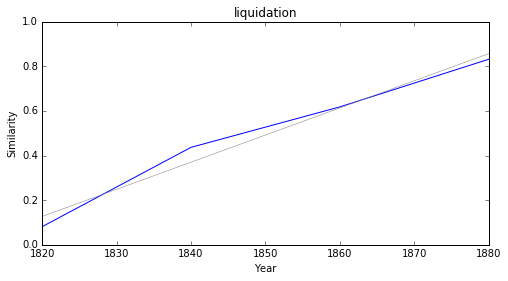

suppression


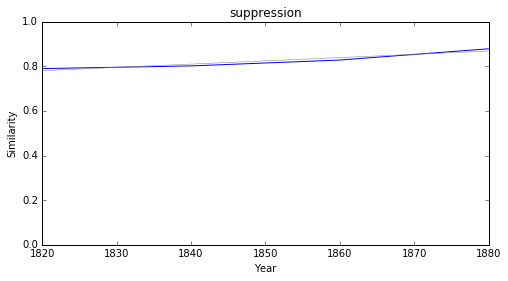

enseignement


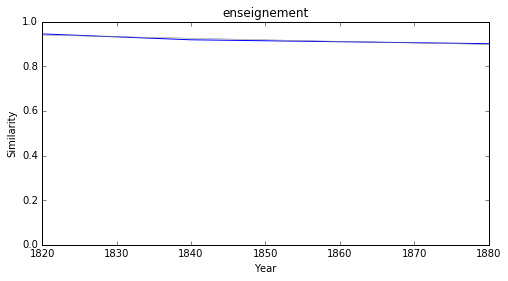

législation


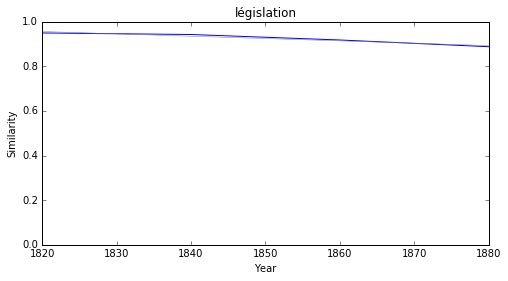

historique


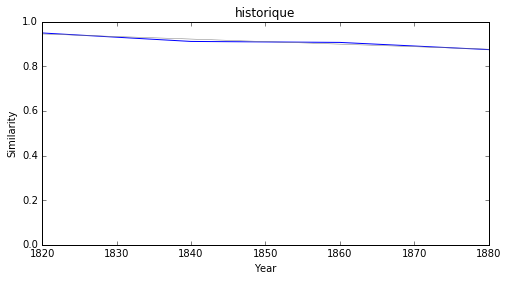

démocratie


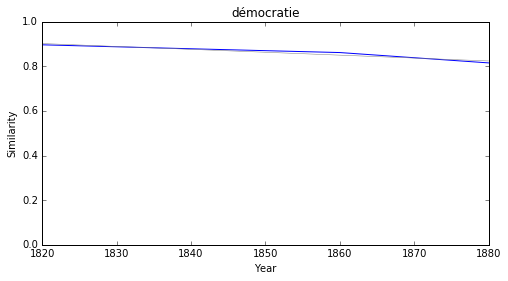

application


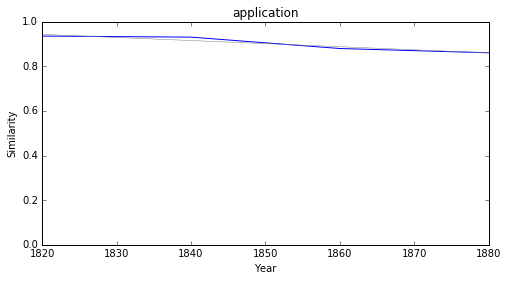

phénomène


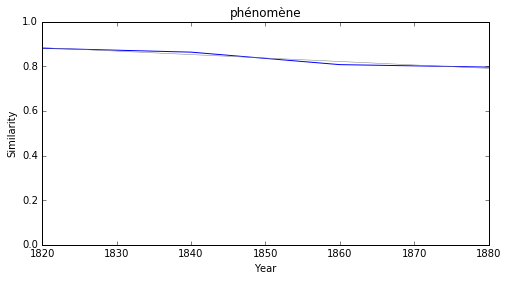

européen


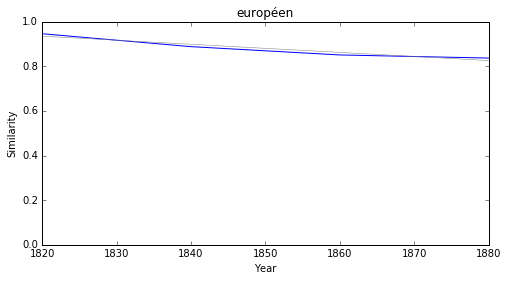

conservateur


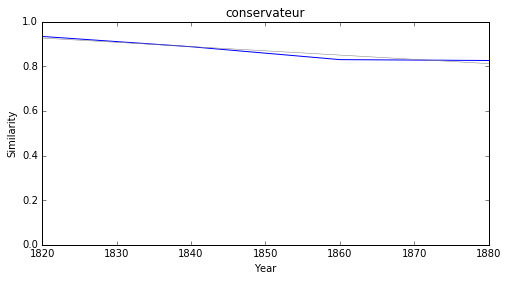

### <i><b>lettre</i></b>

          token     slope         p
2        lussac  0.012324  0.040100
42     lingerie  0.011315  0.048110
13       colmar  0.011236  0.029054
20    dérisoire  0.010786  0.049114
21  gracieuseté  0.010154  0.026914
11        rhume  0.009737  0.008985
23    indignité  0.009606  0.048139
0         buloz  0.007612  0.042822
15     gonzague  0.006890  0.033885
18   conférence -0.002149  0.000828



lussac


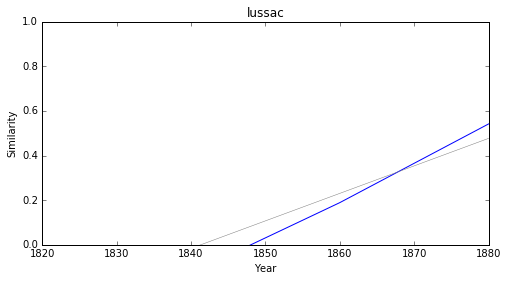

lingerie


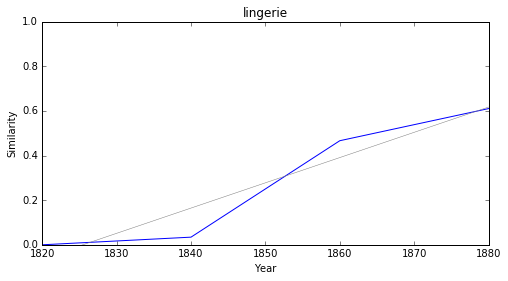

colmar


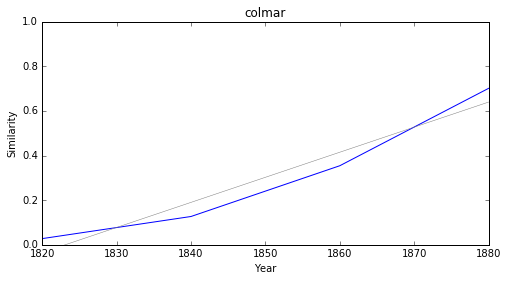

dérisoire


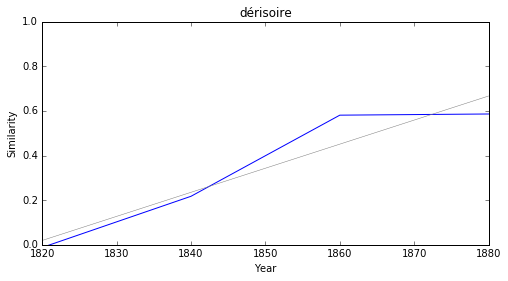

gracieuseté


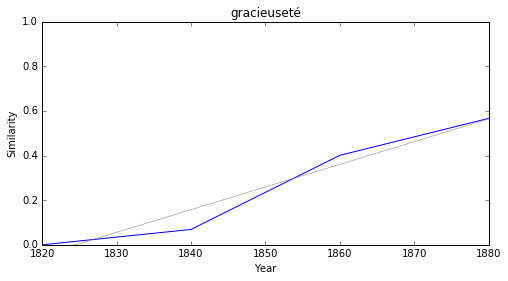

rhume


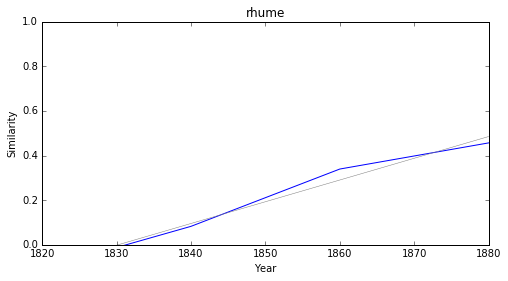

indignité


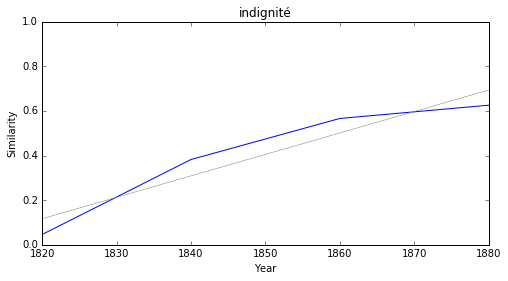

buloz


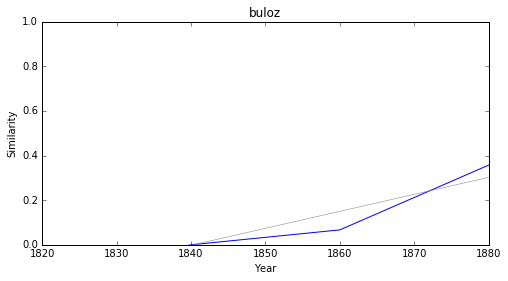

gonzague


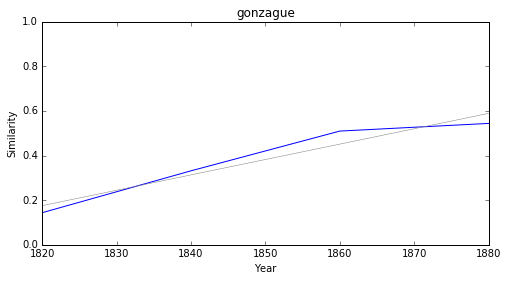

conférence


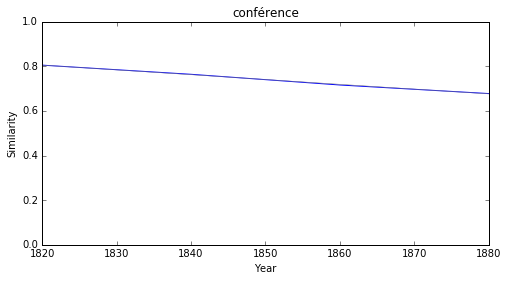

### <i><b>critique</i></b>

           token     slope         p
48      ébruiter  0.012450  0.018804
47  radicalement  0.008521  0.007345
36        adepte  0.008166  0.026672
30     améliorer  0.001088  0.043888
25  enseignement -0.000700  0.043674
23   législation -0.001048  0.030707
42    historique -0.001139  0.035809
20    démocratie -0.001301  0.035032
0    application -0.001379  0.043726
22     phénomène -0.001547  0.035476



ébruiter


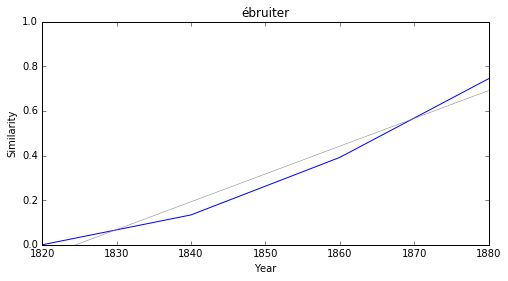

radicalement


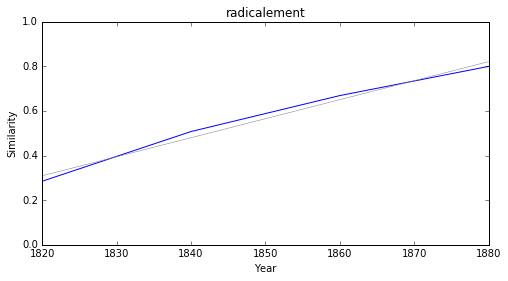

adepte


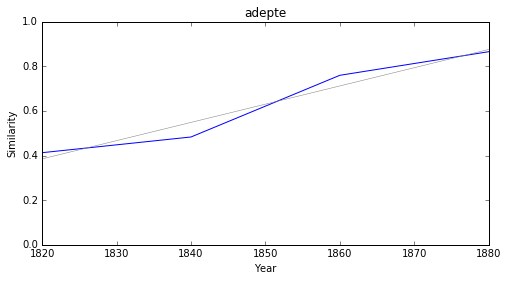

améliorer


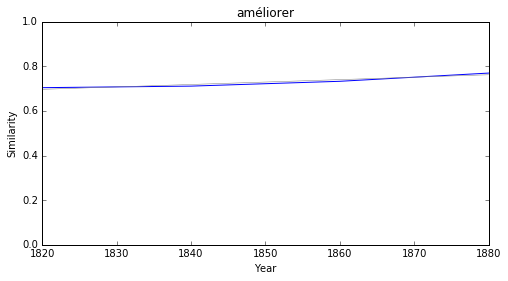

enseignement


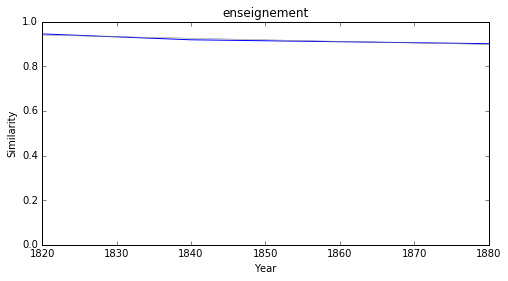

législation


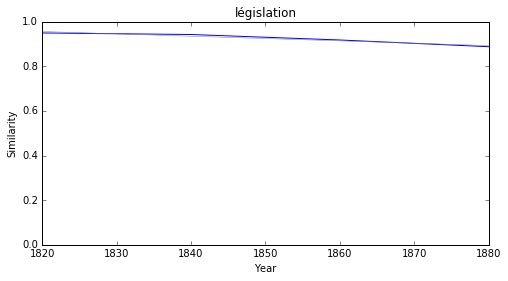

historique


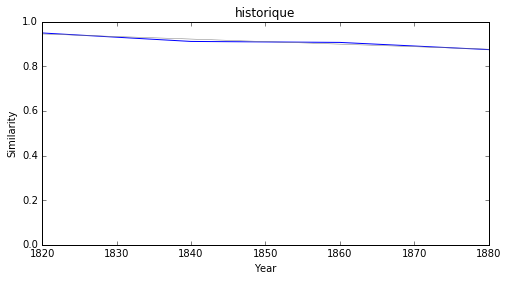

démocratie


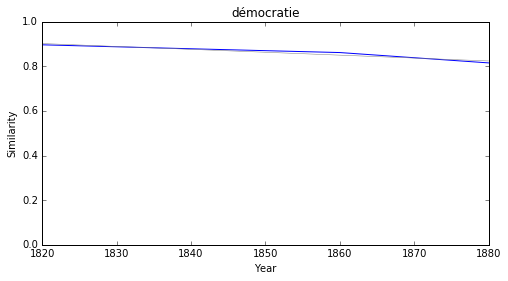

application


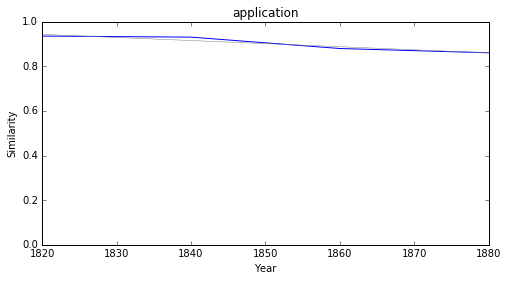

phénomène


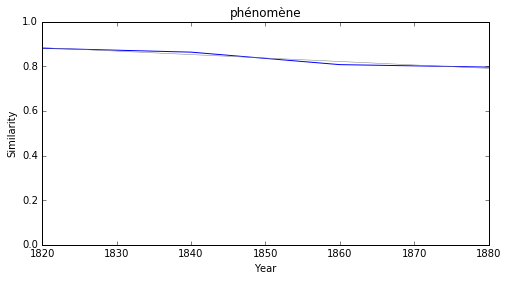

### <i><b>roman</i></b>

          token     slope         p
34       mirage  0.010030  0.042582
18  énumération  0.004541  0.033609
0   application -0.001379  0.043726
11     européen -0.001821  0.034444
23      logique -0.002004  0.008464
15        latin -0.002018  0.016694
26   génération -0.002446  0.047092
10  composition -0.002473  0.021318
37    infirmité -0.002593  0.035687
46    célébrité -0.002806  0.047658



mirage


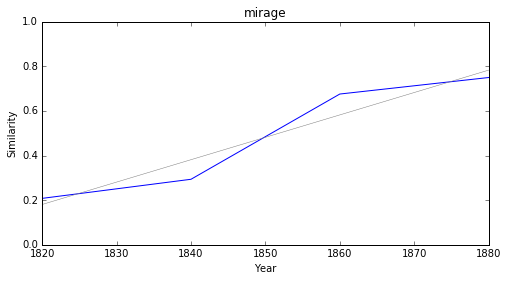

énumération


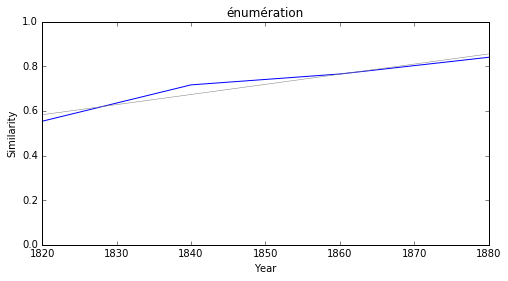

application


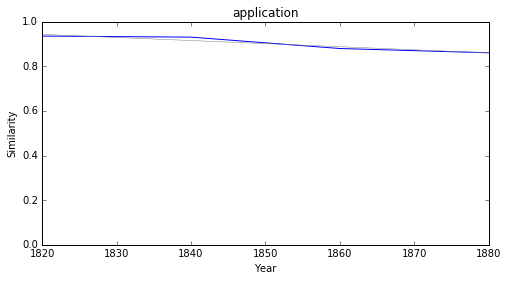

européen


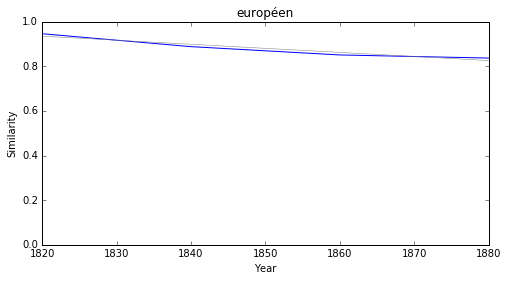

logique


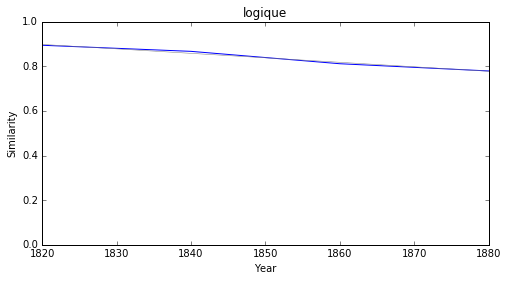

latin


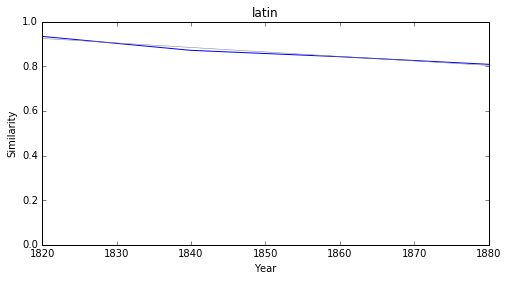

génération


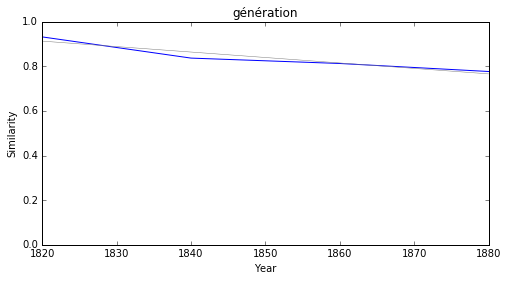

composition


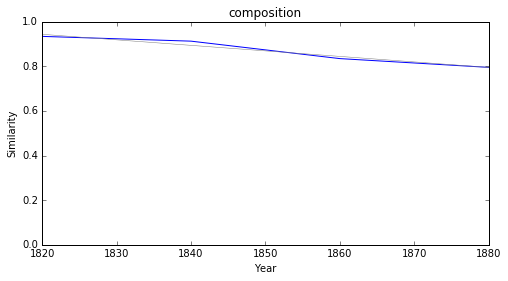

infirmité


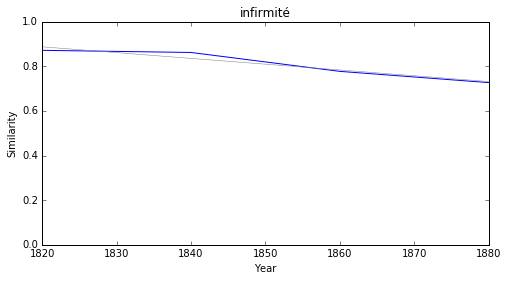

célébrité


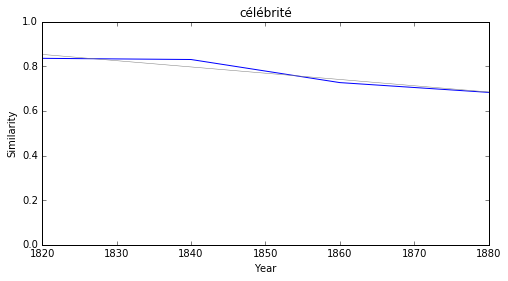

### <i><b>théâtre</i></b>

          token     slope         p
99     tricorne  0.012021  0.030311
59         mein  0.011407  0.035045
97         képi  0.010861  0.028526
79       thibet  0.010802  0.038826
4       ontario  0.010227  0.039925
74       mirage  0.010030  0.042582
11       rabais  0.008406  0.016956
30   démocratie -0.001301  0.035032
110  roussillon -0.001913  0.013116
81         mode -0.002138  0.014923



tricorne


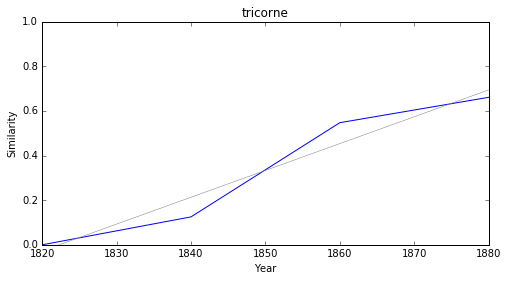

mein


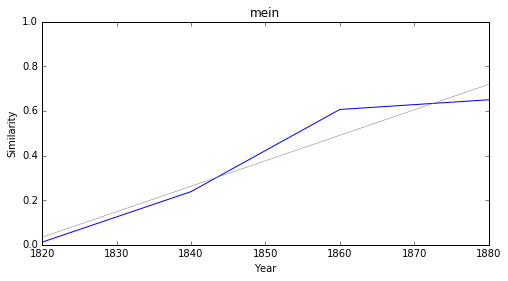

képi


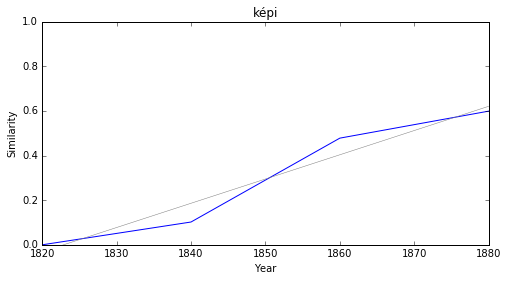

thibet


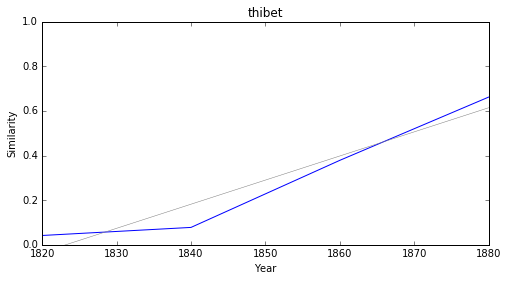

ontario


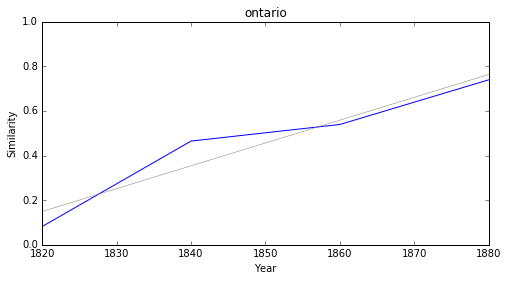

mirage


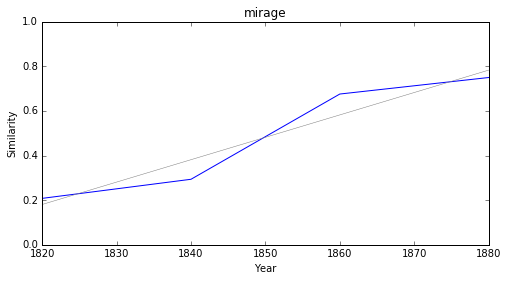

rabais


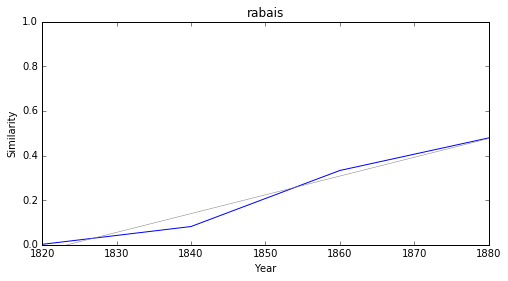

démocratie


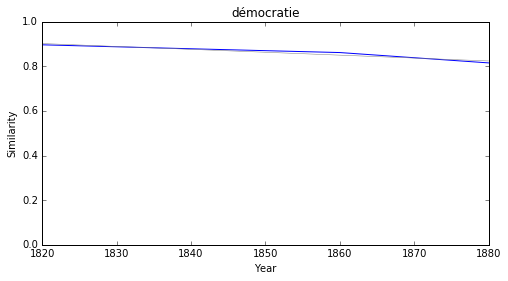

roussillon


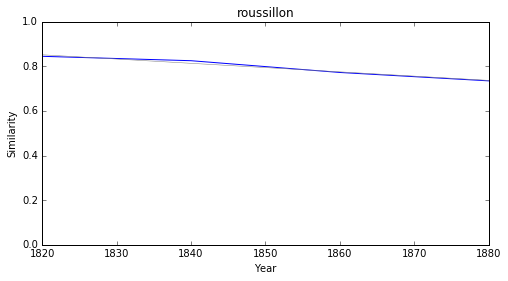

mode


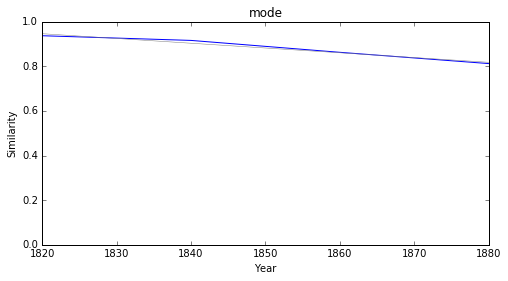

### <i><b>drame</i></b>

           token     slope         p
96     accession  0.017621  0.023000
82       mayence  0.014247  0.017184
20      hobereau  0.013626  0.022700
72       envolée  0.011769  0.020813
117      percher  0.011009  0.039681
0        stipulé  0.010516  0.003113
33         yacht  0.009537  0.043135
48   énumération  0.004541  0.033609
62     structure -0.001964  0.023555
42         latin -0.002018  0.016694



accession


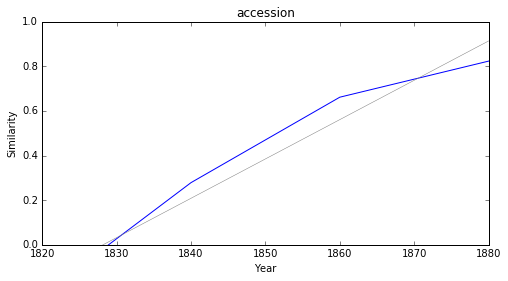

mayence


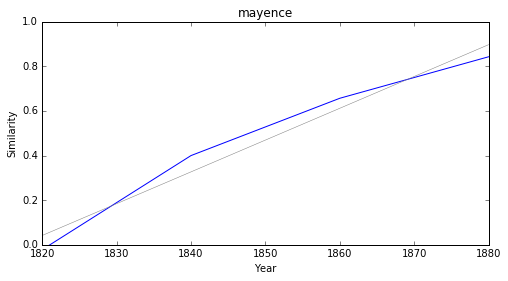

hobereau


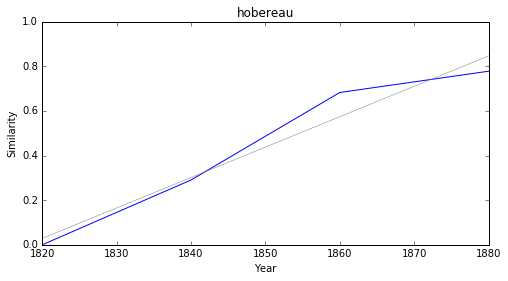

envolée


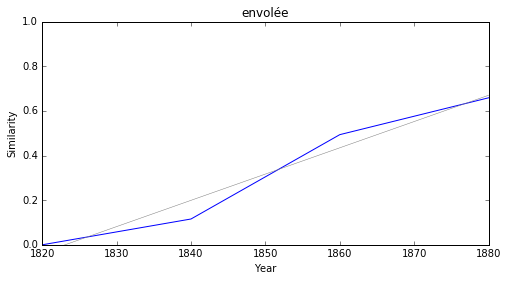

percher


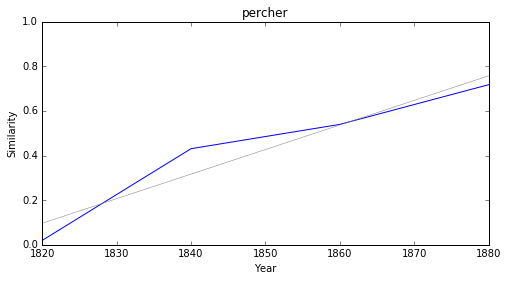

stipulé


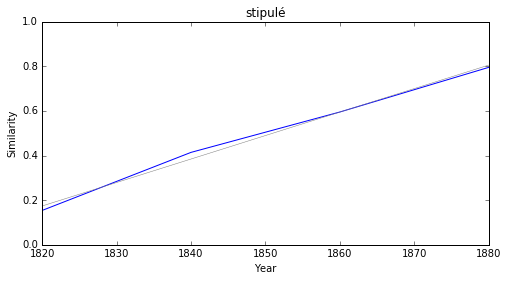

yacht


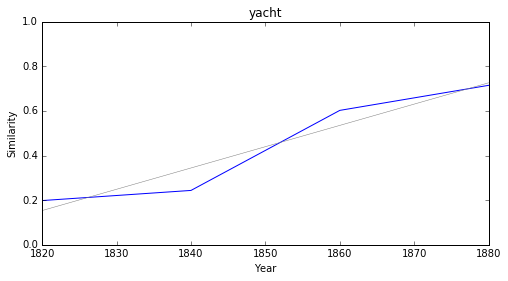

énumération


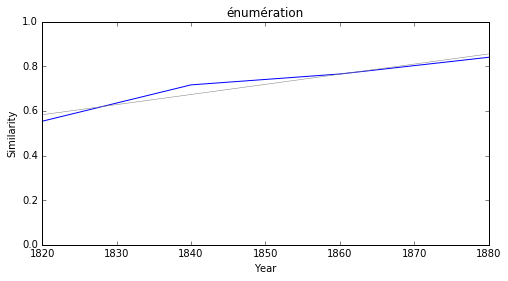

structure


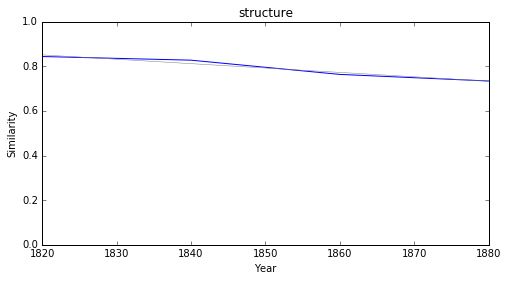

latin


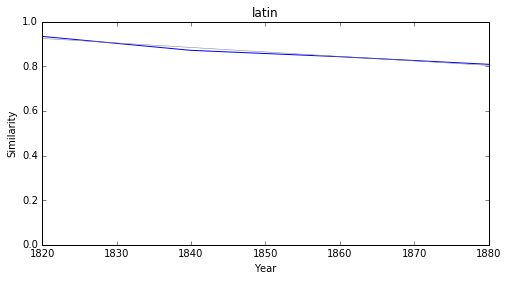

### <i><b>esprit</i></b>

           token     slope         p
38        adepte  0.008166  0.026672
24  enseignement -0.000700  0.043674
52    historique -0.001139  0.035809
0    application -0.001379  0.043726
23       logique -0.002004  0.008464
25       méthode -0.002108  0.007290
53      religion -0.002319  0.043812
29       origine -0.002492  0.007344
13  indépendance -0.002529  0.031711
68         règle -0.002737  0.004658



adepte


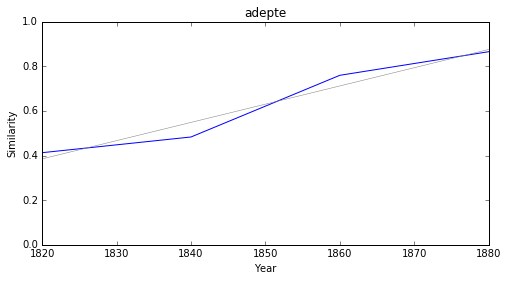

enseignement


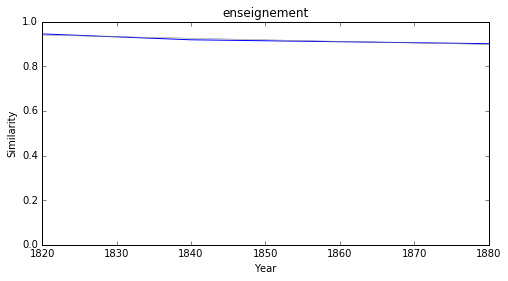

historique


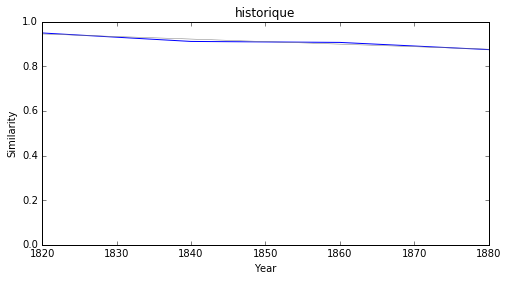

application


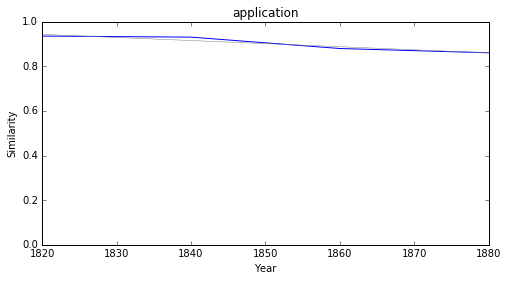

logique


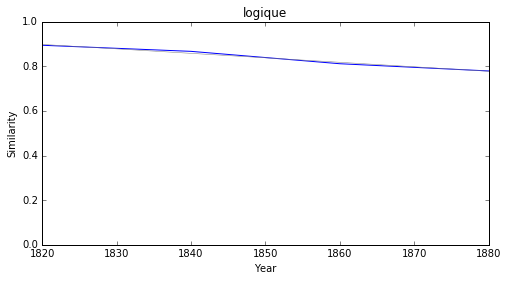

méthode


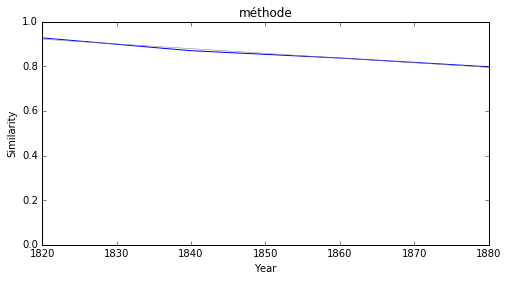

religion


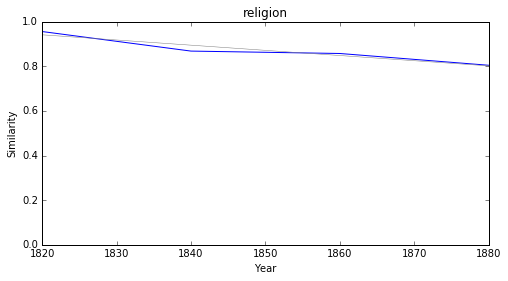

origine


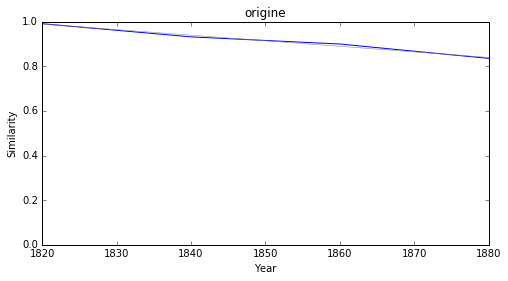

indépendance


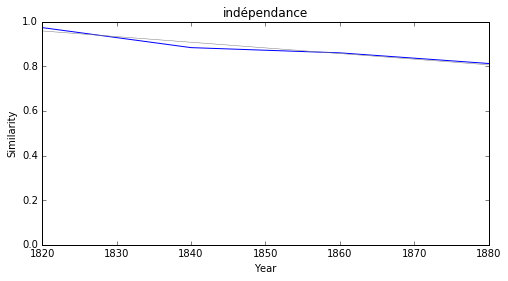

règle


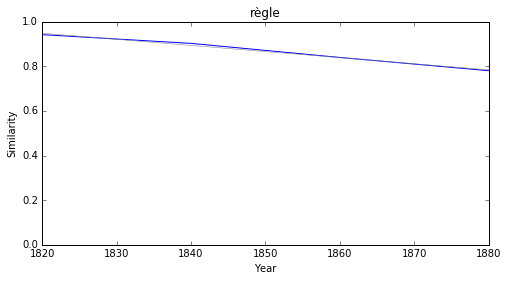

### <i><b>langue</i></b>

           token     slope         p
35      offusqué  0.014109  0.017740
1    compétition  0.013077  0.005386
33  enseignement -0.000700  0.043674
59    historique -0.001139  0.035809
24    démocratie -0.001301  0.035032
0    application -0.001379  0.043726
36         union -0.001916  0.007480
32       logique -0.002004  0.008464
74    antipathie -0.002067  0.026372
34       méthode -0.002108  0.007290



offusqué


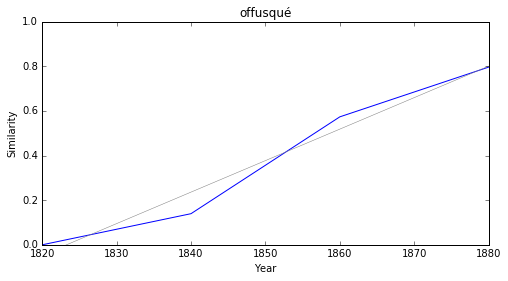

compétition


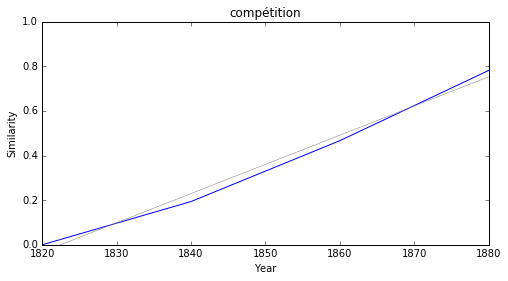

enseignement


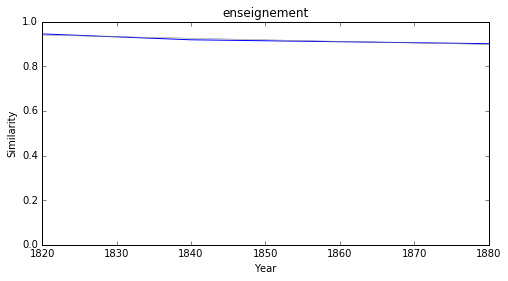

historique


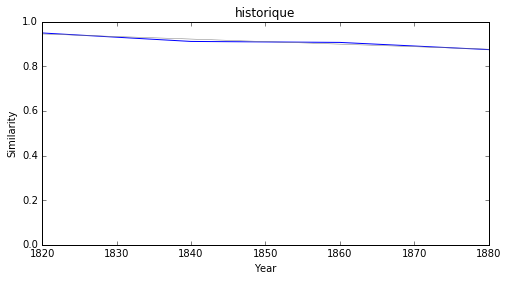

démocratie


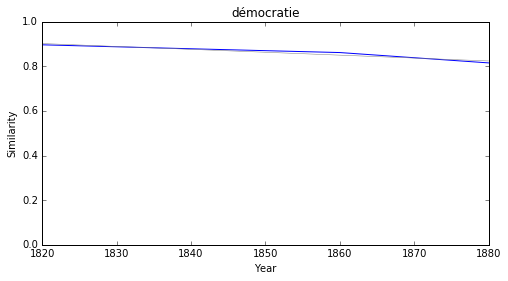

application


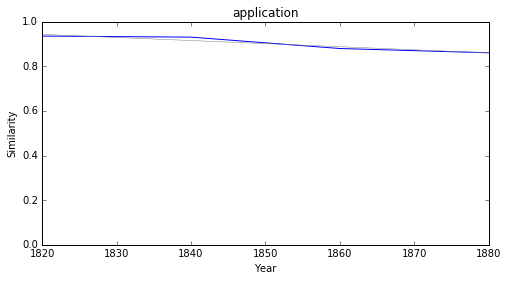

union


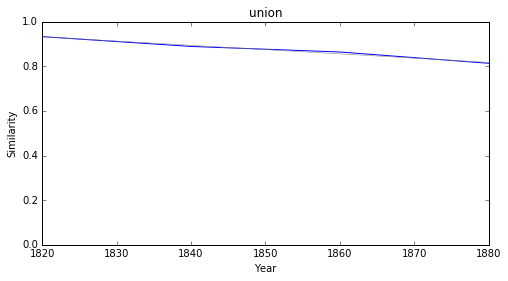

logique


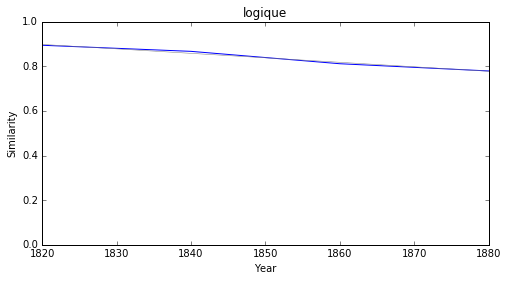

antipathie


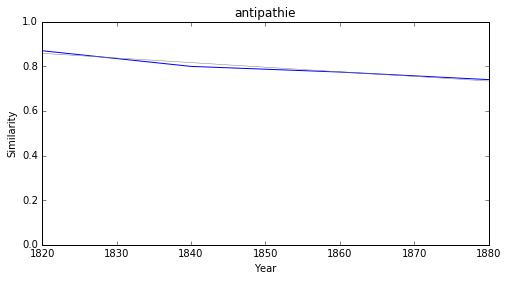

méthode


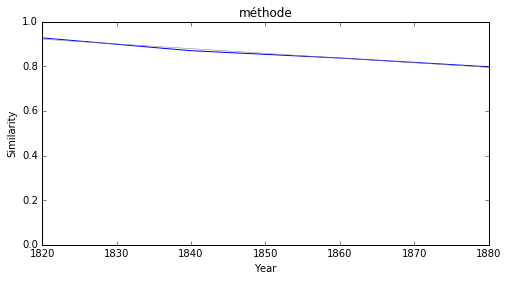

### <i><b>diplomatie</i></b>

           token     slope         p
1    compétition  0.013077  0.005386
20        genèse  0.012376  0.018918
52   suppression  0.001464  0.040740
31  enseignement -0.000700  0.043674
50    historique -0.001139  0.035809
0    application -0.001379  0.043726
64    protecteur -0.001627  0.013806
44       routine -0.001770  0.005507
33         union -0.001916  0.007480
30       logique -0.002004  0.008464



compétition


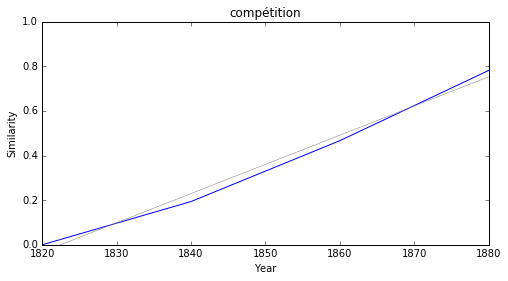

genèse


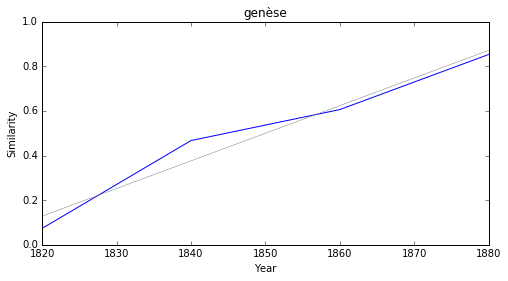

suppression


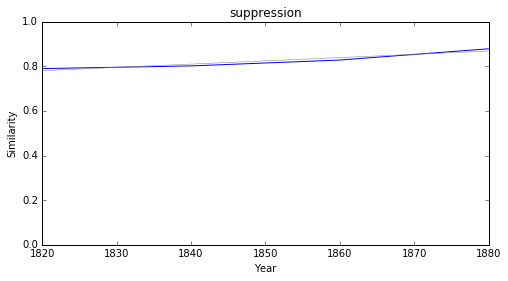

enseignement


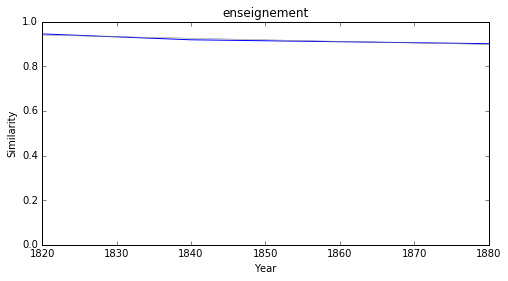

historique


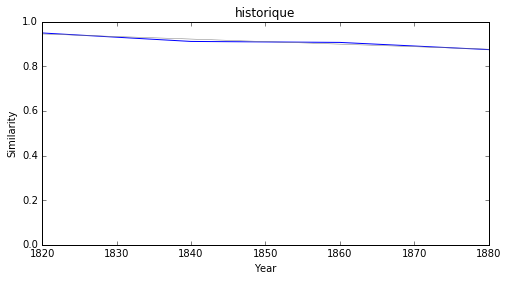

application


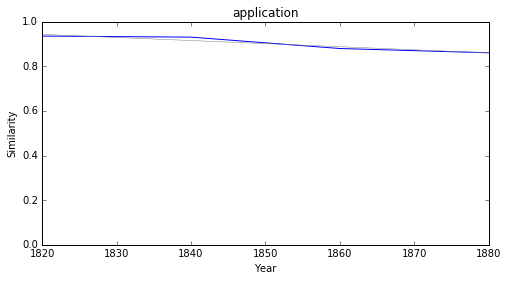

protecteur


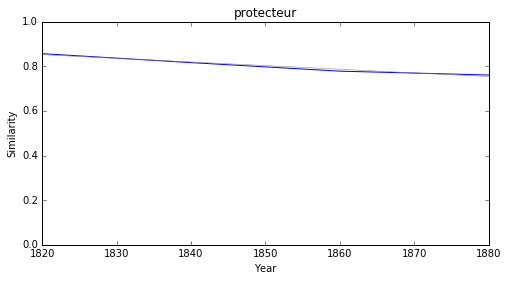

routine


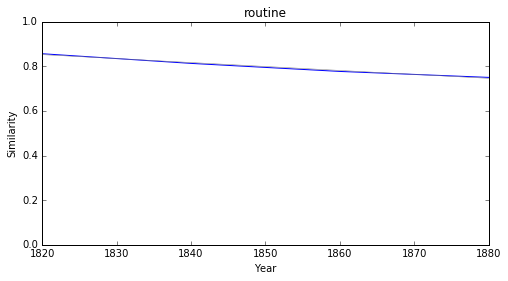

union


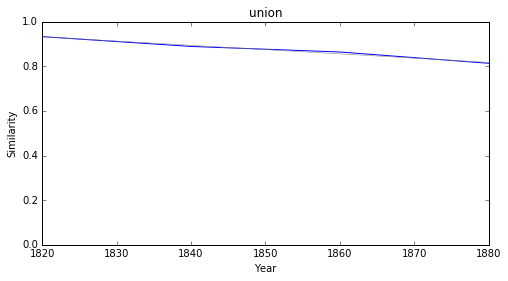

logique


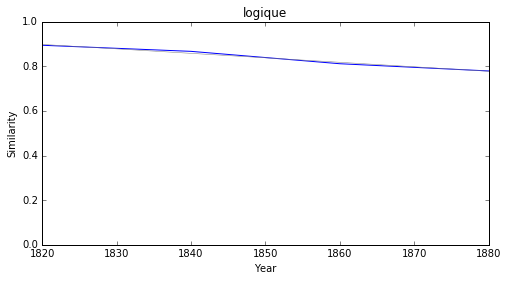

### <i><b>politique</i></b>

           token     slope         p
52  enseignement -0.000700  0.043674
50   législation -0.001048  0.030707
85    historique -0.001139  0.035809
38    démocratie -0.001301  0.035032
0    application -0.001379  0.043726
48     phénomène -0.001547  0.035476
20      européen -0.001821  0.034444
98  conservateur -0.001905  0.042349
56         union -0.001916  0.007480
51       logique -0.002004  0.008464



enseignement


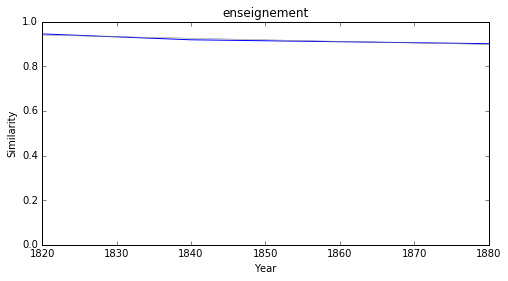

législation


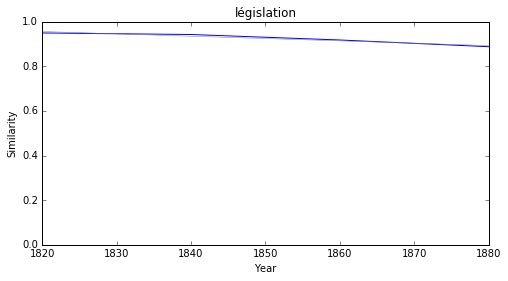

historique


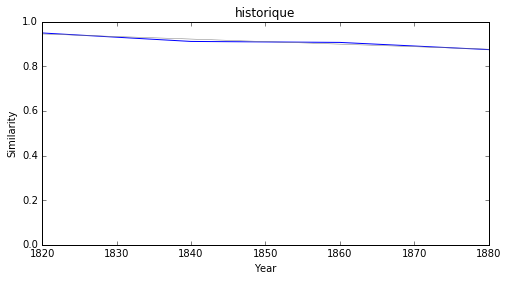

démocratie


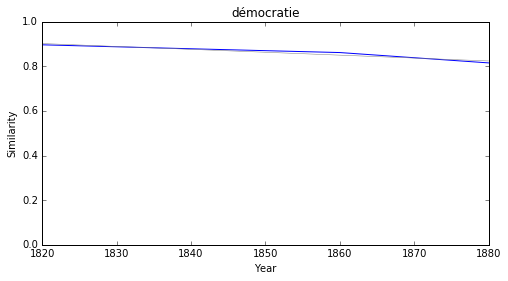

application


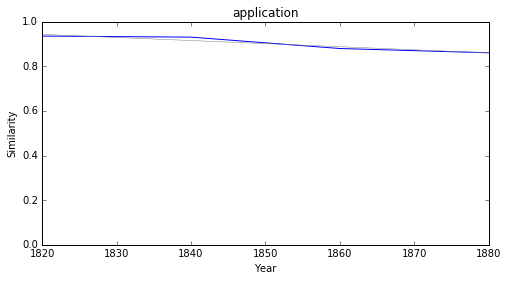

phénomène


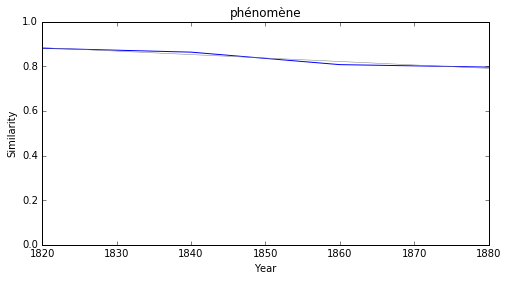

européen


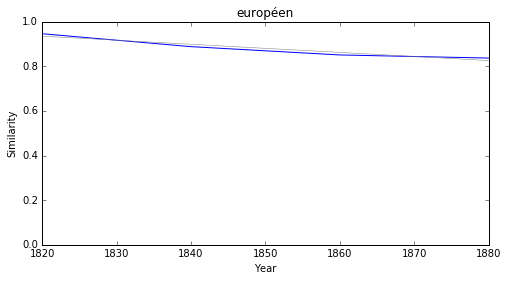

conservateur


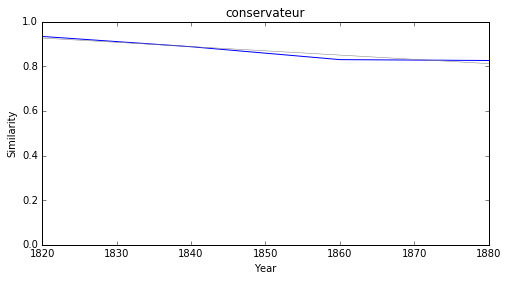

union


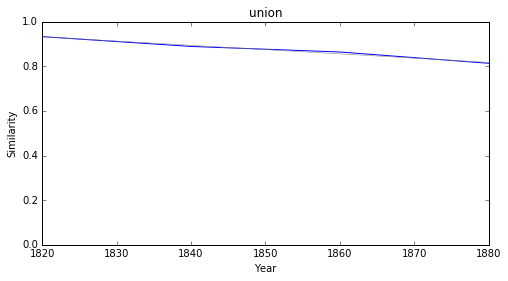

logique


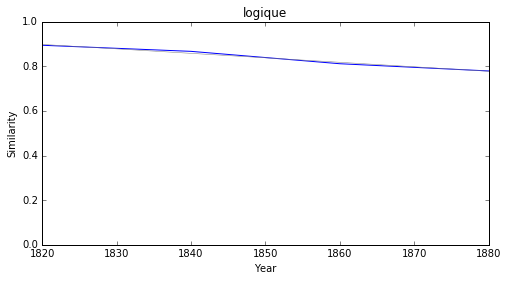

### <i><b>morale</i></b>

           token     slope         p
40   odieusement  0.013617  0.033808
22     arbitrage  0.011269  0.003807
54  consécration  0.003431  0.000266
31  enseignement -0.000700  0.043674
29   législation -0.001048  0.030707
49    historique -0.001139  0.035809
20    démocratie -0.001301  0.035032
0    application -0.001379  0.043726
27     phénomène -0.001547  0.035476
11      européen -0.001821  0.034444



odieusement


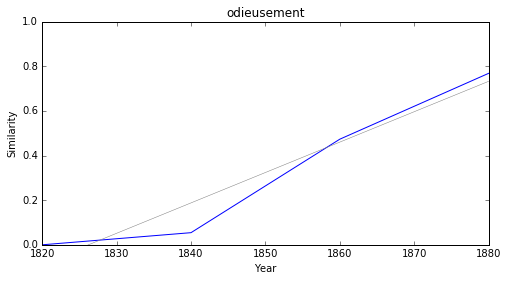

arbitrage


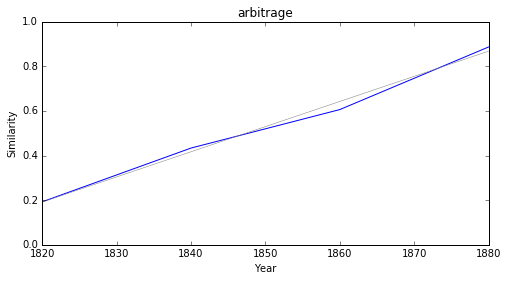

consécration


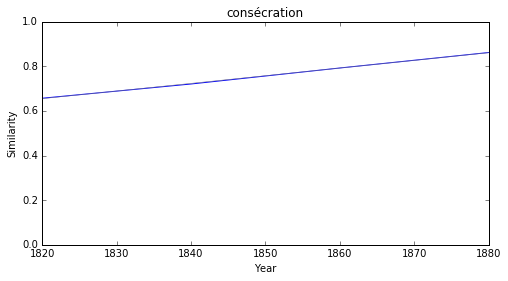

enseignement


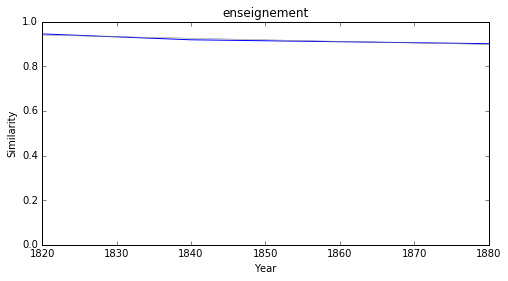

législation


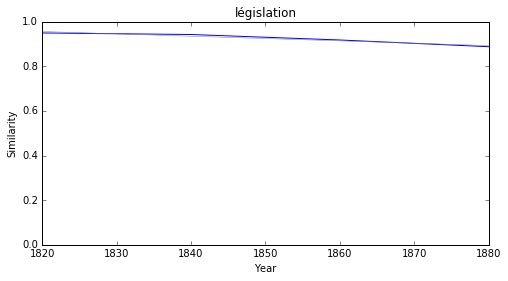

historique


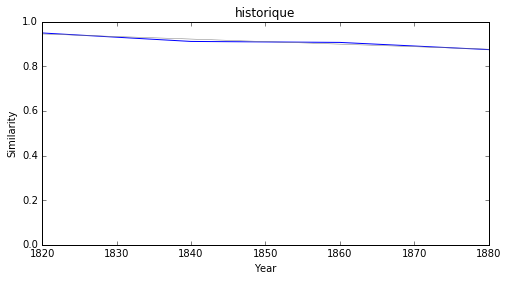

démocratie


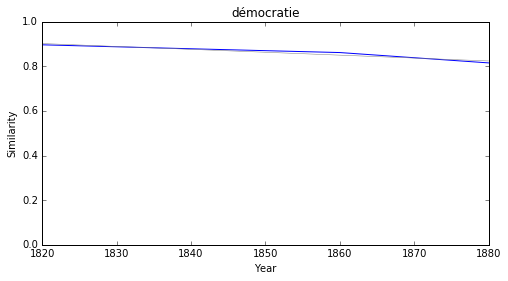

application


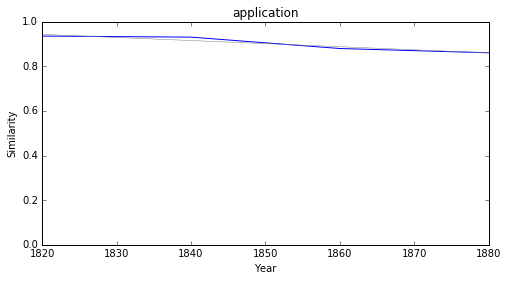

phénomène


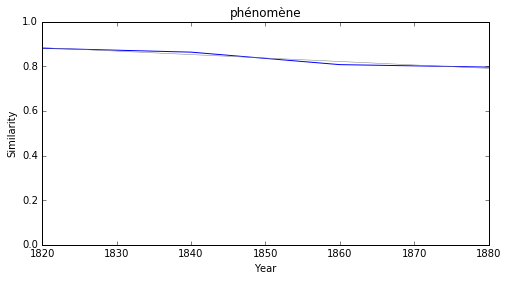

européen


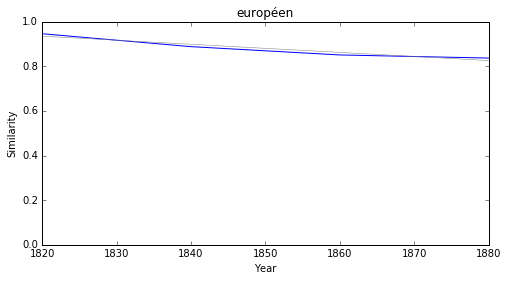

### <i><b>société</i></b>

           token     slope         p
47  enseignement -0.000700  0.043674
45   législation -0.001048  0.030707
84    historique -0.001139  0.035809
33    démocratie -0.001301  0.035032
0    application -0.001379  0.043726
43     phénomène -0.001547  0.035476
16      européen -0.001821  0.034444
98  conservateur -0.001905  0.042349
51         union -0.001916  0.007480
46       logique -0.002004  0.008464



enseignement


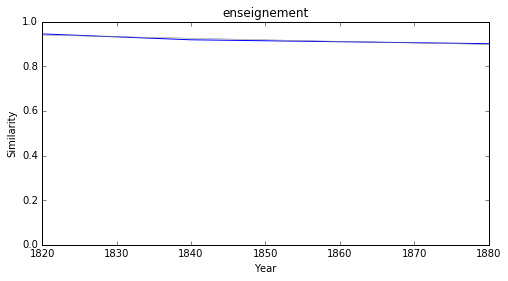

législation


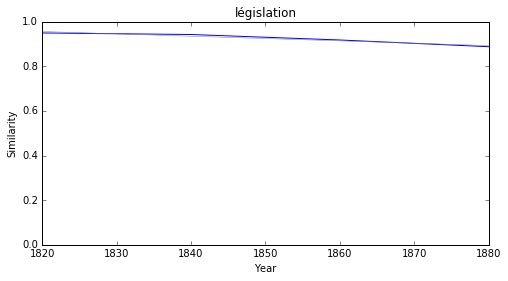

historique


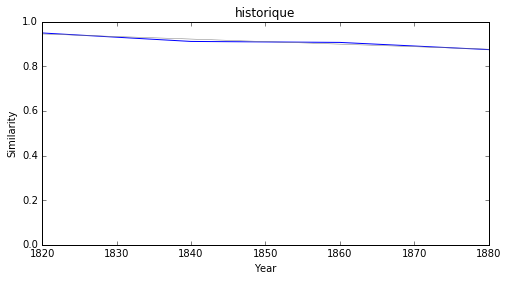

démocratie


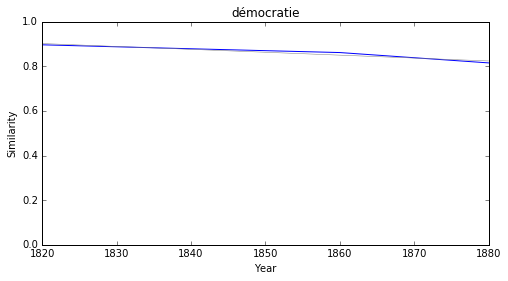

application


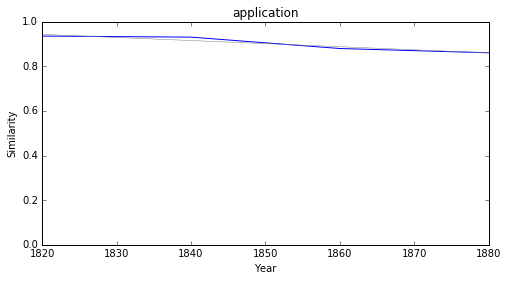

phénomène


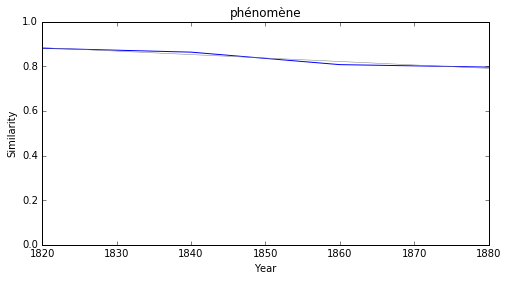

européen


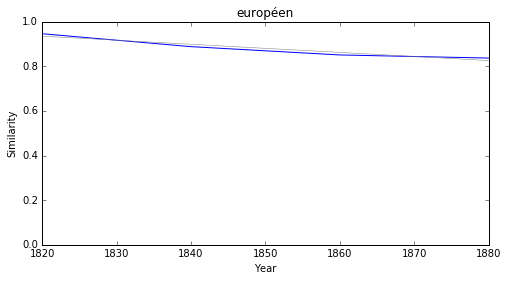

conservateur


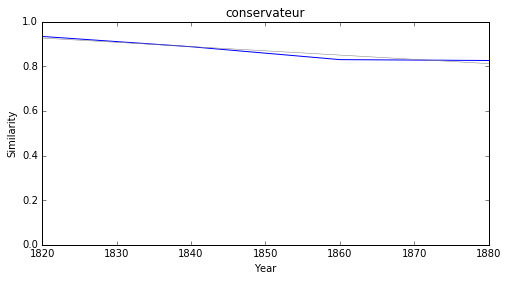

union


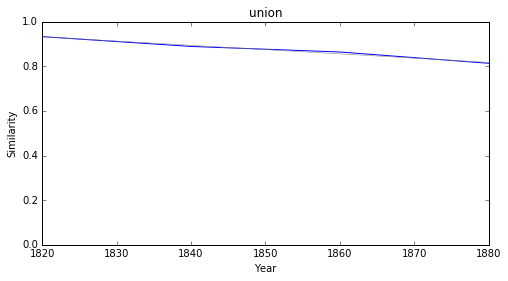

logique


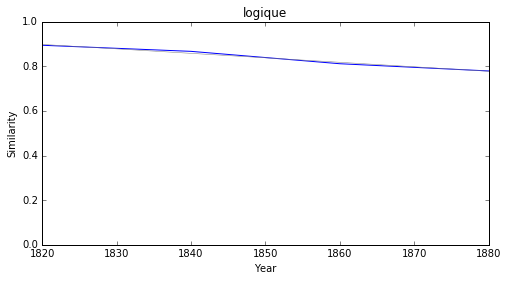

### <i><b>pouvoir</i></b>

          token     slope         p
6           oie  0.013846  0.047106
1      hobereau  0.013626  0.022700
2   calculateur  0.012838  0.001956
35       berner  0.010646  0.000805
22       adepte  0.008166  0.026672
36    confident  0.002479  0.000832
14    améliorer  0.001088  0.043888
38     détrôner -0.002702  0.042744
40        règle -0.002737  0.004658
23        usage -0.002985  0.034091



oie


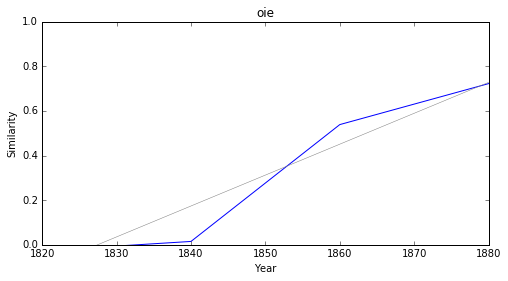

hobereau


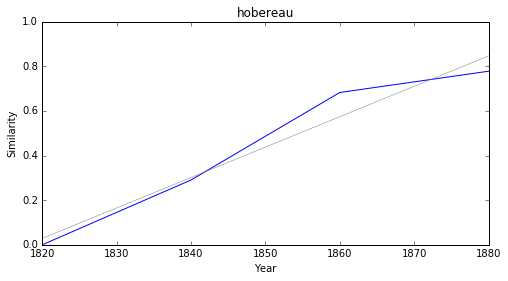

calculateur


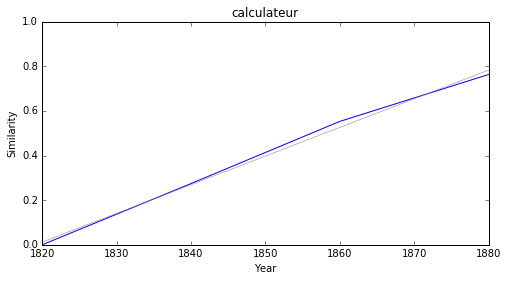

berner


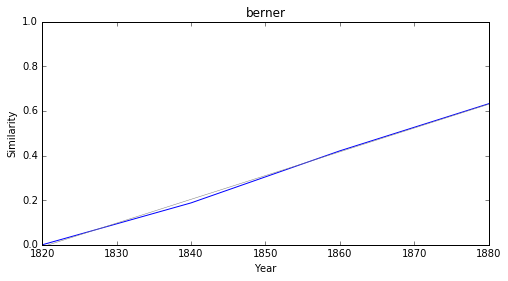

adepte


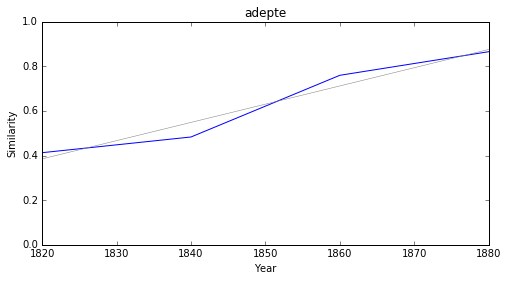

confident


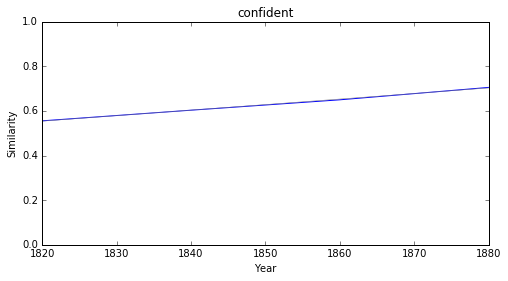

améliorer


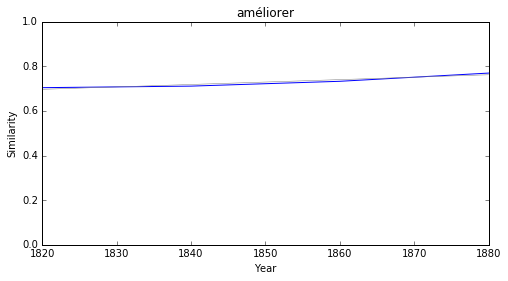

détrôner


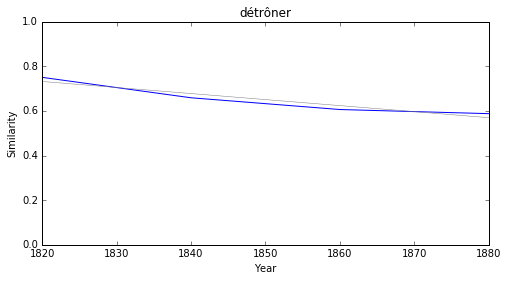

règle


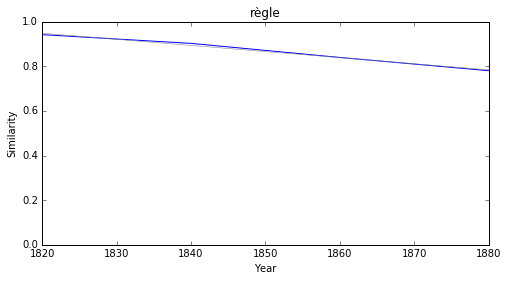

usage


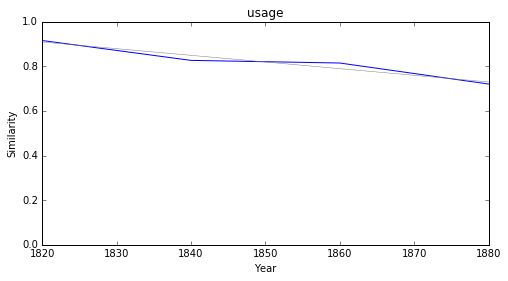

### <i><b>théologie</i></b>

           token     slope         p
40   positiviste  0.015063  0.002245
29       breslau  0.014644  0.015732
46       mayence  0.014247  0.017184
14   notoirement  0.014000  0.048973
15        genèse  0.012376  0.018918
20     arbitrage  0.011269  0.003807
7      orthodoxe  0.003419  0.002439
51   suppression  0.001464  0.040740
57  traditionnel  0.001363  0.007826
28  enseignement -0.000700  0.043674



positiviste


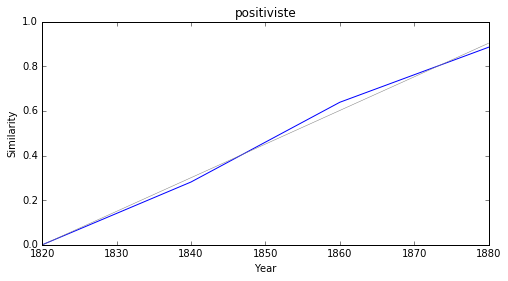

breslau


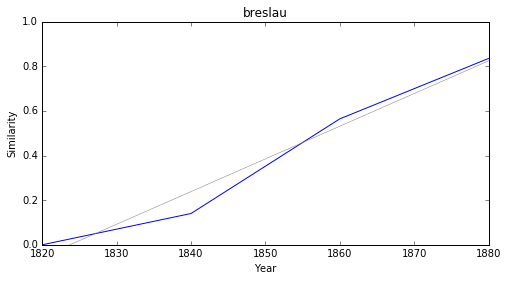

mayence


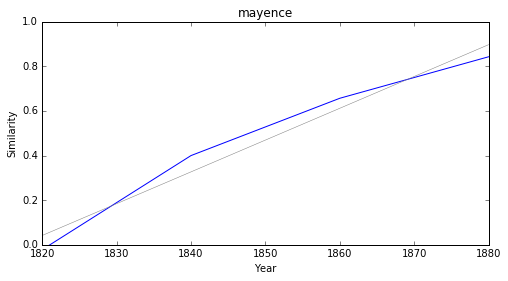

notoirement


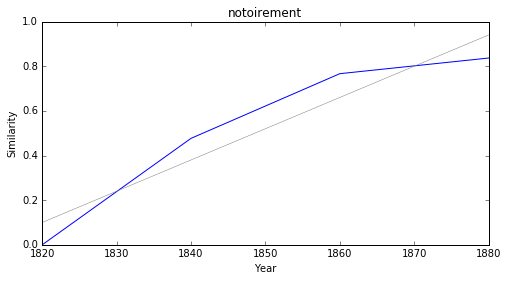

genèse


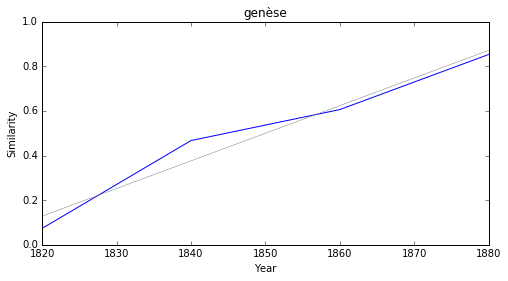

arbitrage


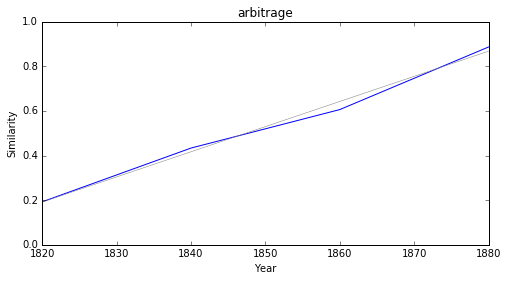

orthodoxe


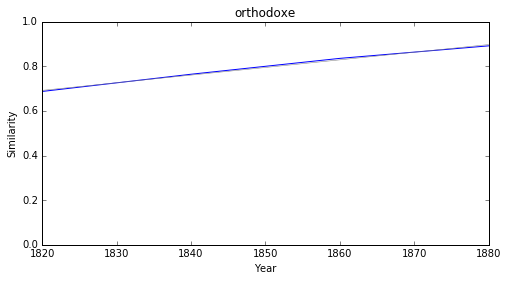

suppression


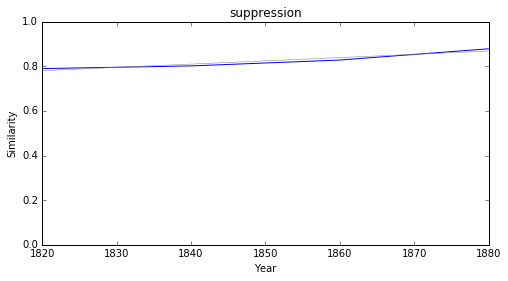

traditionnel


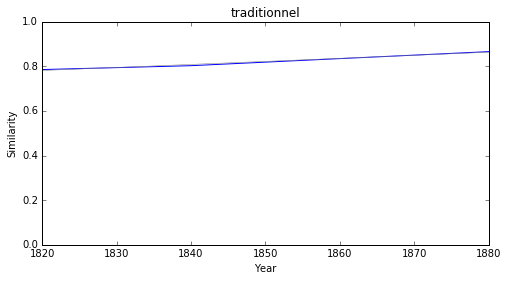

enseignement


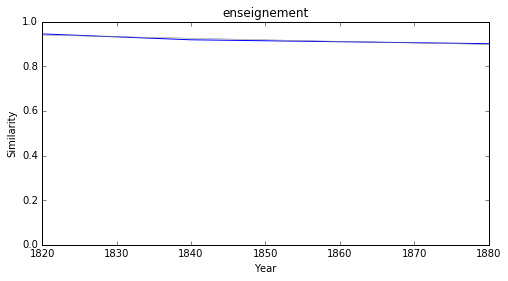

### <i><b>droit</i></b>

           token     slope         p
33  enseignement -0.000700  0.043674
23    démocratie -0.001301  0.035032
0    application -0.001379  0.043726
10      européen -0.001821  0.034444
74  conservateur -0.001905  0.042349
35         union -0.001916  0.007480
34       méthode -0.002108  0.007290
65      religion -0.002319  0.043812
28      concours -0.002505  0.029292
16  indépendance -0.002529  0.031711



enseignement


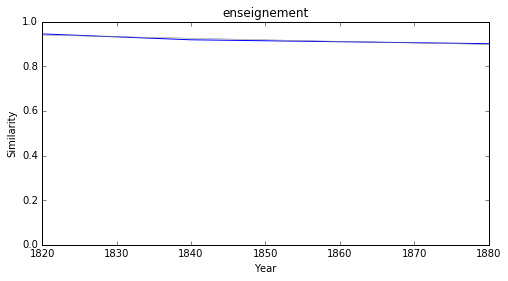

démocratie


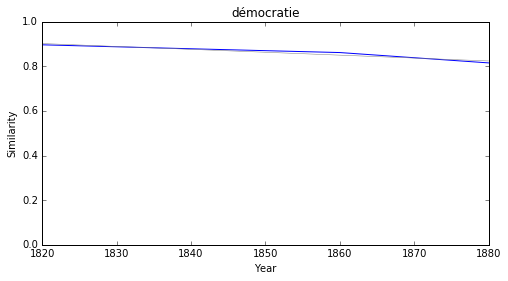

application


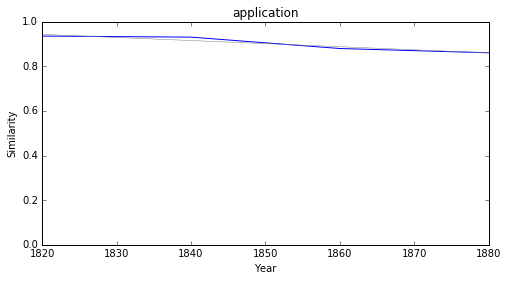

européen


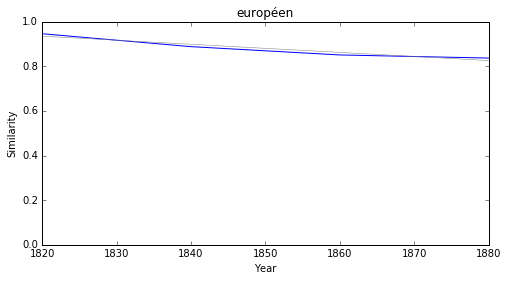

conservateur


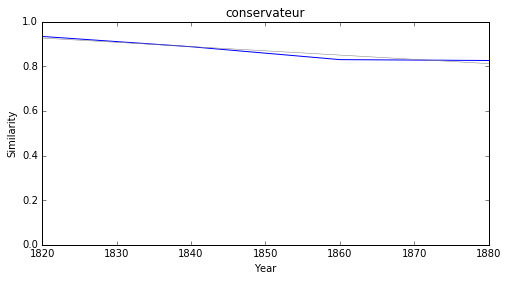

union


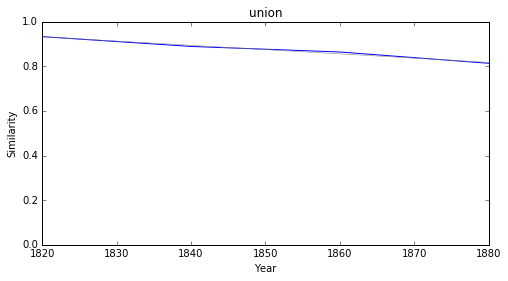

méthode


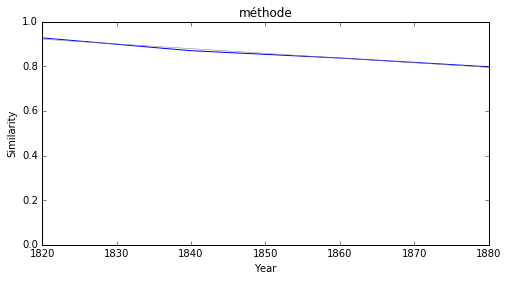

religion


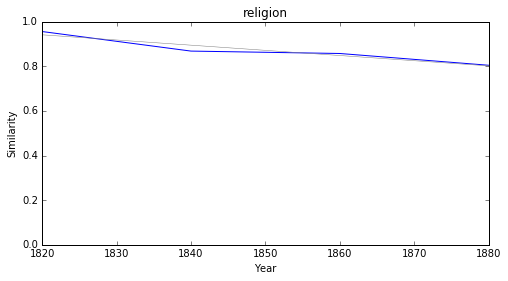

concours


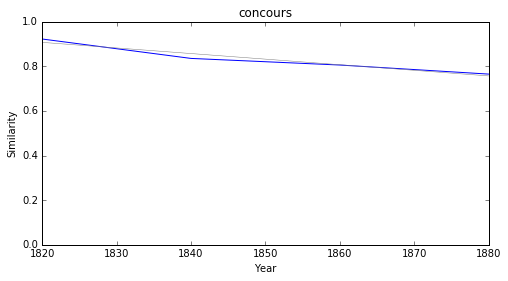

indépendance


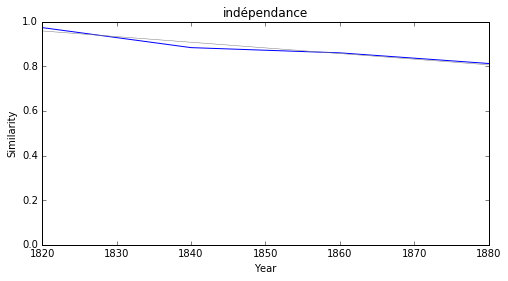

### <i><b>loi</i></b>

             token     slope         p
52    enseignement -0.000700  0.043674
51     législation -0.001048  0.030707
89      historique -0.001139  0.035809
37      démocratie -0.001301  0.035032
0      application -0.001379  0.043726
49       phénomène -0.001547  0.035476
16        européen -0.001821  0.034444
105   conservateur -0.001905  0.042349
56           union -0.001916  0.007480
9    établissement -0.002051  0.003521



enseignement


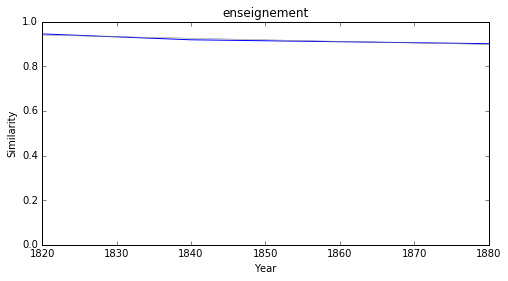

législation


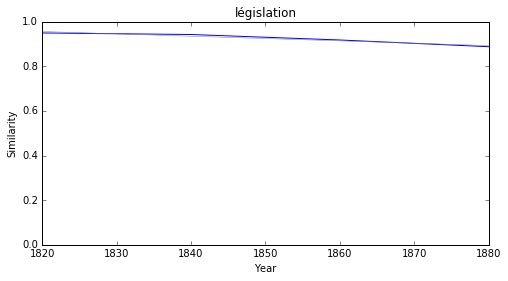

historique


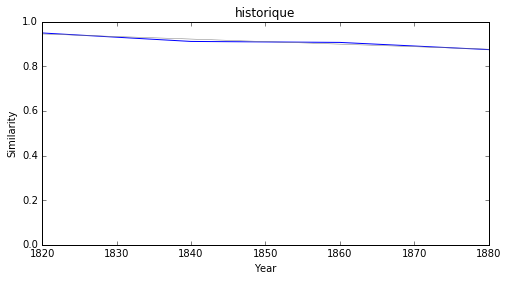

démocratie


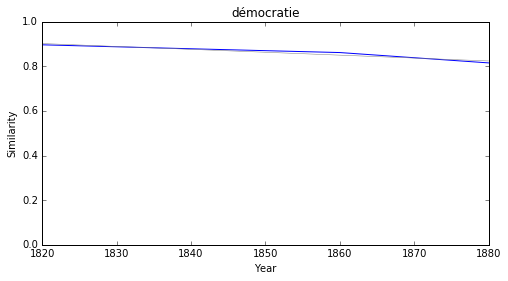

application


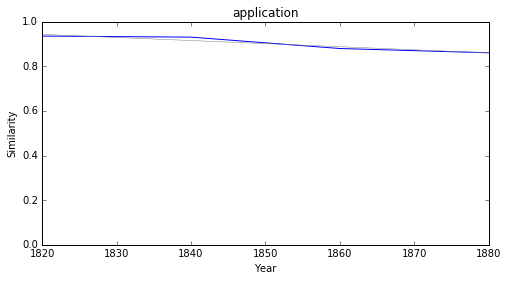

phénomène


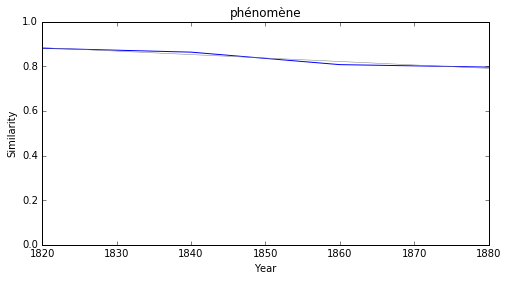

européen


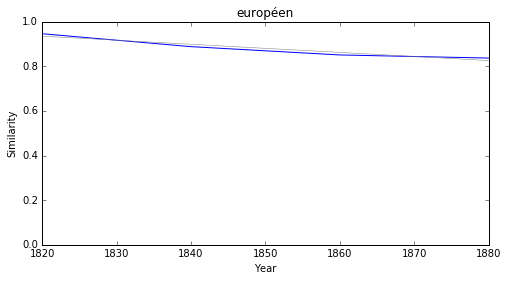

conservateur


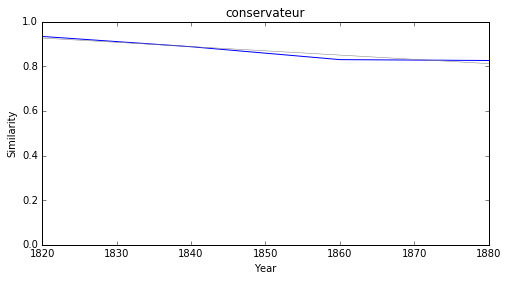

union


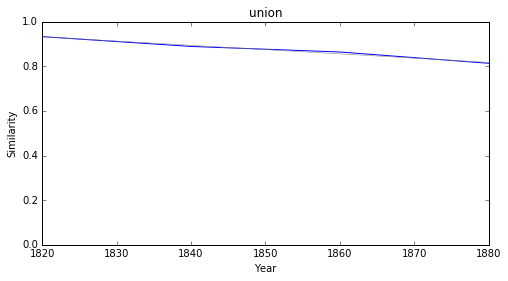

établissement


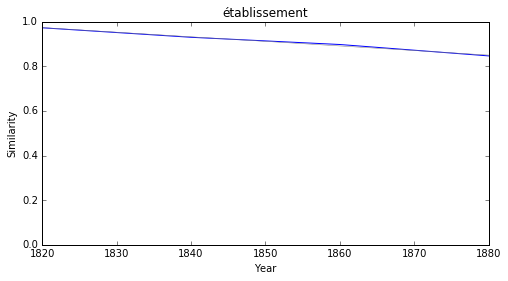

### <i><b>méthode</i></b>

           token     slope         p
9        quinine  0.014613  0.036129
34        adepte  0.008166  0.026672
22  enseignement -0.000700  0.043674
47    historique -0.001139  0.035809
14    démocratie -0.001301  0.035032
0    application -0.001379  0.043726
55    protecteur -0.001627  0.013806
64      minorité -0.001894  0.044061
54  conservateur -0.001905  0.042349
23         union -0.001916  0.007480



quinine


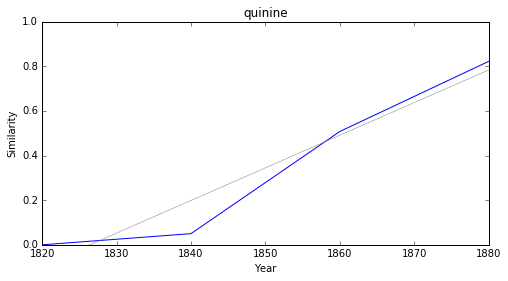

adepte


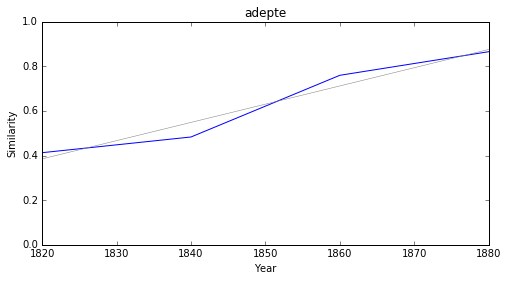

enseignement


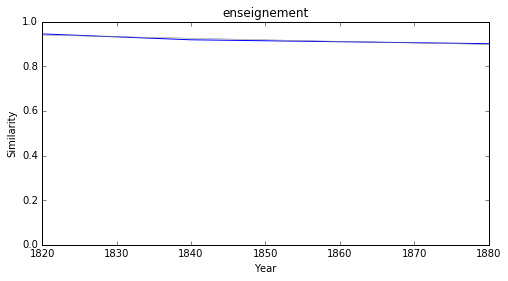

historique


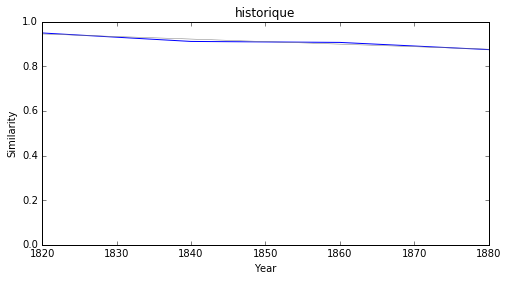

démocratie


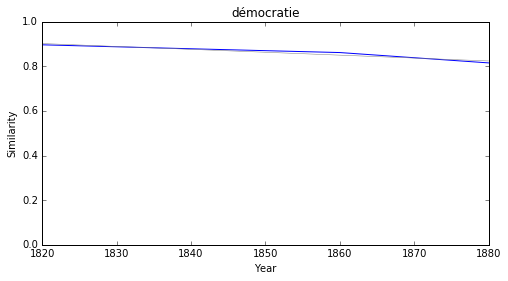

application


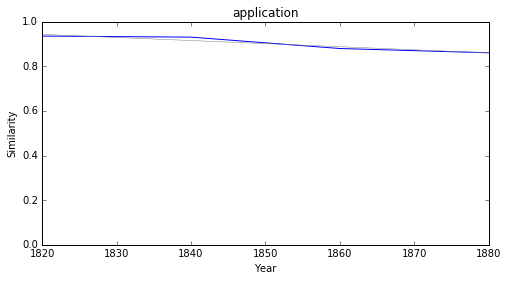

protecteur


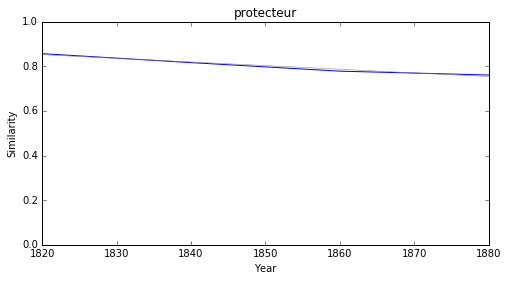

minorité


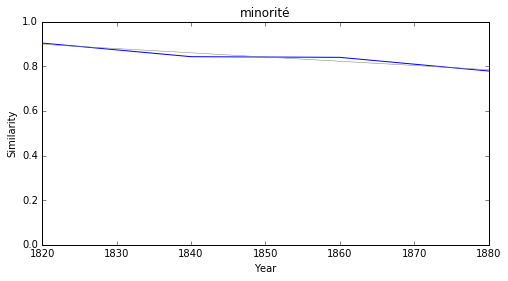

conservateur


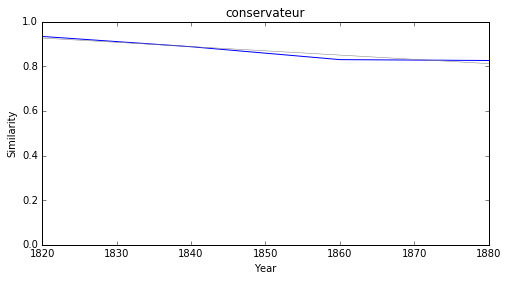

union


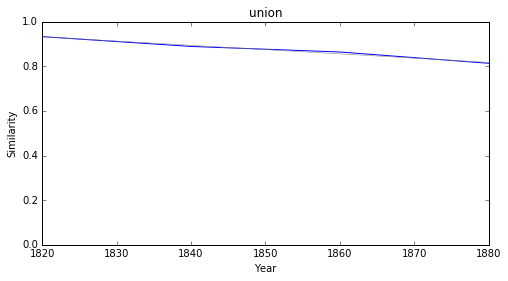

### <i><b>génie</i></b>

            token     slope         p
41   enseignement -0.000700  0.043674
71     historique -0.001139  0.035809
28     démocratie -0.001301  0.035032
0     application -0.001379  0.043726
38      phénomène -0.001547  0.035476
83     protecteur -0.001627  0.013806
81   conservateur -0.001905  0.042349
43          union -0.001916  0.007480
40        logique -0.002004  0.008464
8   établissement -0.002051  0.003521



enseignement


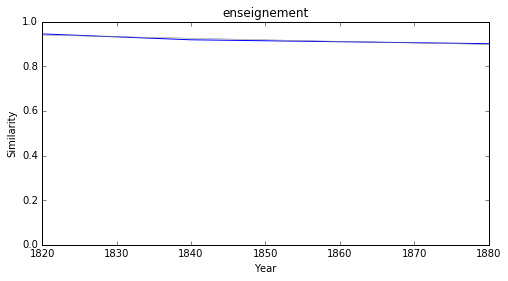

historique


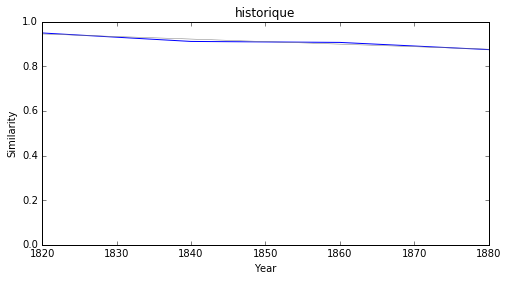

démocratie


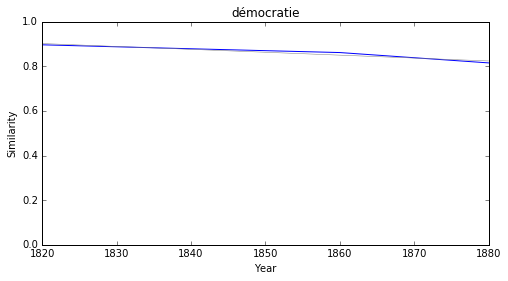

application


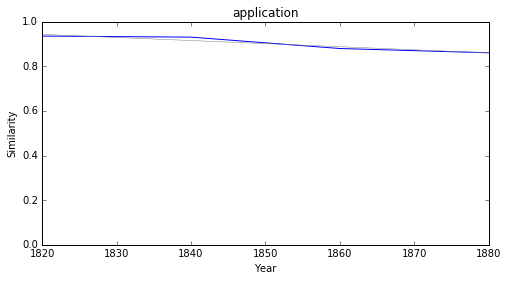

phénomène


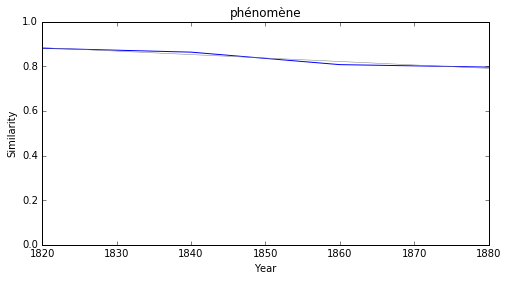

protecteur


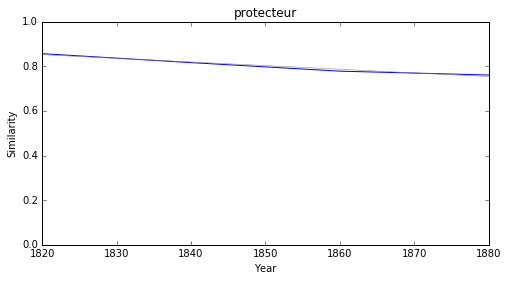

conservateur


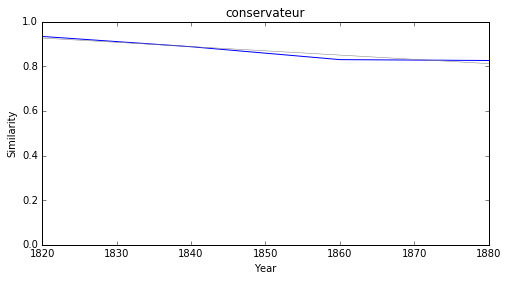

union


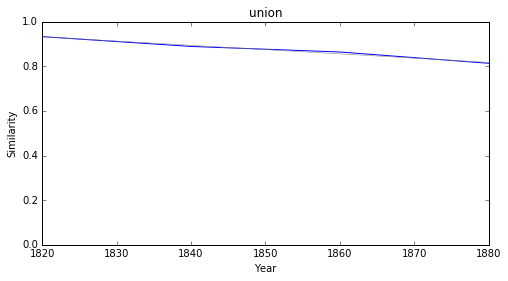

logique


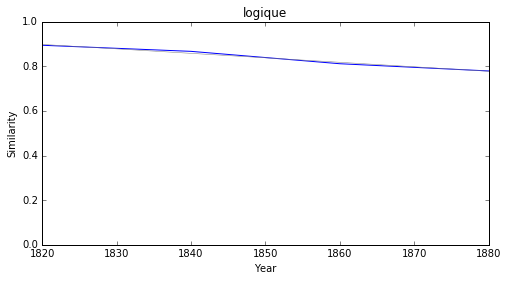

établissement


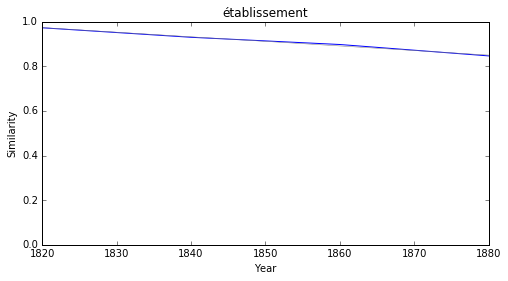

### <i><b>romantisme</i></b>

          token     slope         p
46    accession  0.017621  0.023000
5   physiologie  0.015517  0.039857
31   peccadille  0.015273  0.005023
37  positiviste  0.015063  0.002245
7            li  0.015011  0.044101
15       tcheou  0.014153  0.043903
13  notoirement  0.014000  0.048973
4          pion  0.013407  0.015601
11        vexer  0.009911  0.015376
36          ouï  0.009253  0.025811



accession


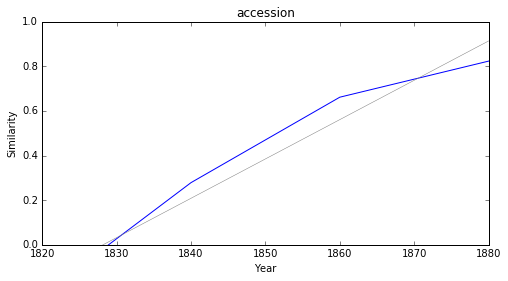

physiologie


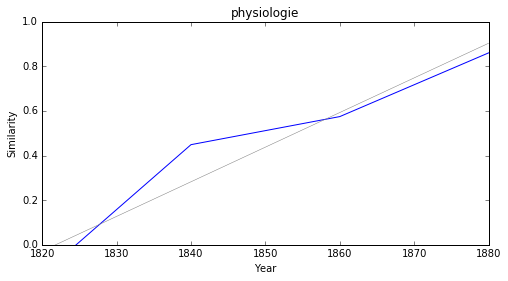

peccadille


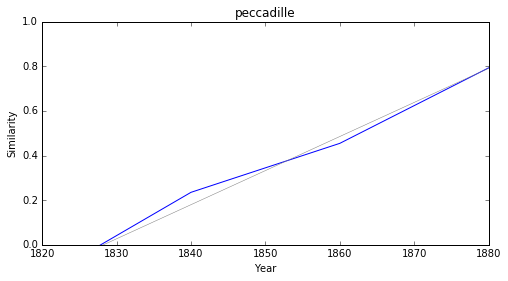

positiviste


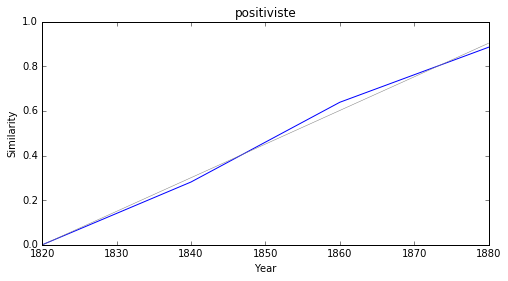

li


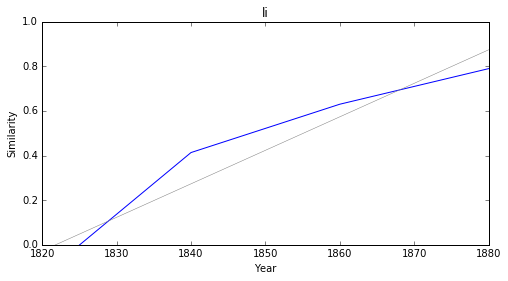

tcheou


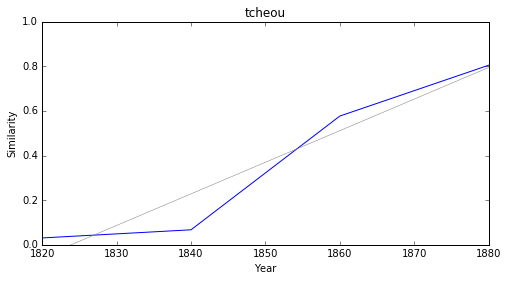

notoirement


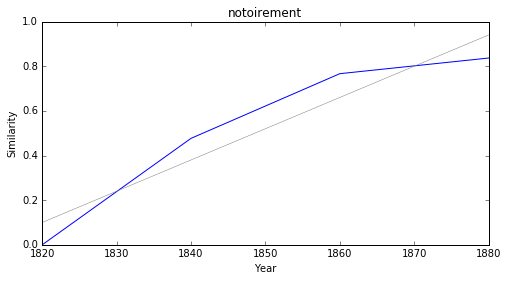

pion


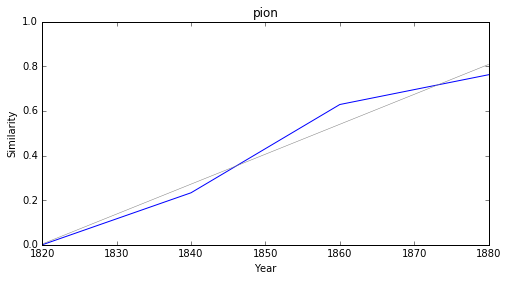

vexer


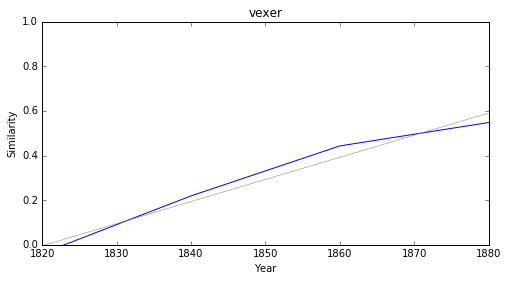

ouï


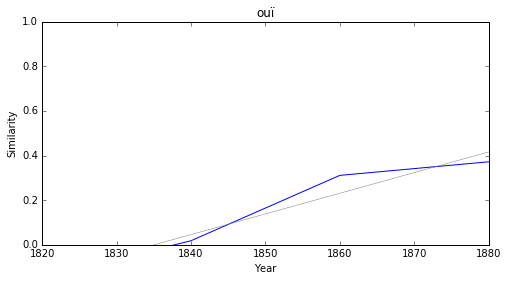

### <i><b>réalisme</i></b>

           token     slope         p
17    périphrase  0.016431  0.005302
4   récalcitrant  0.015409  0.040560
6          vitry  0.015351  0.041660
23         moisi  0.014890  0.038291
18    restrictif  0.014486  0.031349
26      conradin  0.014250  0.046304
12        zénith  0.014126  0.041786
25       picorer  0.014040  0.011145
1      somnolent  0.013115  0.026283
27         maret  0.012919  0.044024



périphrase


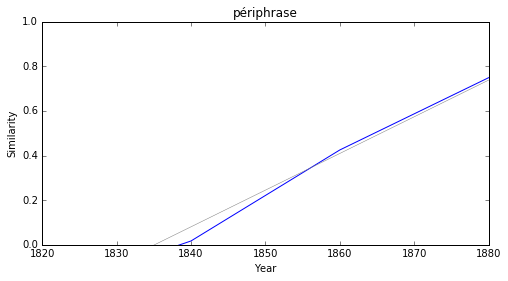

récalcitrant


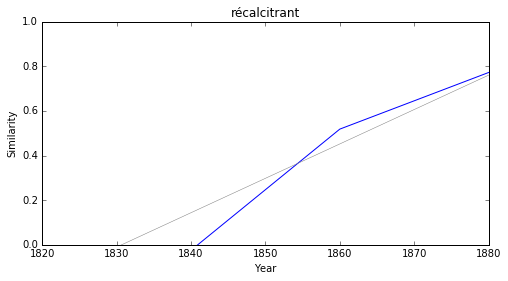

vitry


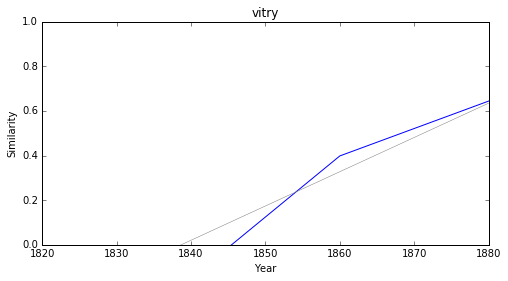

moisi


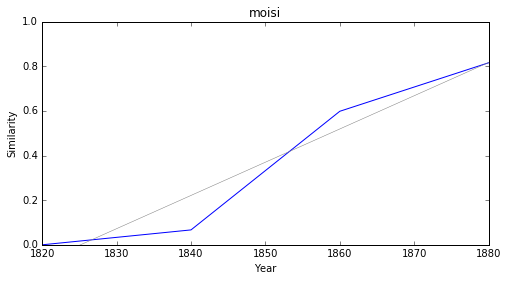

restrictif


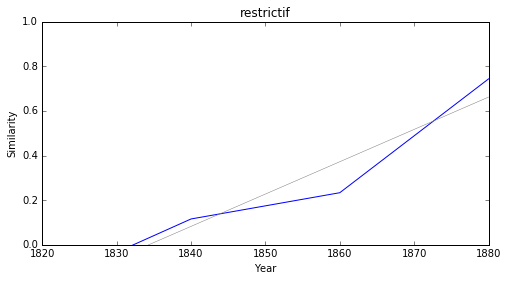

conradin


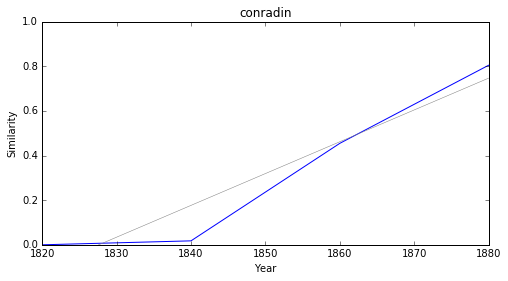

zénith


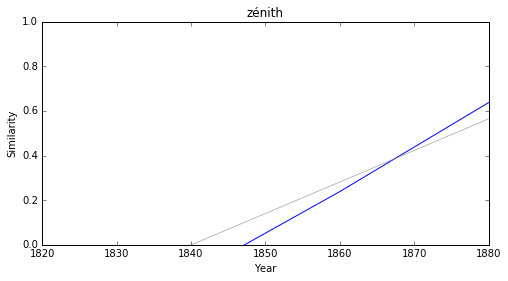

picorer


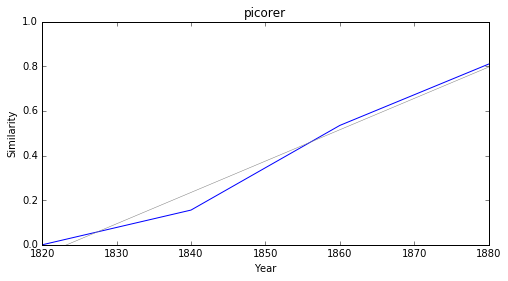

somnolent


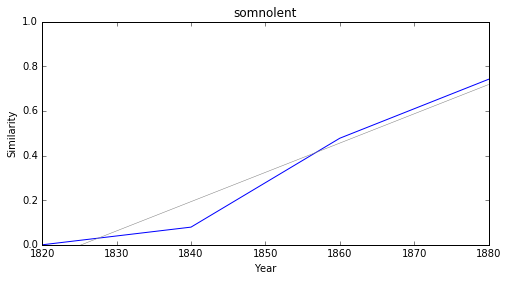

maret


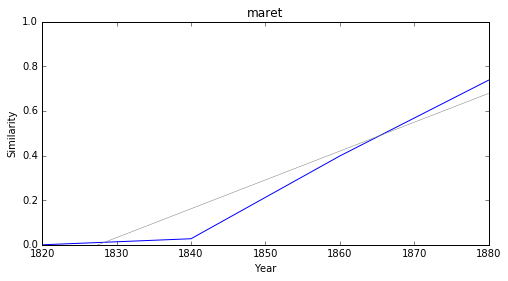

### <i><b>symbolisme</i></b>

             token     slope         p
22      peccadille  0.015273  0.005023
4      sauvegarder  0.014201  0.024549
17       renouveau  0.013568  0.042433
38       patronner  0.013059  0.039929
8         mécréant  0.011669  0.043233
25           huppé  0.011486  0.034064
33  tourbillonnant  0.011226  0.035190
1          ontario  0.010227  0.039925
3           couvre  0.009487  0.016300
7             hung  0.009457  0.002730



peccadille


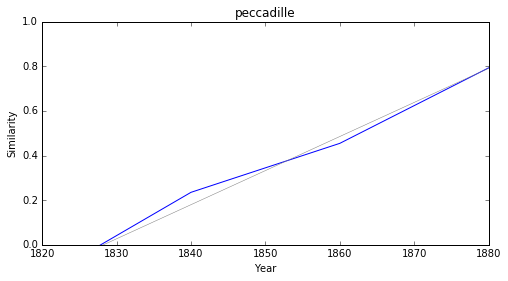

sauvegarder


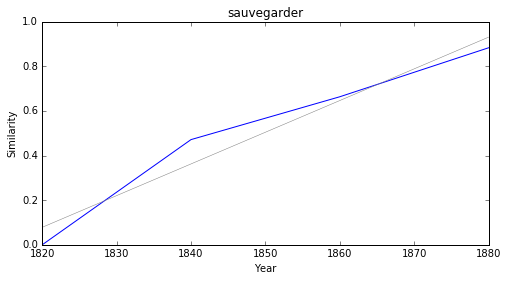

renouveau


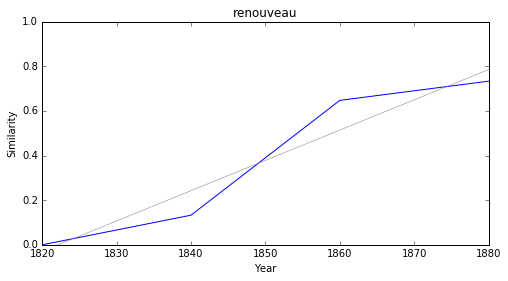

patronner


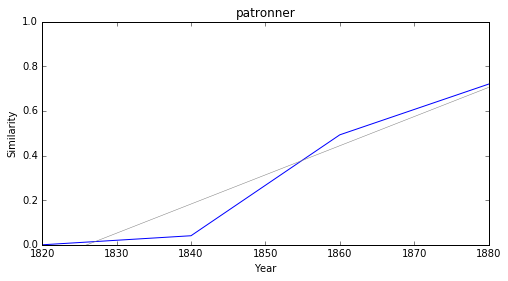

mécréant


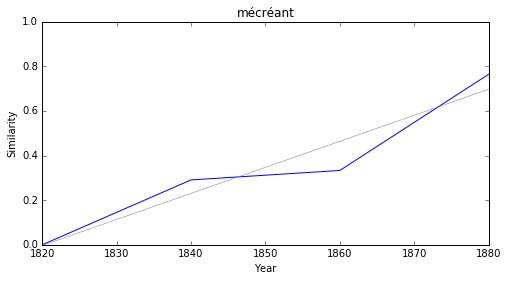

huppé


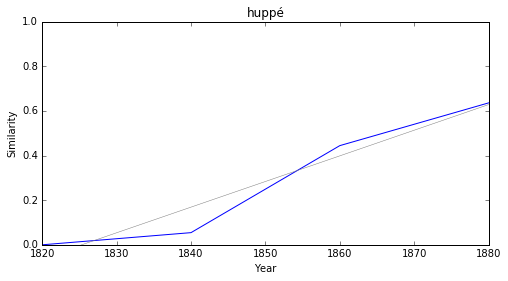

tourbillonnant


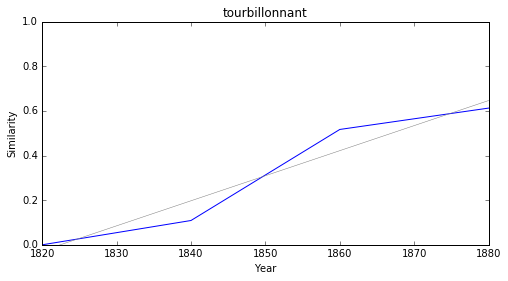

ontario


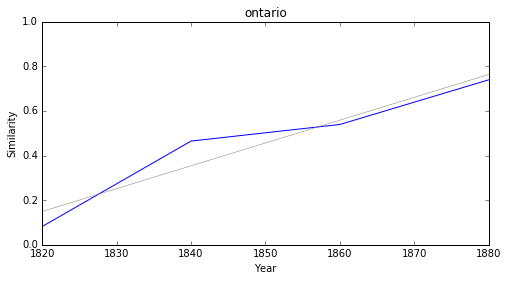

couvre


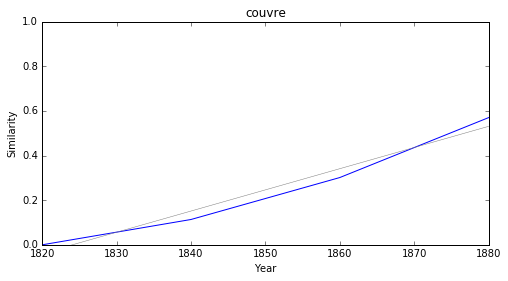

hung


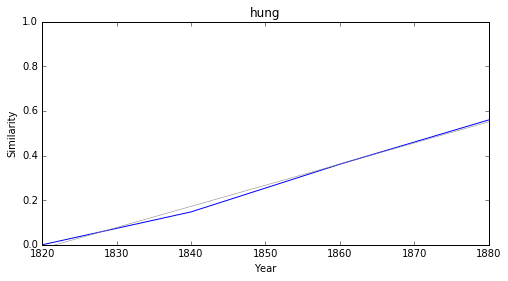

### <i><b>naturalisme</i></b>

          token     slope         p
5    dogmatisme  0.015648  0.023681
10        vitry  0.015351  0.041660
22  positiviste  0.015063  0.002245
29        moisi  0.014890  0.038291
33     conradin  0.014250  0.046304
32      picorer  0.014040  0.011145
24      fashion  0.013928  0.044345
7    triumvirat  0.013106  0.041069
41           lé  0.012684  0.018735
16      augurer  0.012465  0.008103



dogmatisme


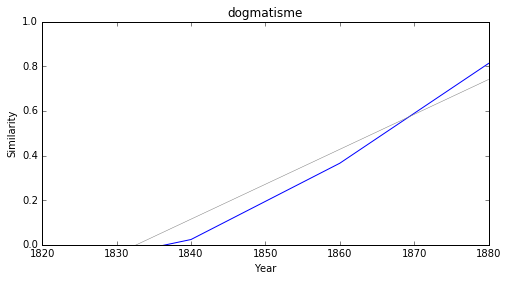

vitry


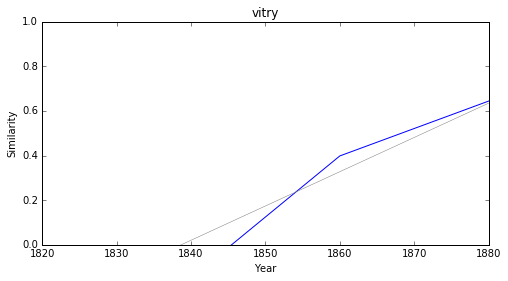

positiviste


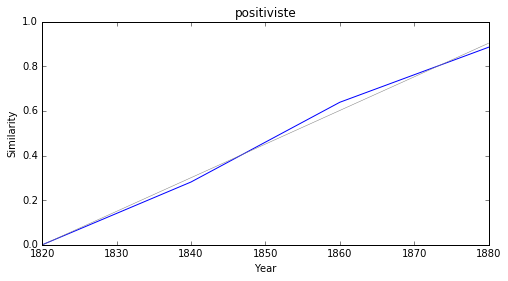

moisi


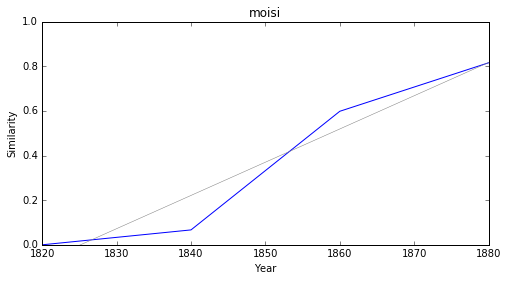

conradin


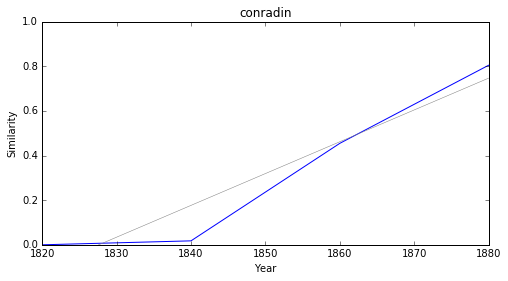

picorer


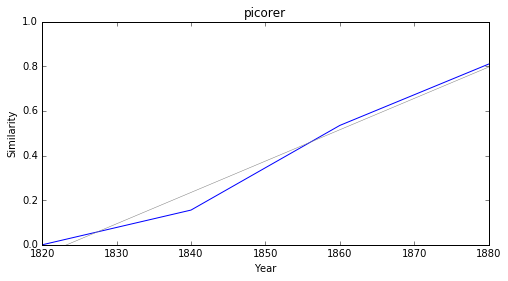

fashion


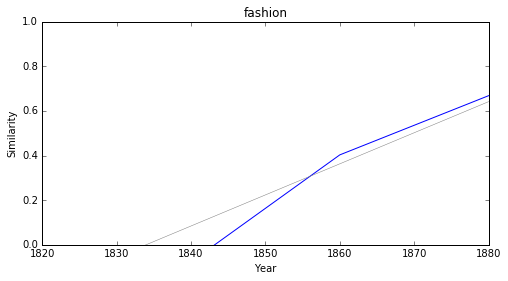

triumvirat


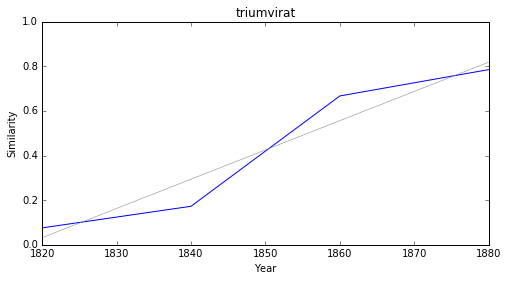

lé


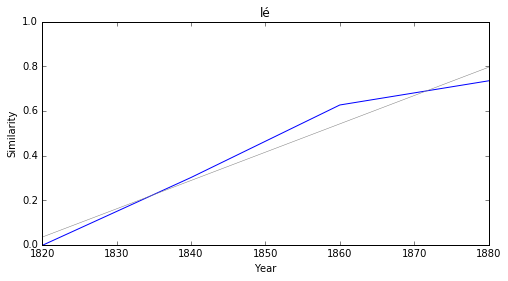

augurer


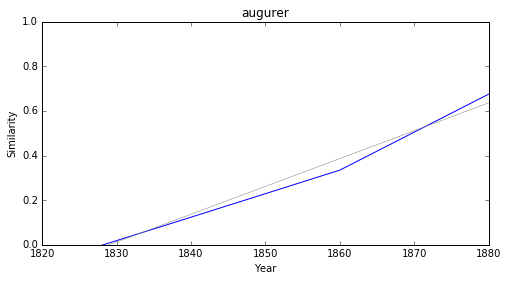

In [21]:
import pandas as pd
from IPython.display import Markdown, display
pd.set_option('display.max_rows', 1000)

for word in testList :
    display(Markdown("### <i><b>"+word+"</i></b>"))
    df1 = pd.DataFrame(entries[word], columns=('token', 'slope', 'p'))
    print(df1.sort_values('slope', ascending=False).head(10))
    print('\n\n')
    
    for i, row in df1.sort_values('slope', ascending=False).head(10).iterrows():
        plot_cosine_series('littérature', row['token'], 8, 4)

dogmatisme


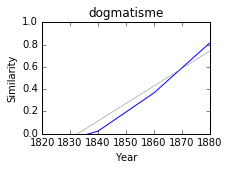

vitry


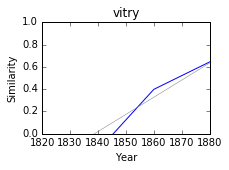

positiviste


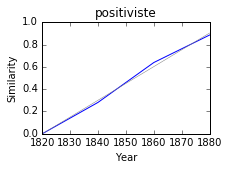

moisi


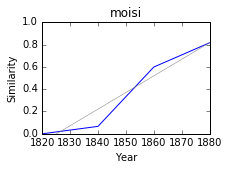

conradin


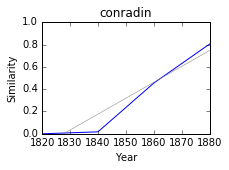

picorer


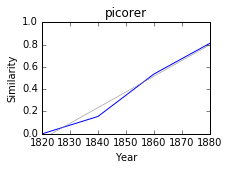

fashion


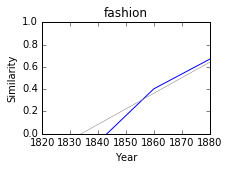

triumvirat


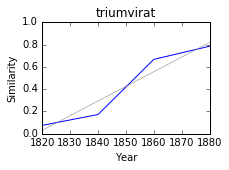

lé


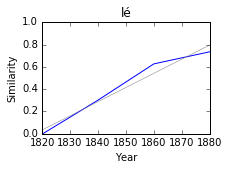

augurer


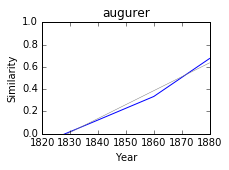

piqueur


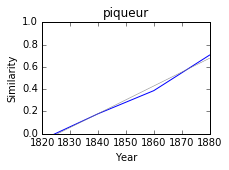

book


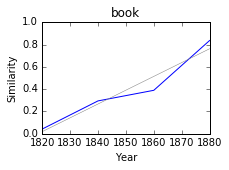

évasif


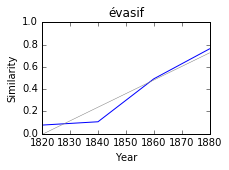

accueillant


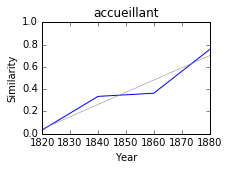

automate


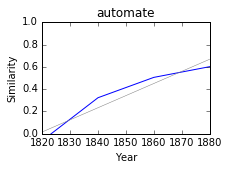

renonciation


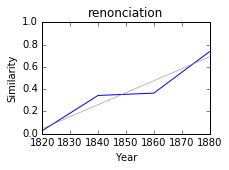

éplucher


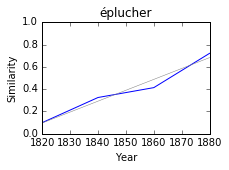

gratifier


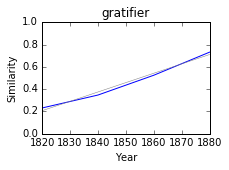

réjouissant


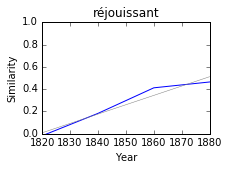

martel


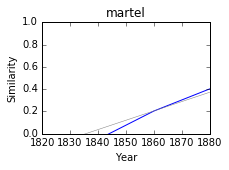

In [22]:
for i, row in df1.sort_values('slope', ascending=False).head(20).iterrows():
    plot_cosine_series('littérature', row['token'], 3, 2)

# Decreasing

This is the same process here : we want to see which terms tend to <b>disassociate</b> themselves from "littérature" (by default, which you can change with the trained models). Then again, you have to check the p values. "transplantation", "choeur" and "philé" are not considered significant, "chaldéen" is, and "destination", "morceau", etc. are as well. The fact that those are less significant is logical : the fewer the terms, the more erratic their series tend to be.

### <i><b>littérature</i></b>

         token     slope         p
76   géographe -0.015757  0.027133
65   mahométan -0.015267  0.037757
121   dialecte -0.013514  0.037056
25      cortès -0.012651  0.006905
126      étage -0.009194  0.014811
48     détroit -0.008516  0.001436
98      troupe -0.008314  0.017857
85       armée -0.007865  0.003266
106      ligne -0.007592  0.029598
112   barbarie -0.007355  0.003667



physiologie


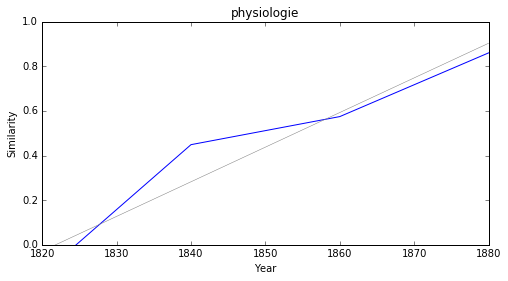

positiviste


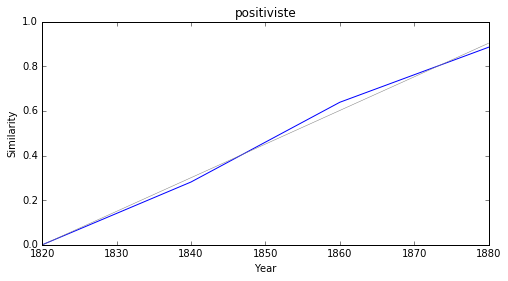

sauvegarder


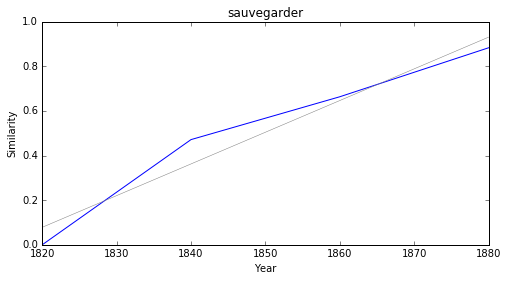

arbitrage


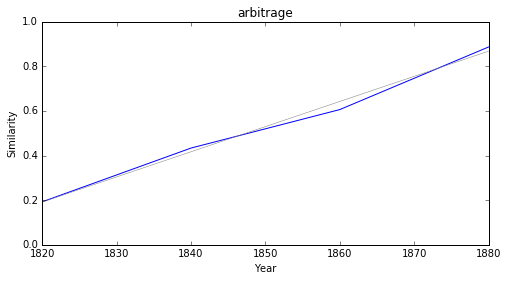

adepte


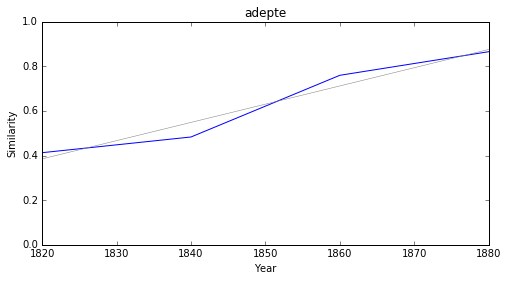

consécration


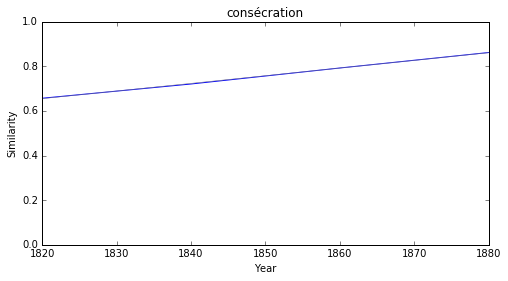

orthodoxe


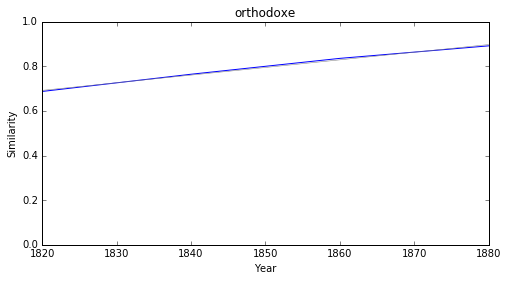

suppression


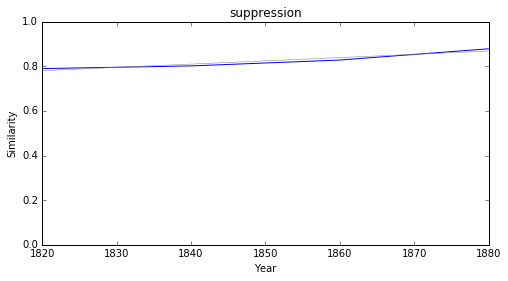

traditionnel


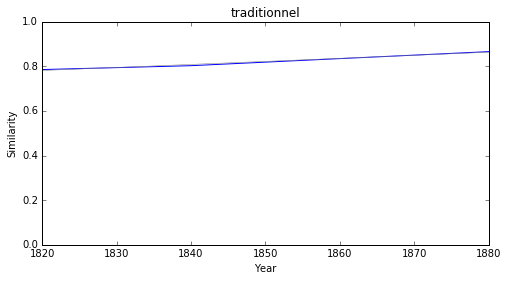

enseignement


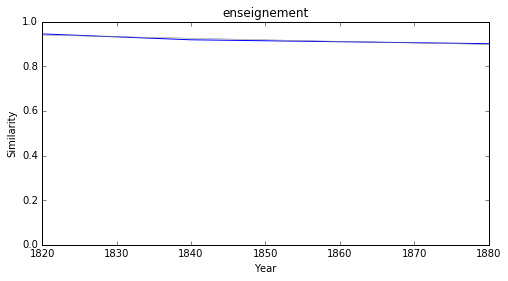

### <i><b>poésie</i></b>

         token     slope         p
19       mably -0.017628  0.014532
66   géographe -0.015757  0.027133
57   mahométan -0.015267  0.037757
102   dialecte -0.013514  0.037056
37     presque -0.010433  0.007303
33     détroit -0.008516  0.001436
17     lumière -0.008088  0.002398
88       corps -0.008030  0.032914
94    barbarie -0.007355  0.003667
81      sicile -0.007311  0.037781



infiltration


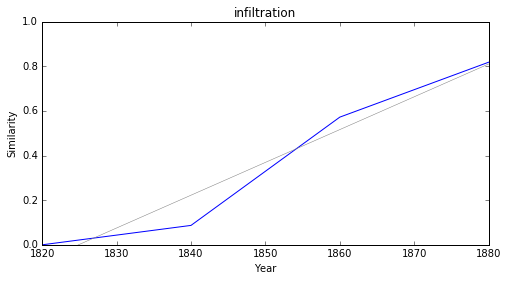

liquidation


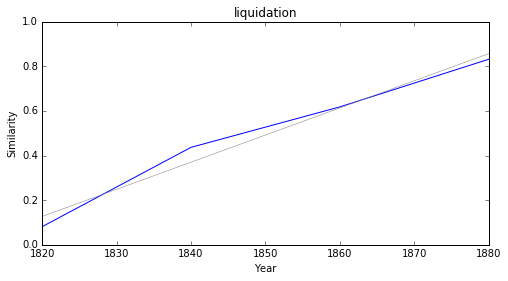

suppression


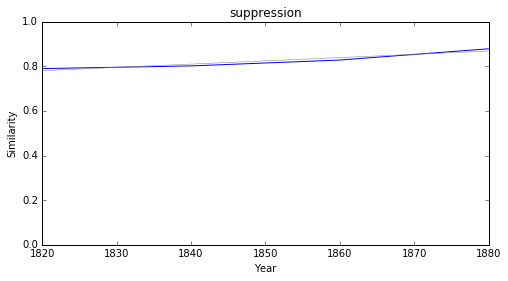

enseignement


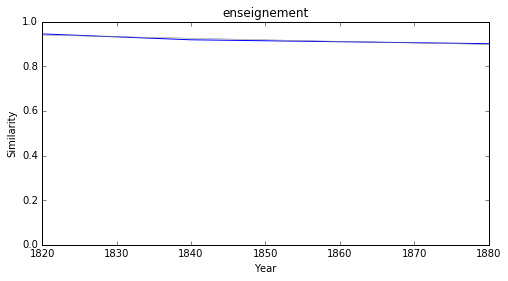

historique


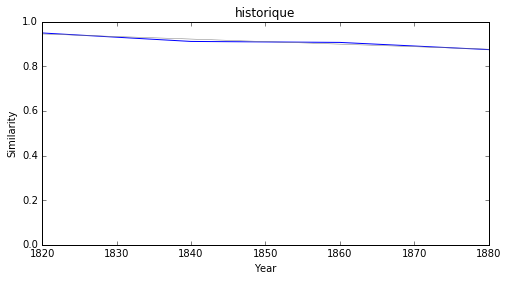

démocratie


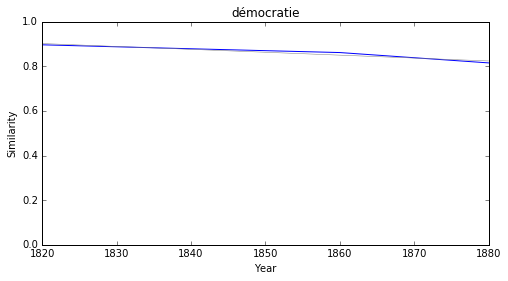

application


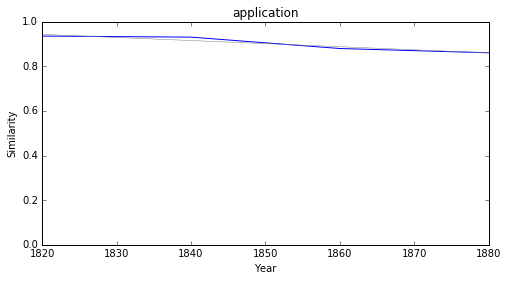

union


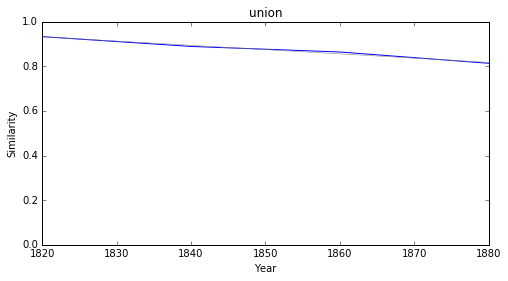

logique


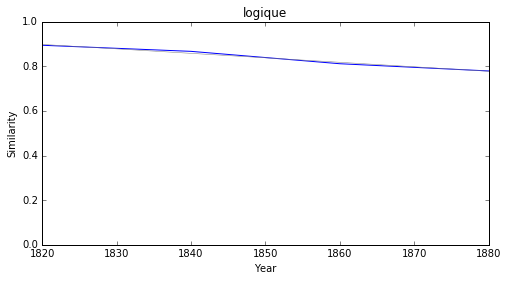

établissement


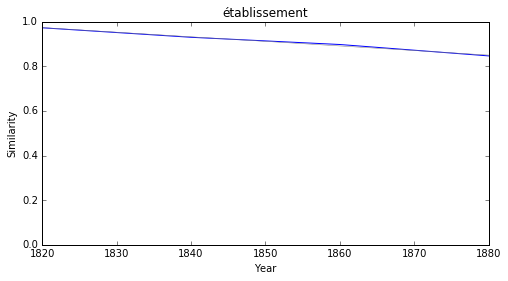

### <i><b>science</i></b>

         token     slope         p
67   géographe -0.015757  0.027133
60   mahométan -0.015267  0.037757
104   dialecte -0.013514  0.037056
40     détroit -0.008516  0.001436
84      troupe -0.008314  0.017857
20     lumière -0.008088  0.002398
101      trait -0.007424  0.035014
98    barbarie -0.007355  0.003667
82     couleur -0.006944  0.014286
71       masse -0.006567  0.025922



enseignement


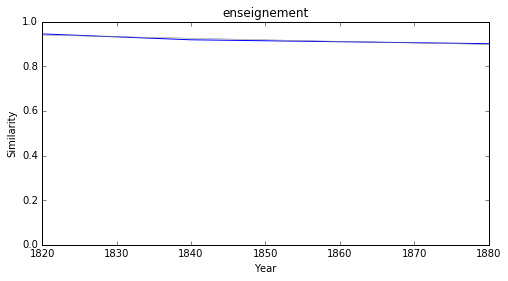

législation


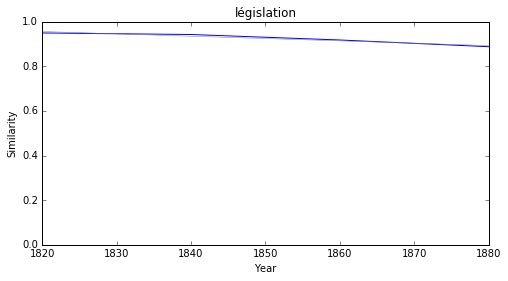

historique


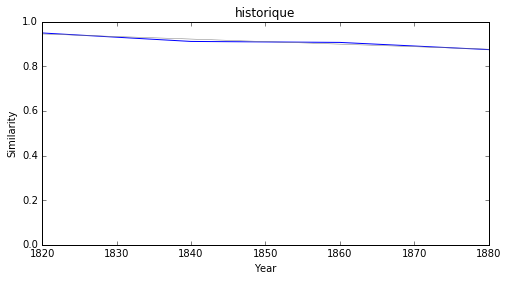

démocratie


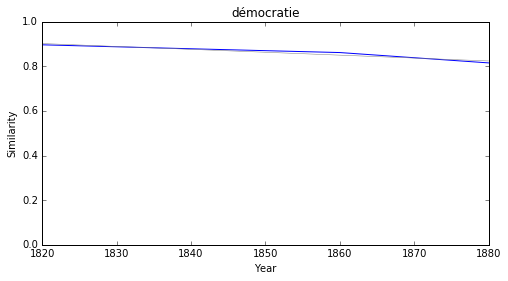

application


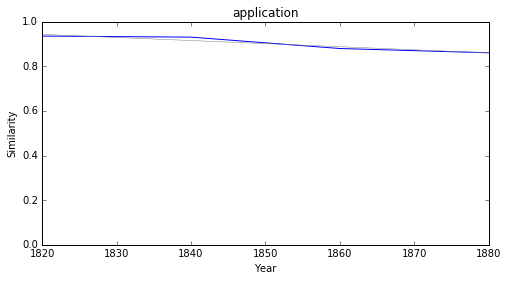

phénomène


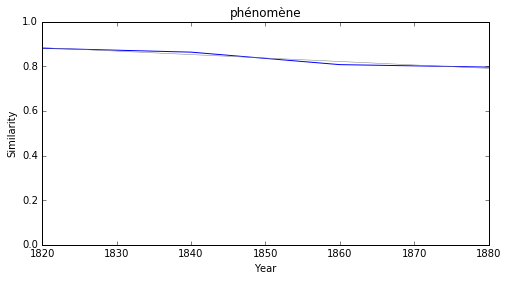

protecteur


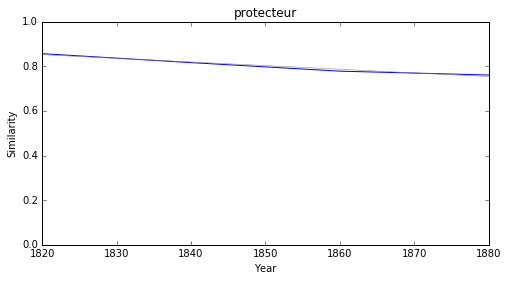

européen


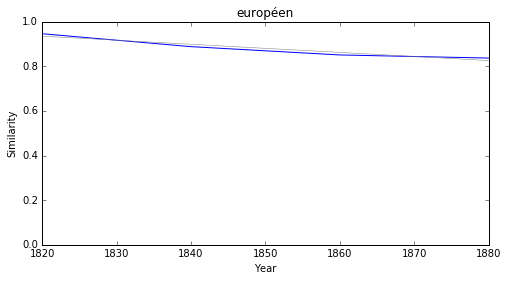

conservateur


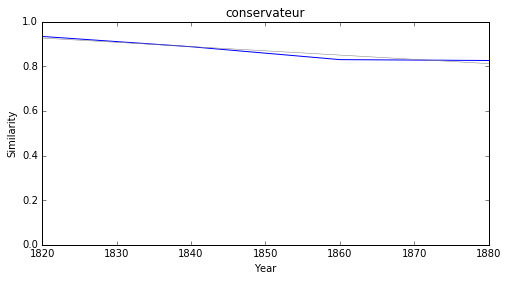

union


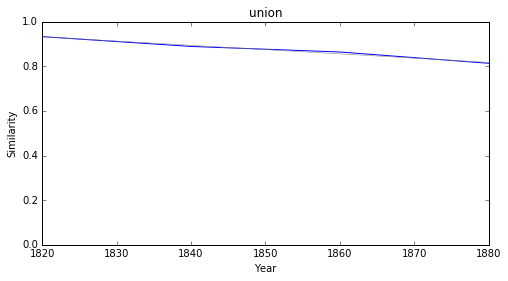

### <i><b>savoir</i></b>

           token     slope         p
3         chacal -0.008920  0.000457
1        appeler -0.007226  0.039331
5   connaissance -0.004738  0.012819
8      intention -0.004164  0.023288
9       posséder -0.003813  0.022901
2         crotté -0.003682  0.015536
10      détrôner -0.002702  0.042744
11     patienter  0.008329  0.033861
7          fêler  0.009469  0.011227
4   décontenancé  0.011693  0.004711



hobereau


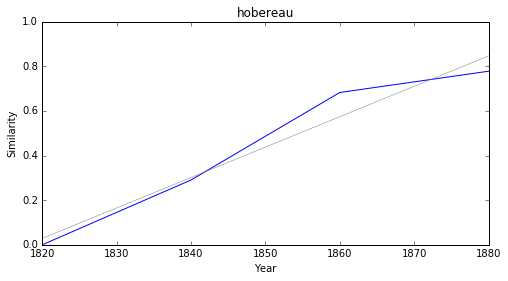

ébruiter


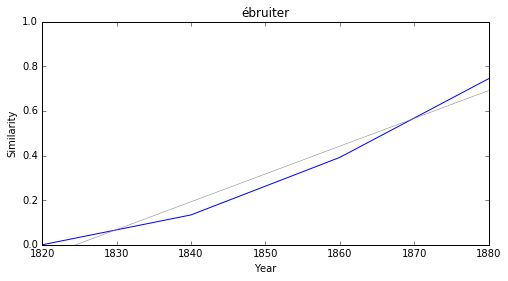

décontenancé


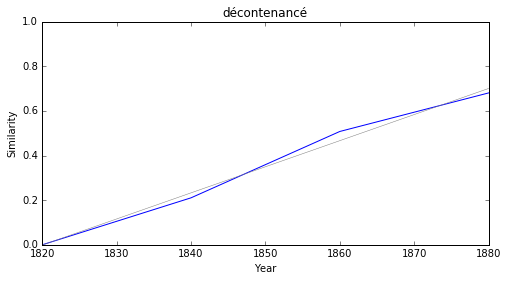

fêler


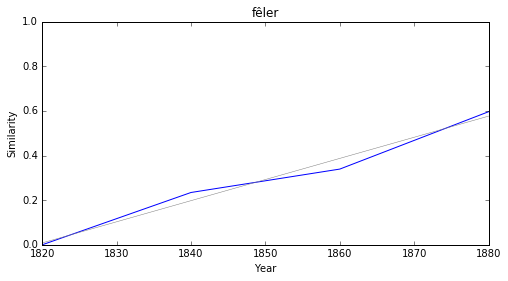

patienter


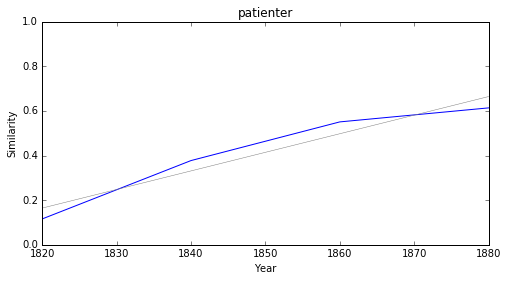

détrôner


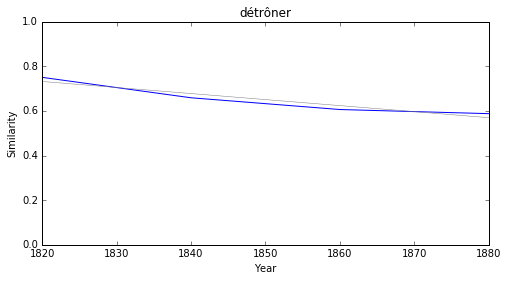

crotté


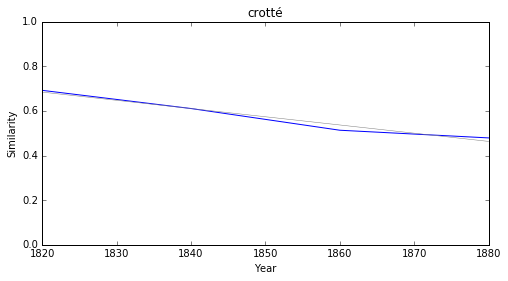

posséder


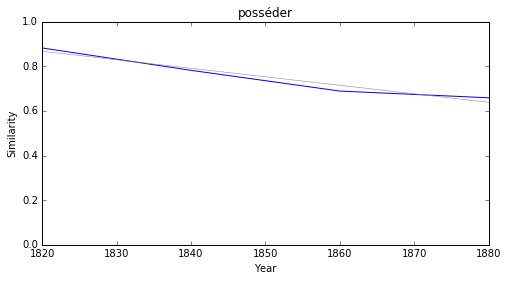

intention


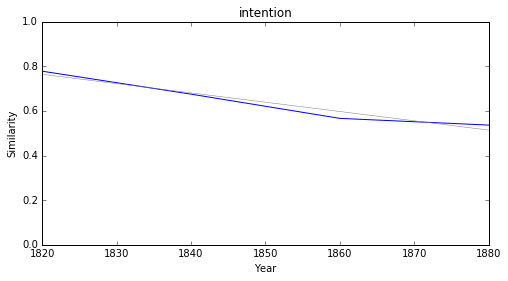

connaissance


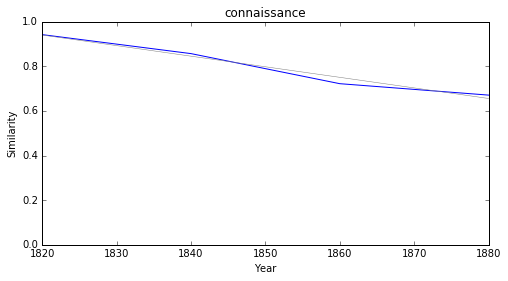

### <i><b>histoire</i></b>

             token     slope         p
113       dialecte -0.013514  0.037056
61    bouffonnerie -0.009243  0.004717
38         détroit -0.008516  0.001436
54   collaboration -0.008274  0.001437
96           corps -0.008030  0.032914
79           armée -0.007865  0.003266
109          trait -0.007424  0.035014
105       barbarie -0.007355  0.003667
87          sicile -0.007311  0.037781
31          former -0.007283  0.027157



mirage


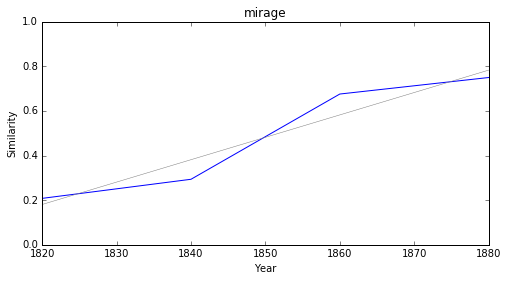

enseignement


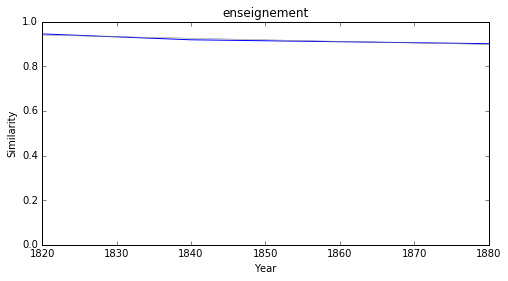

législation


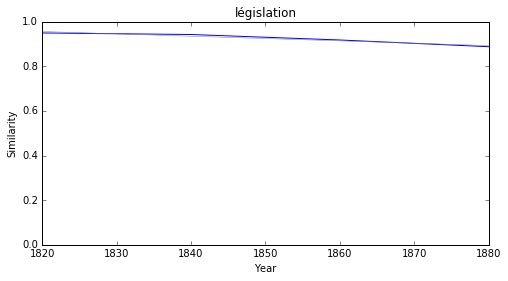

historique


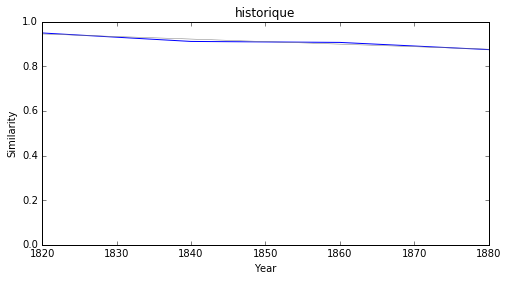

démocratie


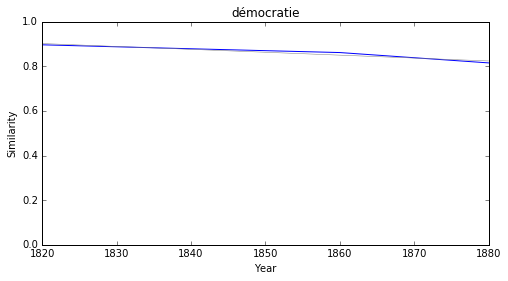

application


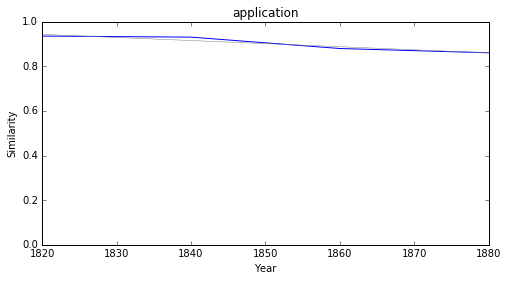

phénomène


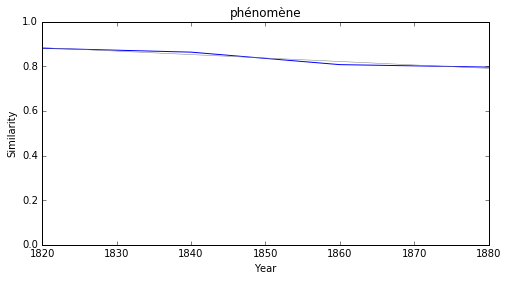

conservateur


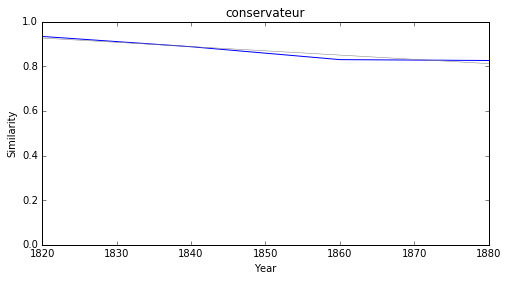

union


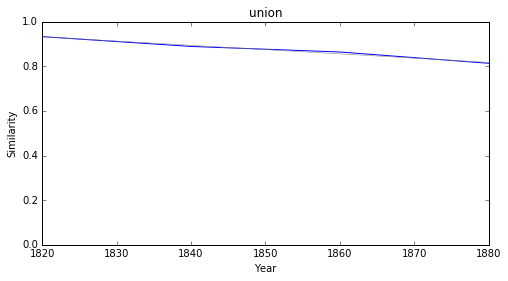

logique


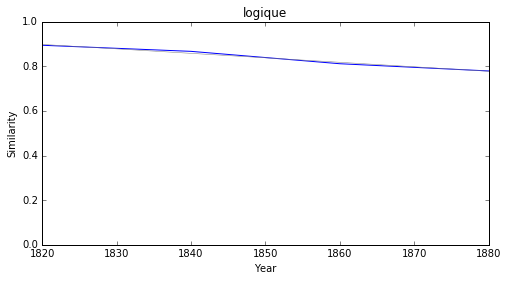

### <i><b>philosophie</i></b>

         token     slope         p
66   géographe -0.015757  0.027133
86        java -0.013419  0.044175
72       large -0.008632  0.047536
37     détroit -0.008516  0.001436
61     passage -0.008434  0.041818
103      tigre -0.008169  0.020246
17     lumière -0.008088  0.002398
89       ligne -0.007592  0.029598
65    dispersé -0.007445  0.004885
45     dixième -0.007439  0.000454



liquidation


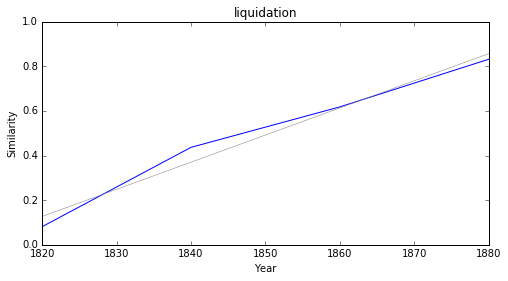

suppression


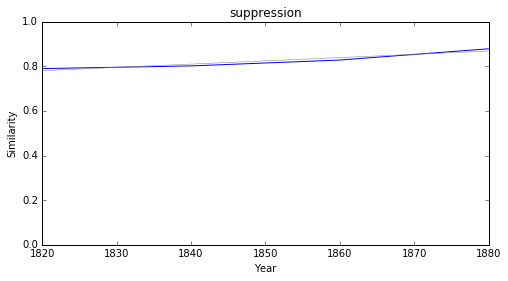

enseignement


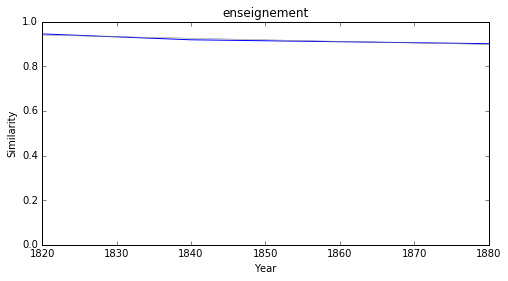

législation


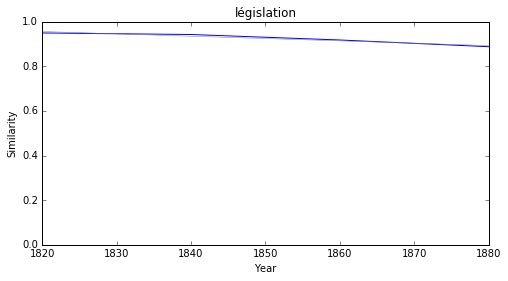

historique


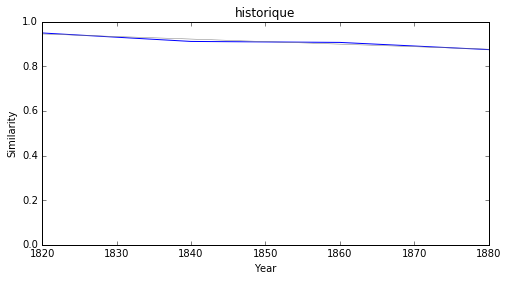

démocratie


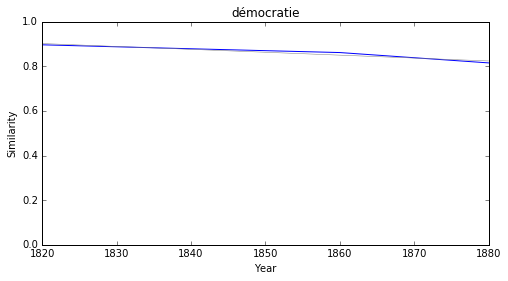

application


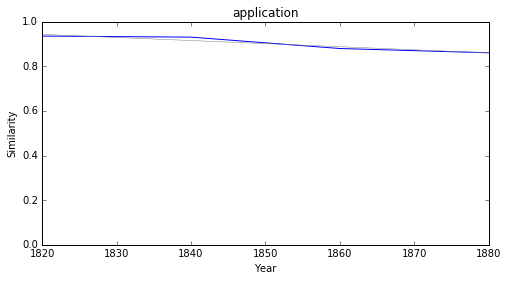

phénomène


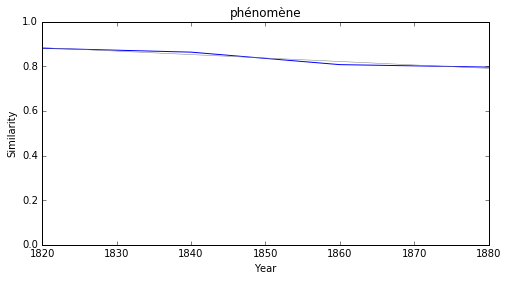

européen


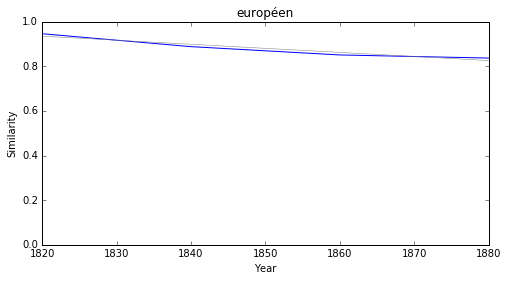

conservateur


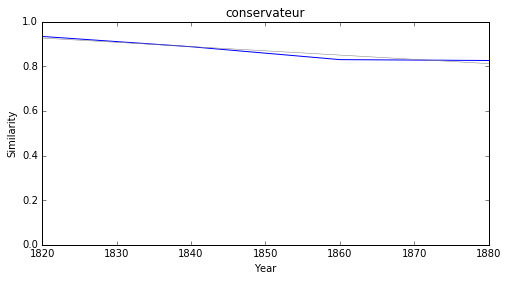

### <i><b>lettre</i></b>

       token     slope         p
24    périer -0.015107  0.034086
46   onzième -0.014378  0.017034
9   crawford -0.012375  0.048918
4    fenêtre -0.010752  0.042971
1       face -0.010650  0.016710
26     paris -0.010593  0.041688
36      rose -0.009345  0.045890
19     revue -0.008752  0.042586
27    phrase -0.007553  0.039357
5   officier -0.007056  0.045342



lussac


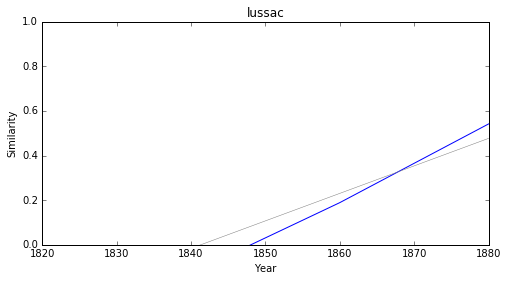

lingerie


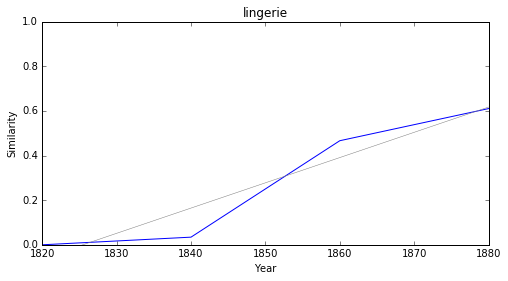

colmar


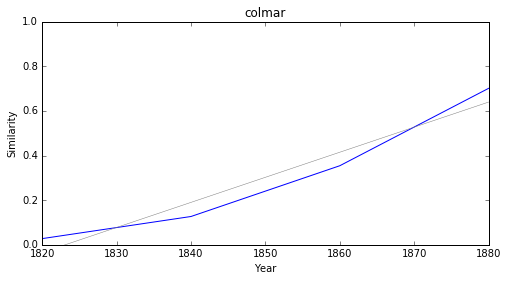

dérisoire


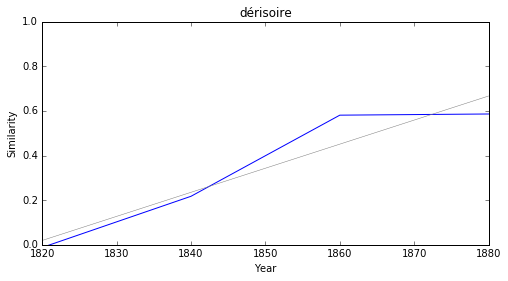

gracieuseté


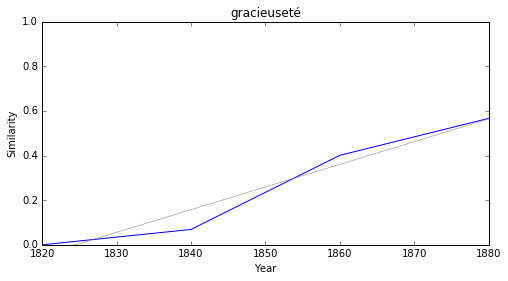

rhume


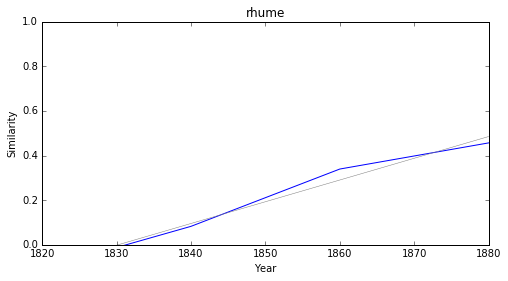

indignité


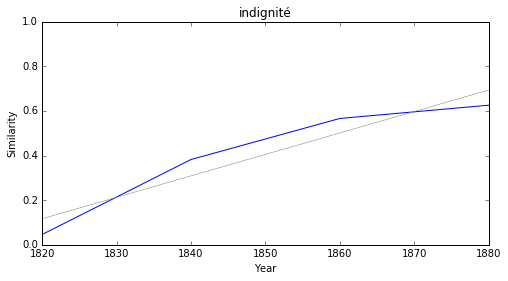

buloz


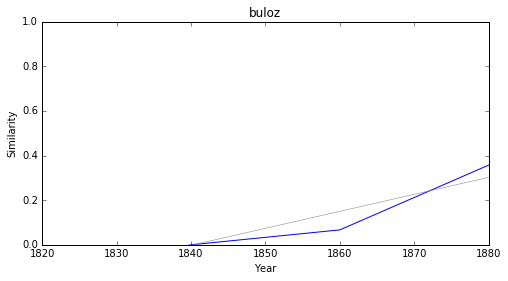

gonzague


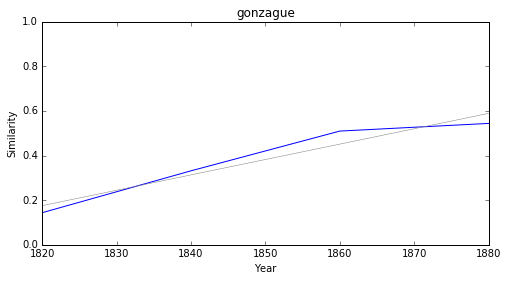

conférence


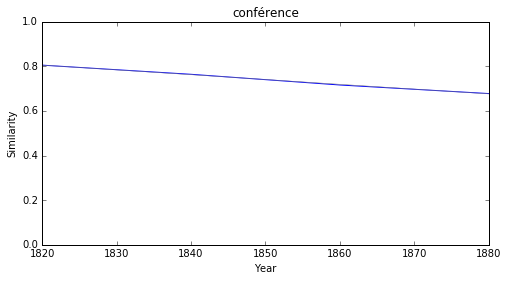

### <i><b>critique</i></b>

        token     slope         p
61  cannibale -0.015532  0.017423
55     radeau -0.010077  0.004053
6     irlande -0.006329  0.015323
40       goût -0.006063  0.027297
56     fellah -0.005508  0.025880
21   inimitié -0.005385  0.007743
45   imminent -0.005368  0.037011
54  assimiler -0.005347  0.002240
43    exemple -0.005143  0.022409
39  irlandais -0.005143  0.003445



ébruiter


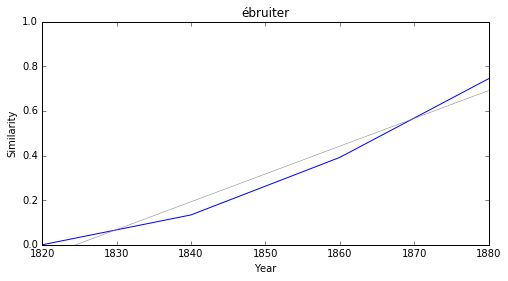

radicalement


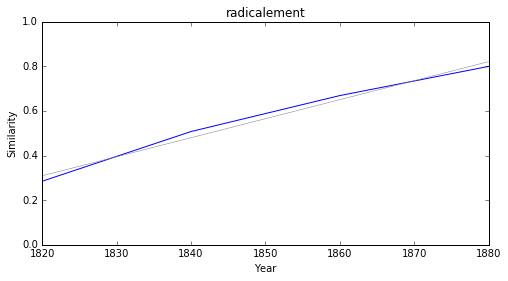

adepte


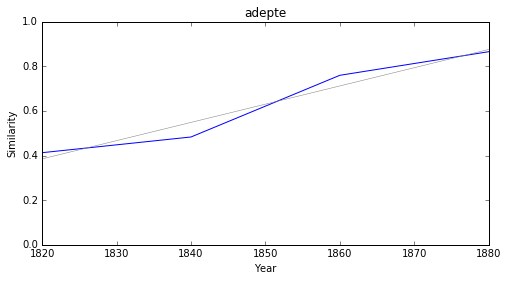

améliorer


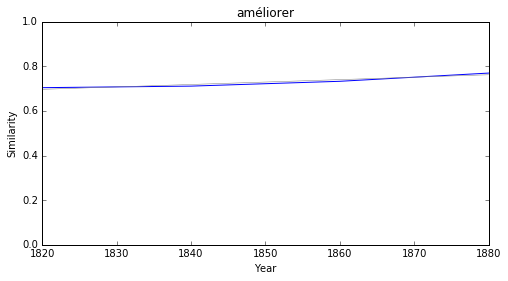

enseignement


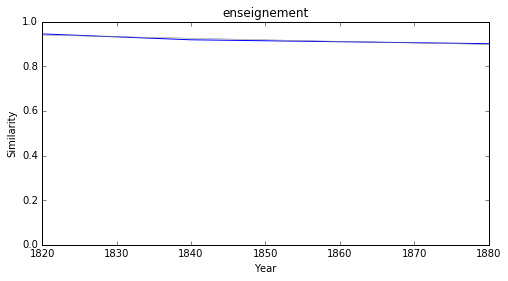

législation


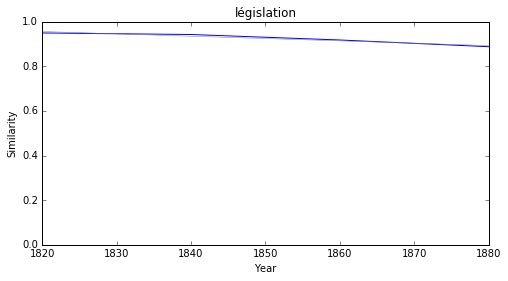

historique


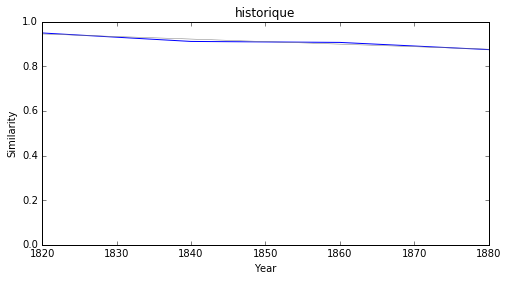

démocratie


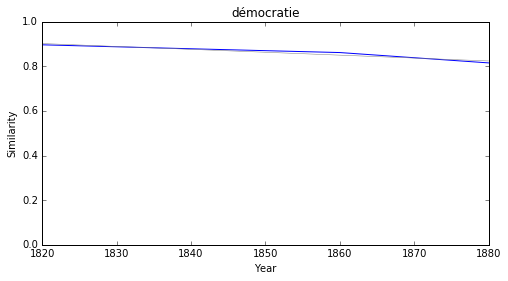

application


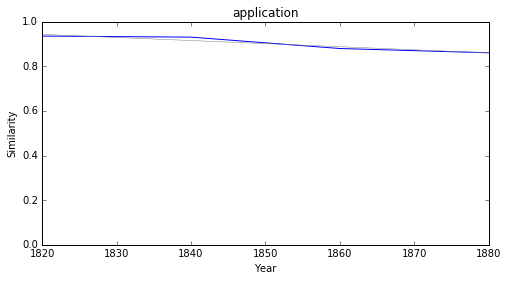

phénomène


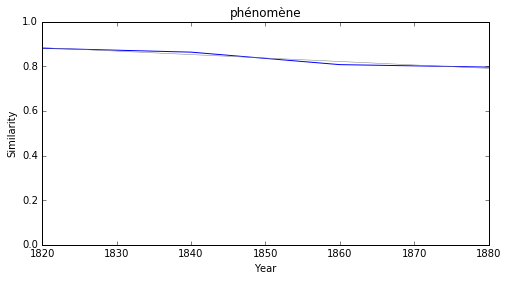

### <i><b>roman</i></b>

          token     slope         p
35  sympathiser -0.016862  0.020035
45    diviniser -0.015999  0.039088
21      presque -0.010433  0.007303
5         allah -0.007902  0.018512
32       phrase -0.007553  0.039357
44        trait -0.007424  0.035014
30       caveau -0.007357  0.013109
7    déposition -0.007134  0.006830
13         page -0.006793  0.017720
17      journal -0.006792  0.030479



mirage


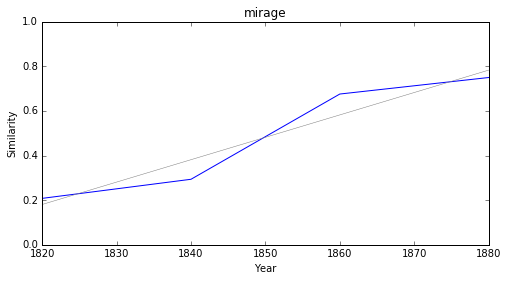

énumération


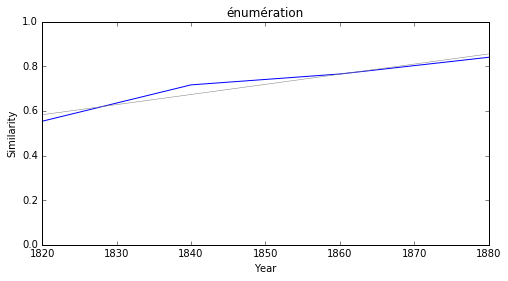

application


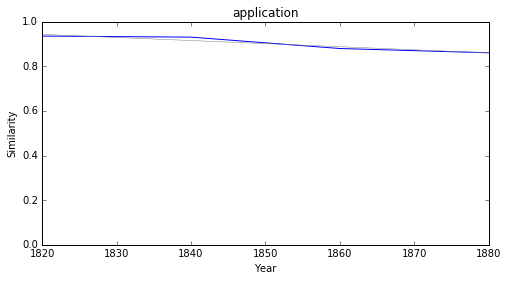

européen


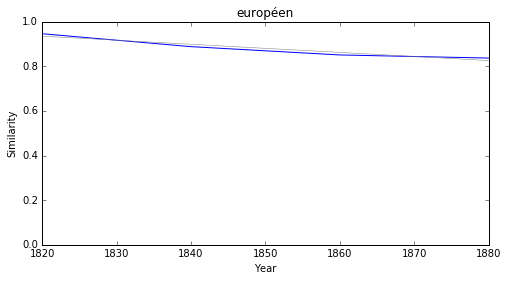

logique


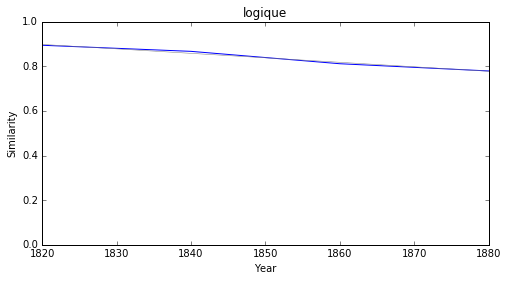

latin


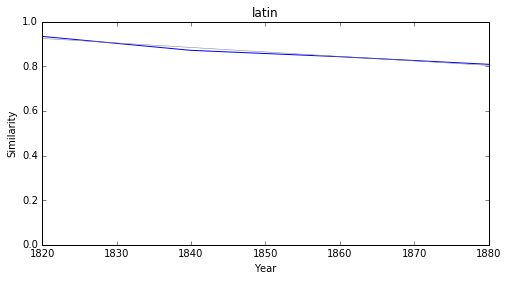

génération


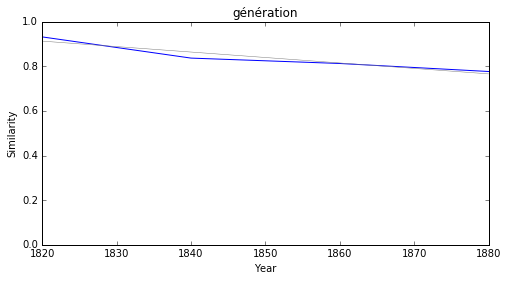

composition


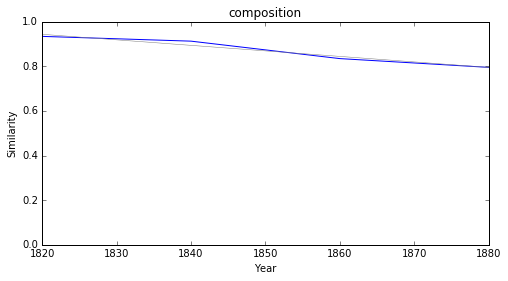

infirmité


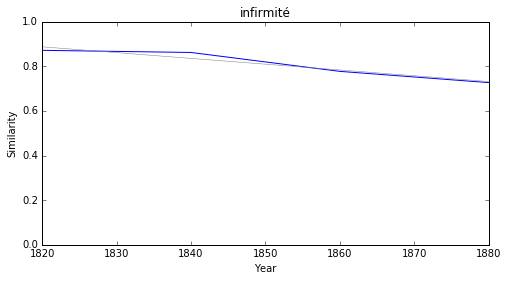

célébrité


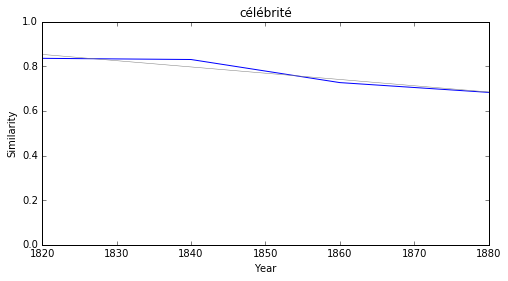

### <i><b>théâtre</i></b>

        token     slope         p
109  diamètre -0.017984  0.018194
73     callao -0.017481  0.046608
92       java -0.013419  0.044175
50       coin -0.009551  0.048602
22     voisin -0.009411  0.009181
88       rose -0.009345  0.045890
40        fin -0.009193  0.044703
49       midi -0.009097  0.036187
54   athénien -0.008906  0.048249
27    pirogue -0.008679  0.000764



tricorne


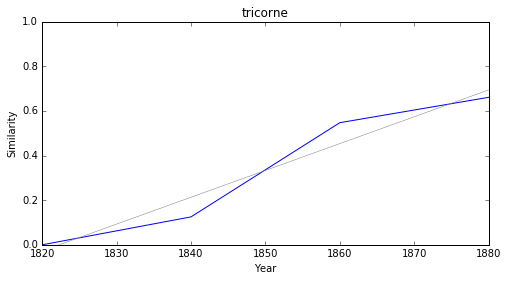

mein


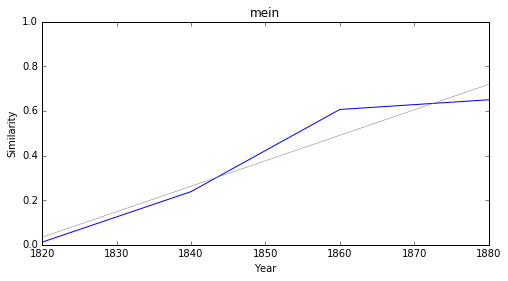

képi


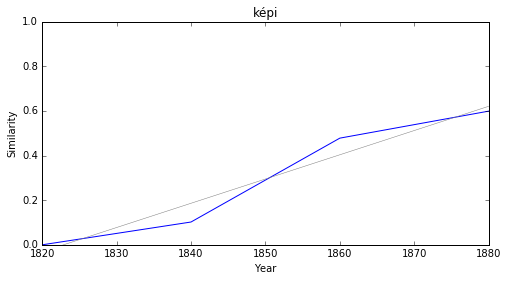

thibet


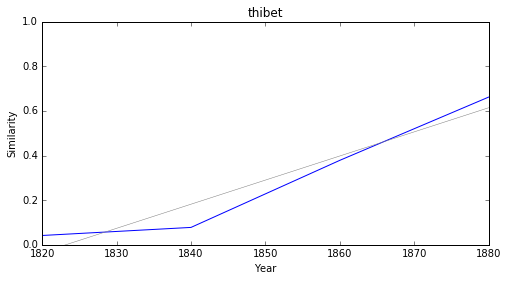

ontario


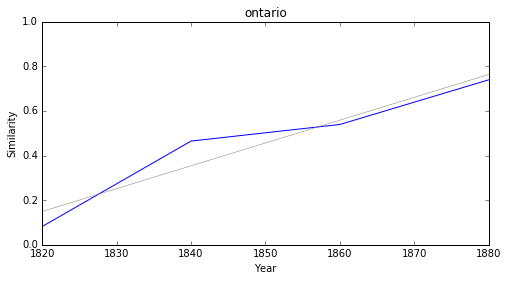

mirage


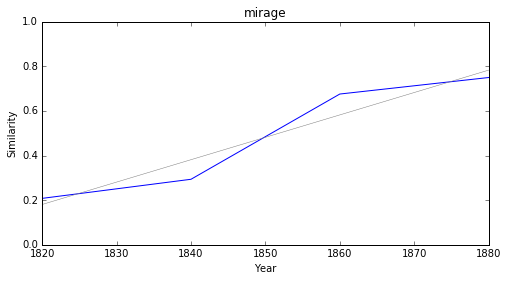

rabais


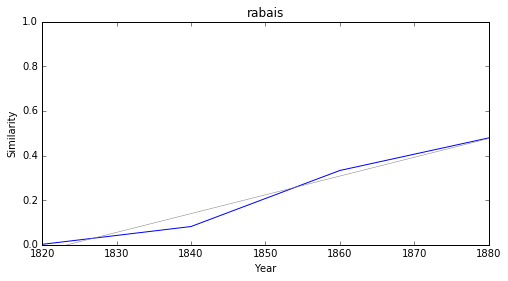

démocratie


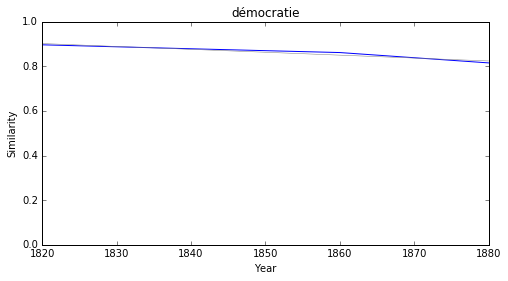

roussillon


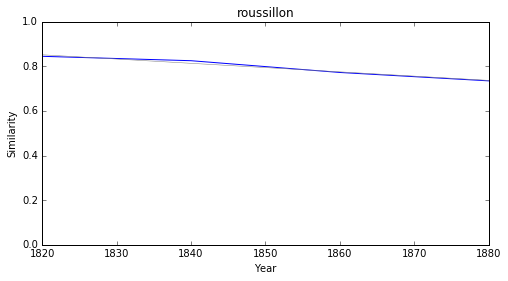

mode


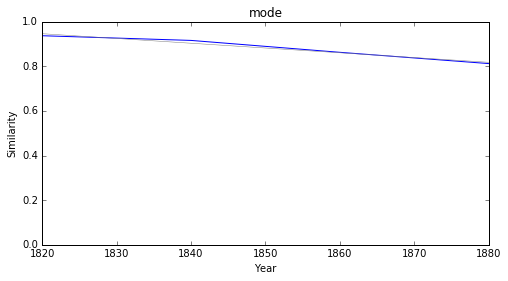

### <i><b>drame</i></b>

         token     slope         p
77   géographe -0.015757  0.027133
111   dialecte -0.013514  0.037056
116      étage -0.009194  0.014811
43    éminence -0.009020  0.047884
49     détroit -0.008516  0.001436
97       ligne -0.007592  0.029598
76    dispersé -0.007445  0.004885
47       seine -0.007441  0.017926
38      vésuve -0.007429  0.006704
107      trait -0.007424  0.035014



accession


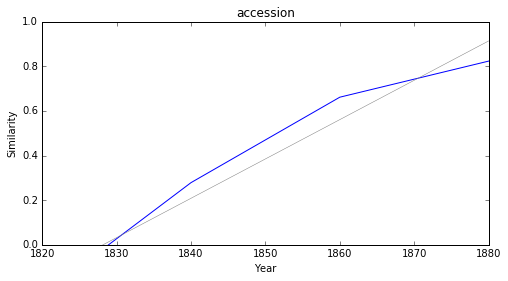

mayence


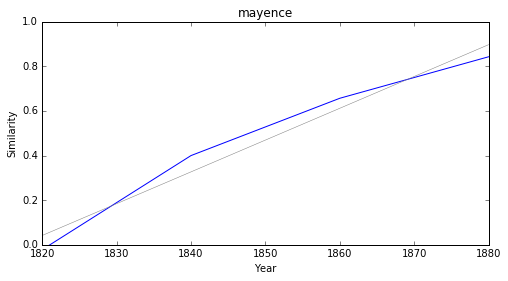

hobereau


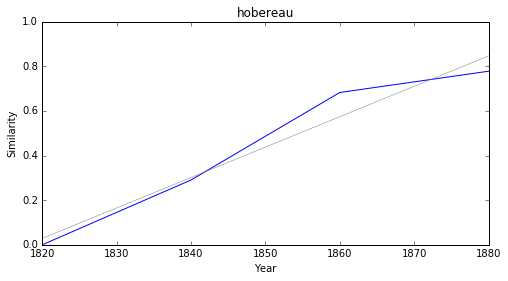

envolée


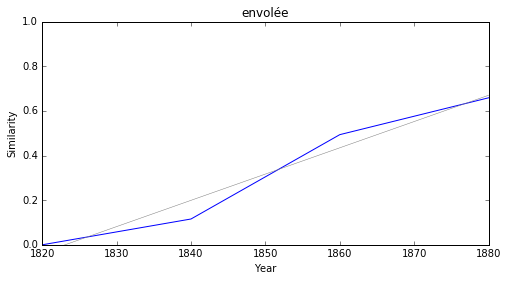

percher


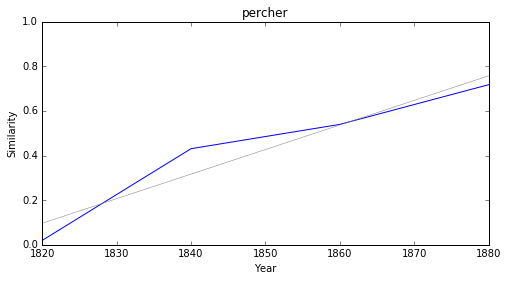

stipulé


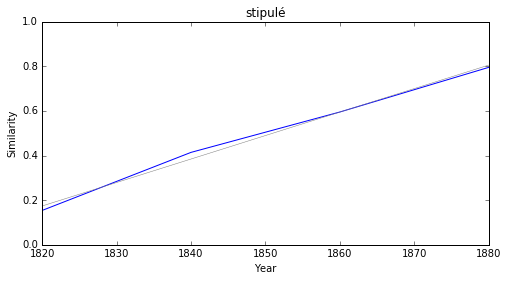

yacht


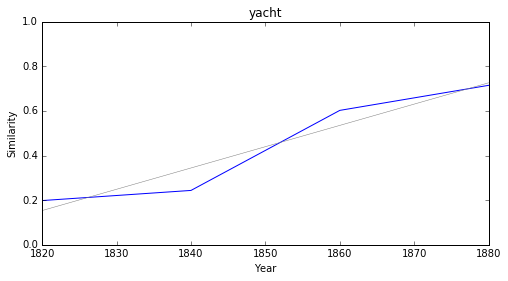

énumération


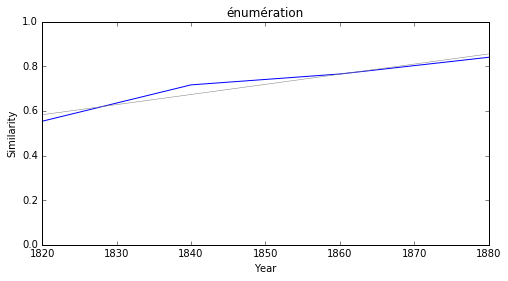

structure


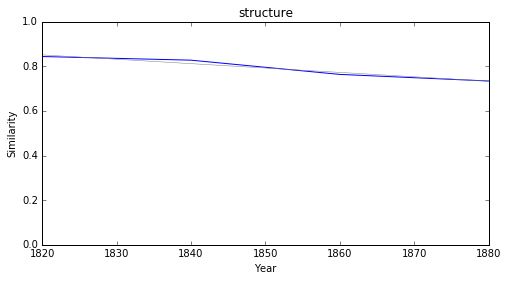

latin


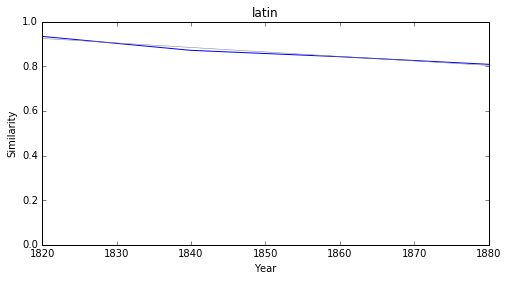

### <i><b>esprit</i></b>

           token     slope         p
8        chaucer -0.015698  0.013846
31          haut -0.011157  0.046807
21       presque -0.010433  0.007303
2   précédemment -0.009126  0.005608
60         corps -0.008030  0.032914
48     mouvement -0.007496  0.018156
67         trait -0.007424  0.035014
69       habiter -0.006989  0.041307
63       nouveau -0.006779  0.015825
30         parti -0.006646  0.022232



adepte


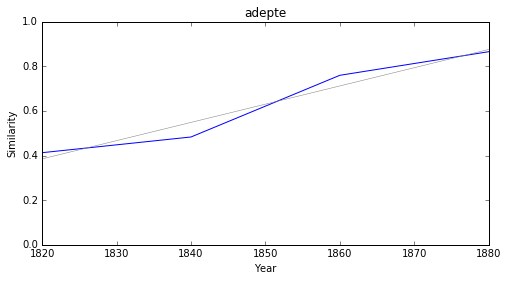

enseignement


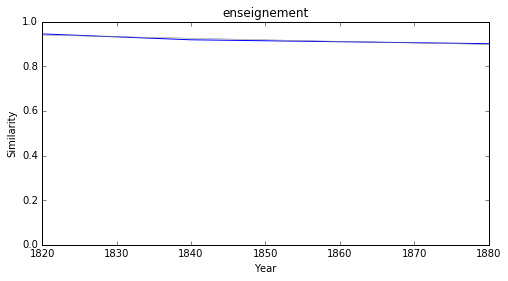

historique


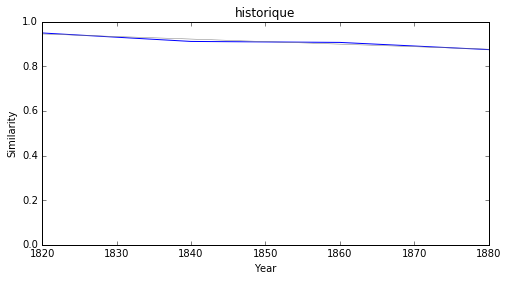

application


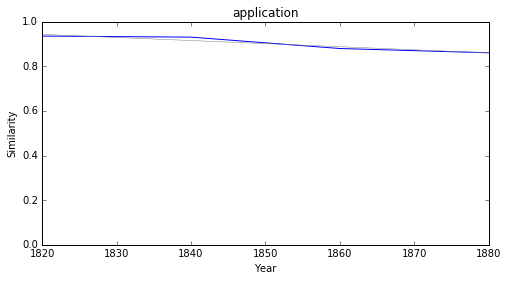

logique


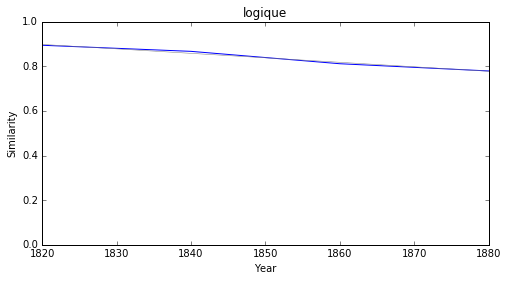

méthode


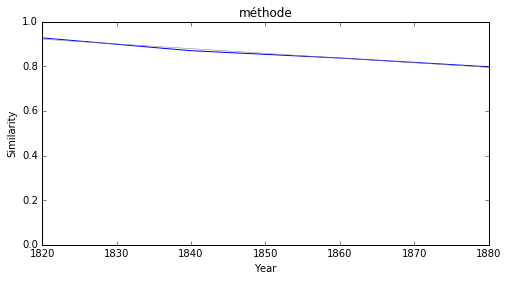

religion


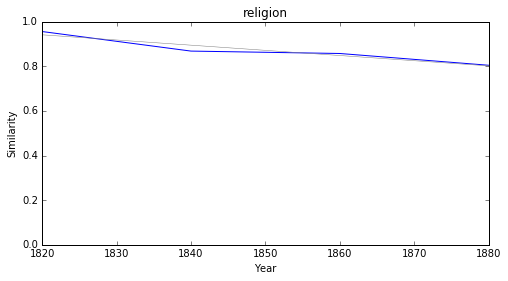

origine


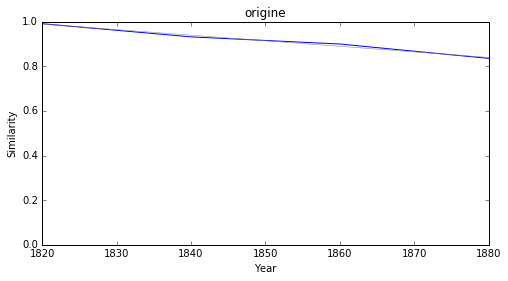

indépendance


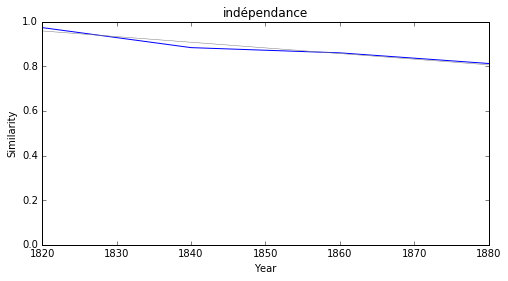

règle


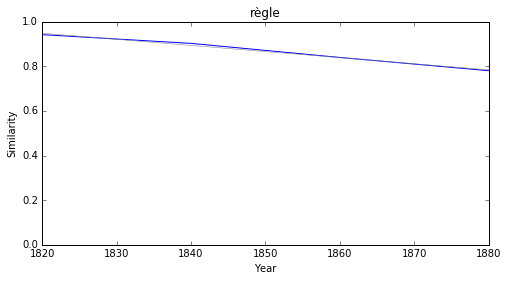

### <i><b>langue</i></b>

        token     slope         p
80   dialecte -0.013514  0.037056
30    presque -0.010433  0.007303
22    pirogue -0.008679  0.000764
47    passage -0.008434  0.041818
64     troupe -0.008314  0.017857
12    lumière -0.008088  0.002398
53  mouvement -0.007496  0.018156
55      suite -0.006537  0.006897
63      façon -0.006441  0.037881
10   présence -0.006312  0.000473



offusqué


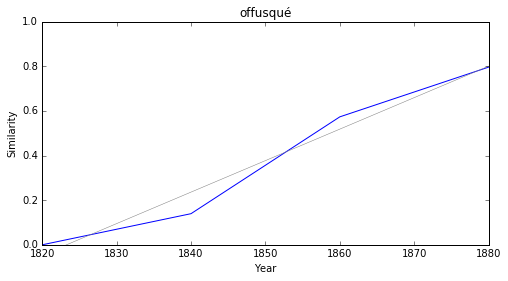

compétition


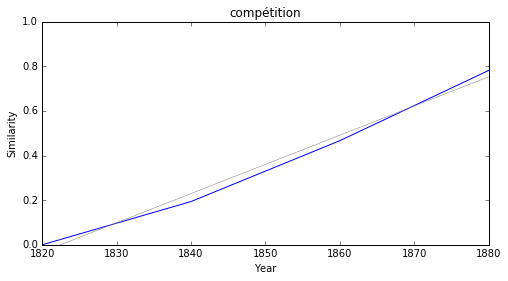

enseignement


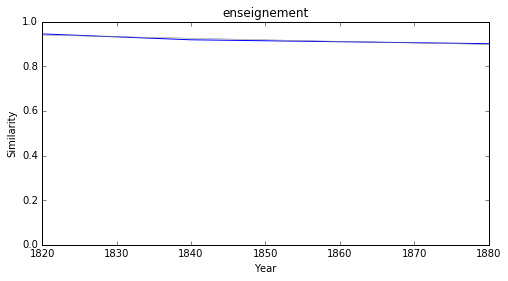

historique


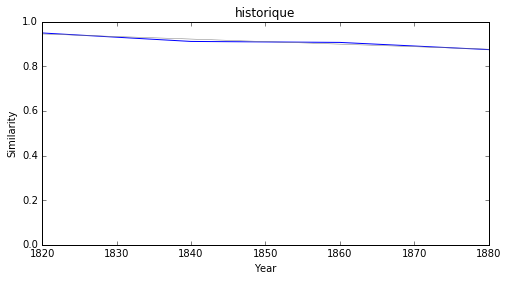

démocratie


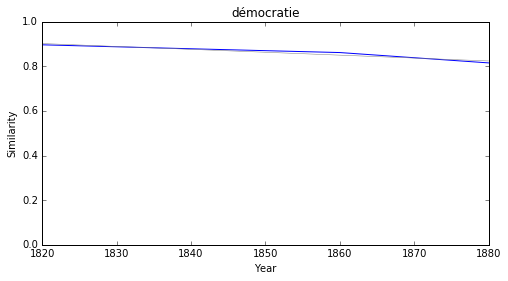

application


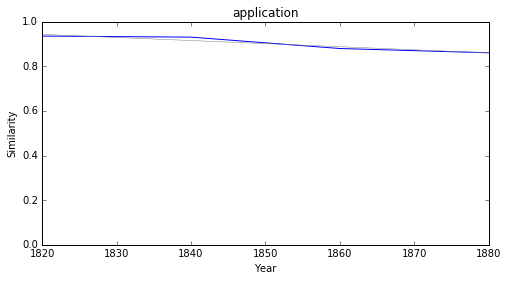

union


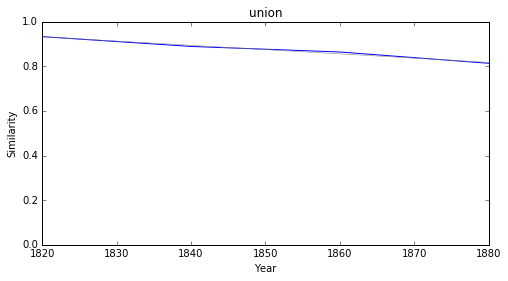

logique


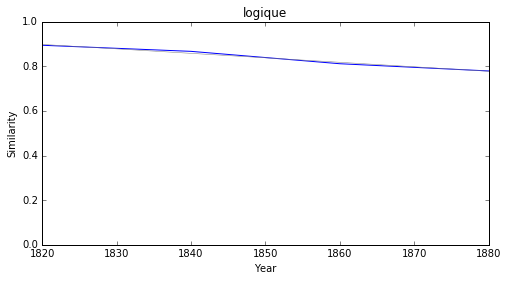

antipathie


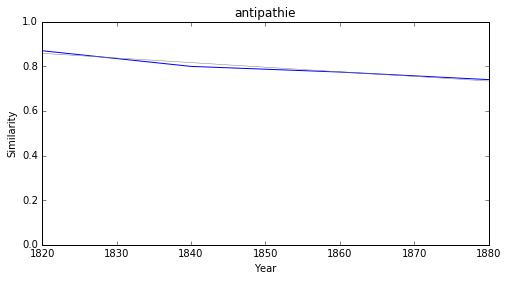

méthode


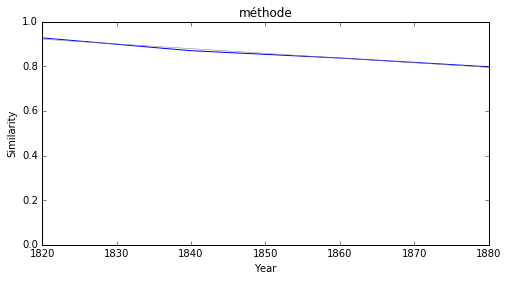

### <i><b>diplomatie</i></b>

          token     slope         p
39  brahmanique -0.017142  0.042187
53      sandale -0.015108  0.026813
63    crocodile -0.014900  0.001178
61         java -0.013419  0.044175
42       taille -0.010002  0.005999
73     magnolia -0.009359  0.010827
66        aloès -0.008624  0.041298
72        tigre -0.008169  0.020246
43       phrase -0.007553  0.039357
13         page -0.006793  0.017720



compétition


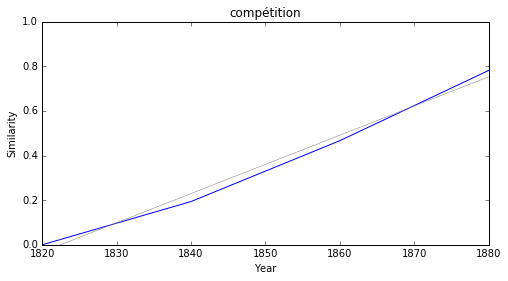

genèse


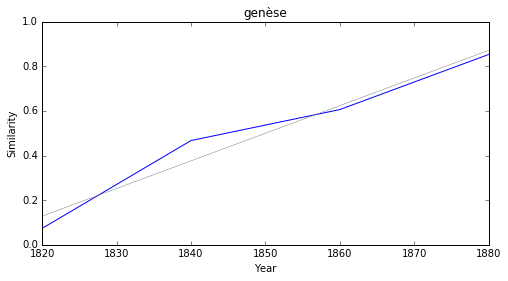

suppression


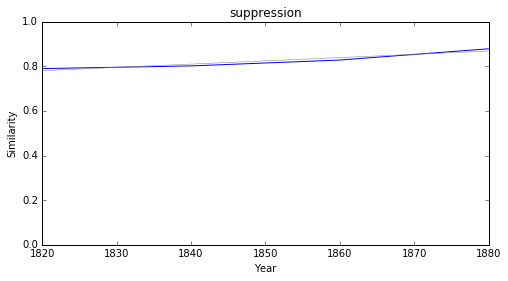

enseignement


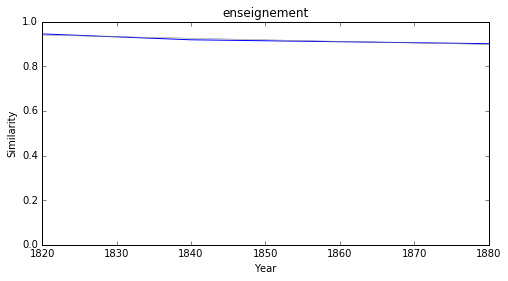

historique


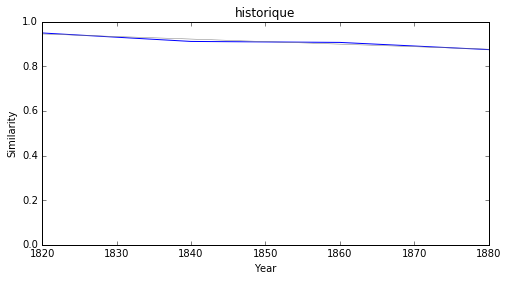

application


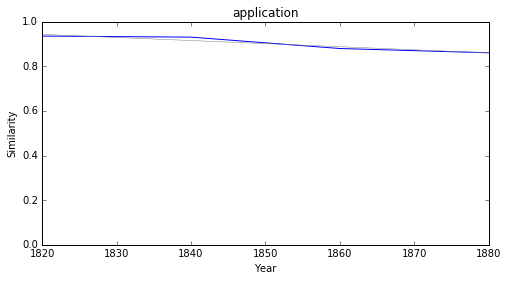

protecteur


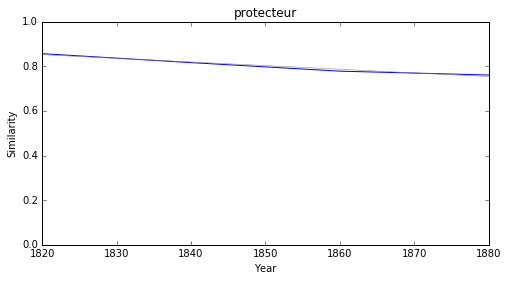

routine


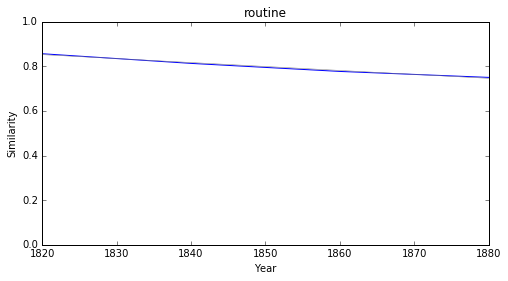

union


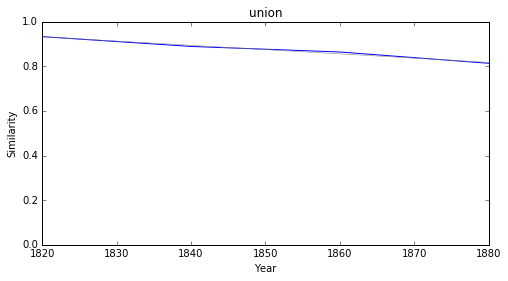

logique


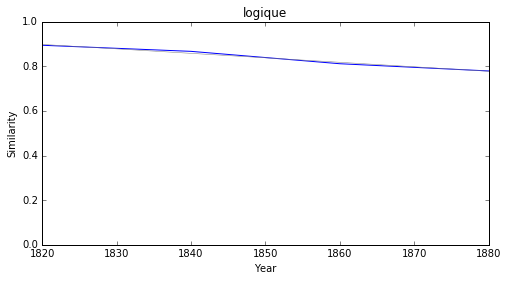

### <i><b>politique</i></b>

             token     slope         p
60   collaboration -0.008274  0.001437
81           armée -0.007865  0.003266
75       mouvement -0.007496  0.018156
110          trait -0.007424  0.035014
107       barbarie -0.007355  0.003667
91          sicile -0.007311  0.037781
36          former -0.007283  0.027157
62           ordre -0.007067  0.010272
101        nouveau -0.006779  0.015825
69          france -0.006609  0.015401



enseignement


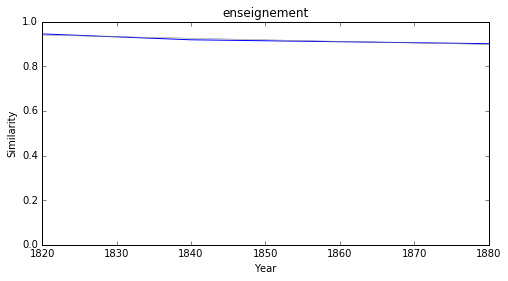

législation


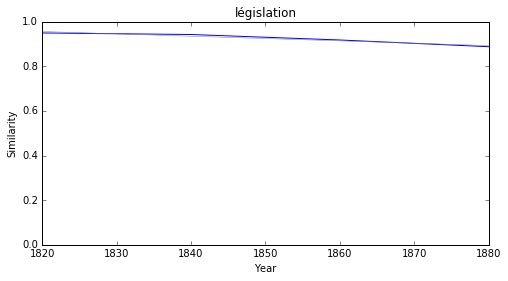

historique


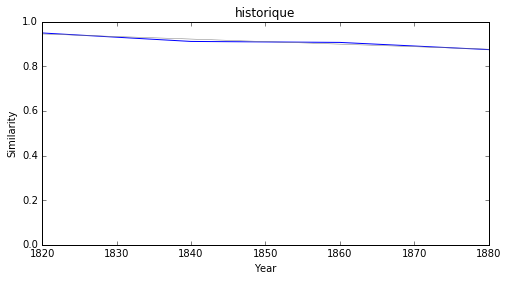

démocratie


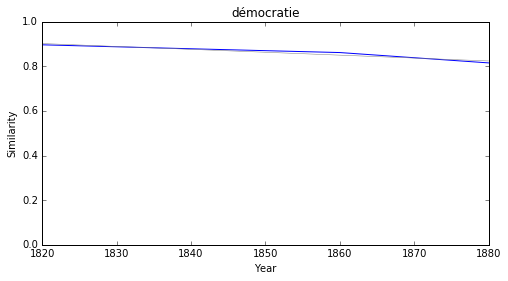

application


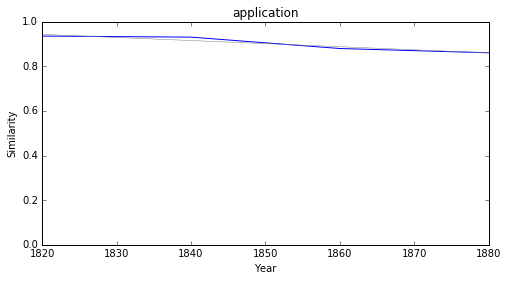

phénomène


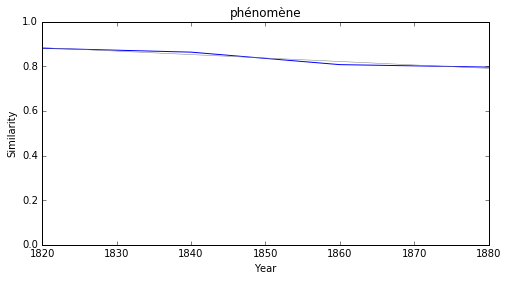

européen


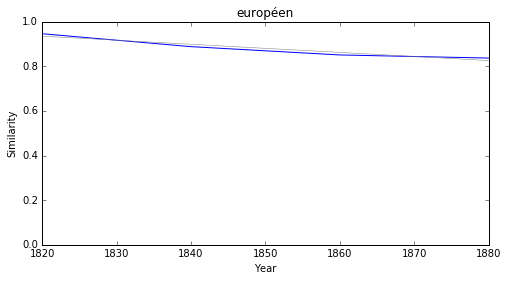

conservateur


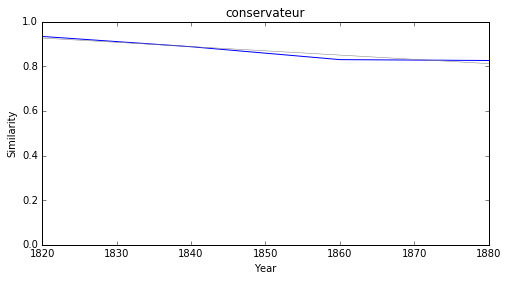

union


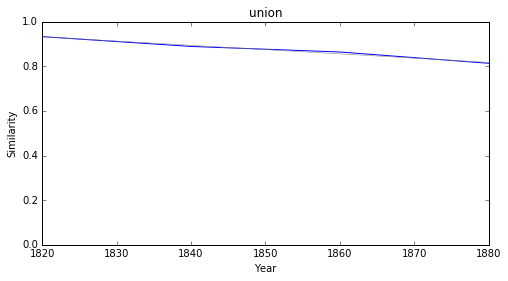

logique


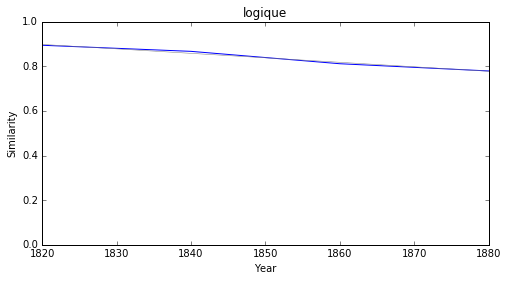

### <i><b>morale</i></b>

        token     slope         p
38  mahométan -0.015267  0.037757
42   éclairer -0.008611  0.023843
62      ligne -0.007592  0.029598
55     clarté -0.007072  0.019222
53    couleur -0.006944  0.014286
39    marquer -0.006186  0.036598
45    immense -0.005368  0.013061
63       idée -0.005182  0.016626
48     ancien -0.005099  0.001092
70  puissance -0.004711  0.016234



odieusement


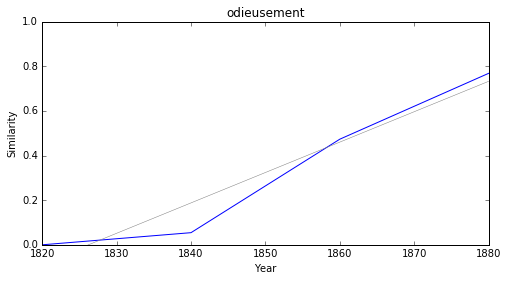

arbitrage


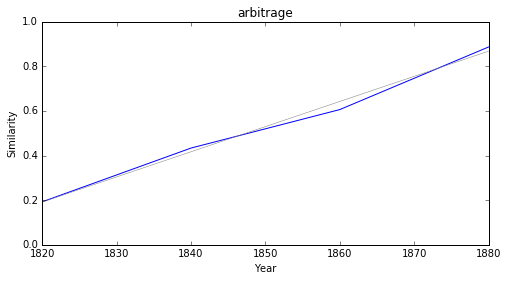

consécration


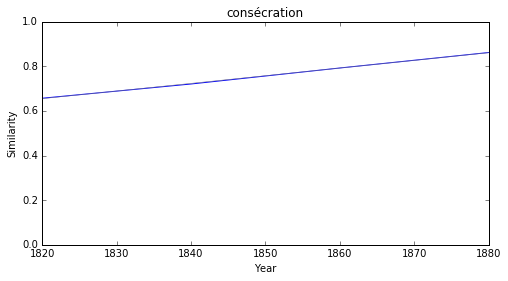

enseignement


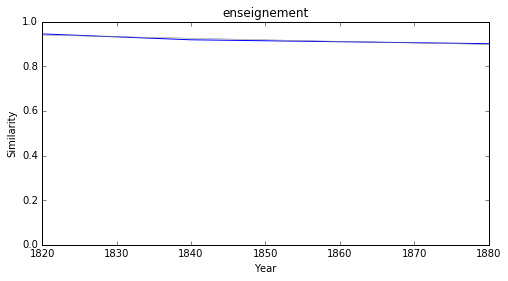

législation


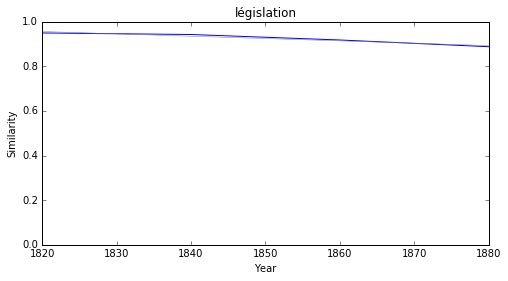

historique


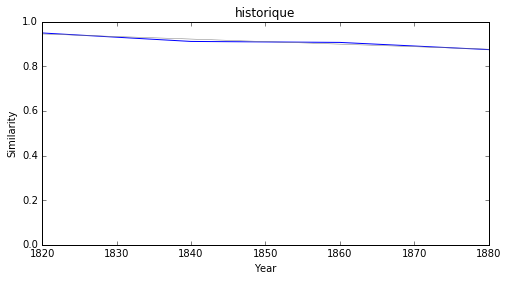

démocratie


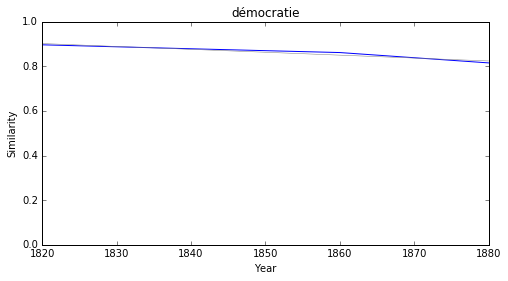

application


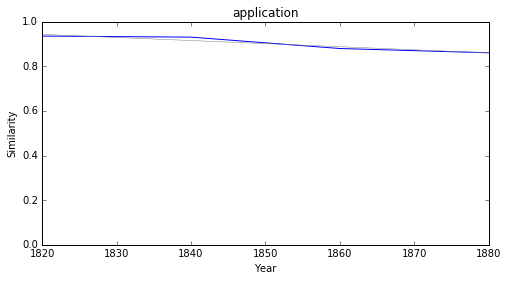

phénomène


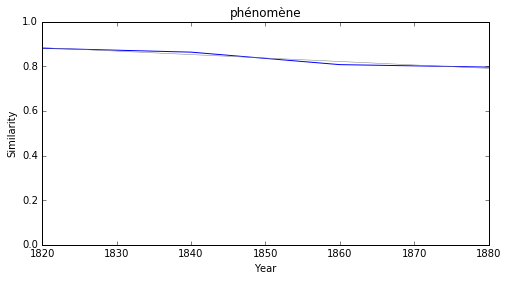

européen


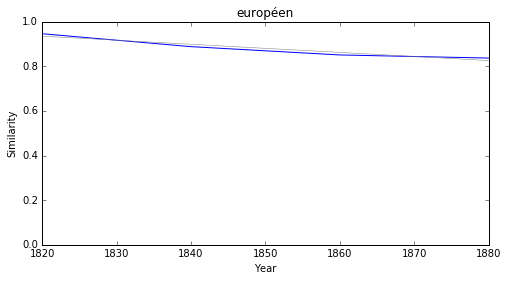

### <i><b>société</i></b>

        token     slope         p
119  dialecte -0.013514  0.037056
38    détroit -0.008516  0.001436
67    passage -0.008434  0.041818
120   séparer -0.008421  0.040121
100     corps -0.008030  0.032914
80      armée -0.007865  0.003266
109  remonter -0.007433  0.046219
110  barbarie -0.007355  0.003667
6      fleuve -0.007341  0.039305
90     sicile -0.007311  0.037781



enseignement


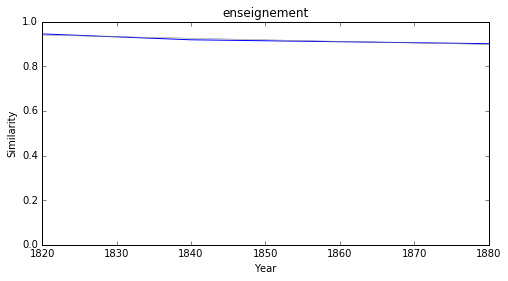

législation


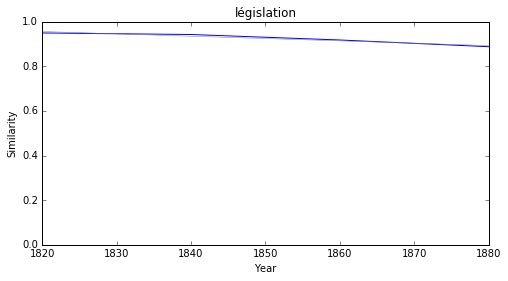

historique


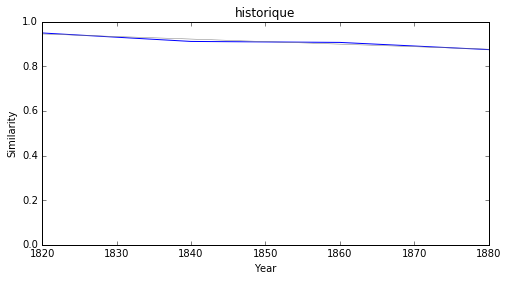

démocratie


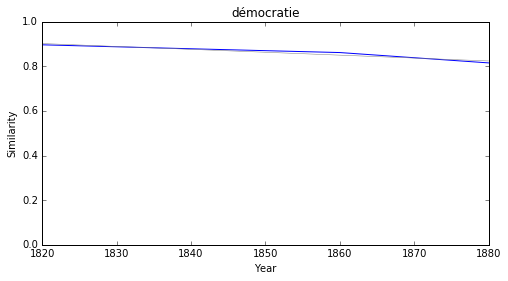

application


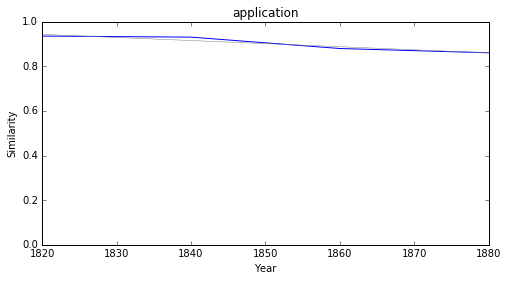

phénomène


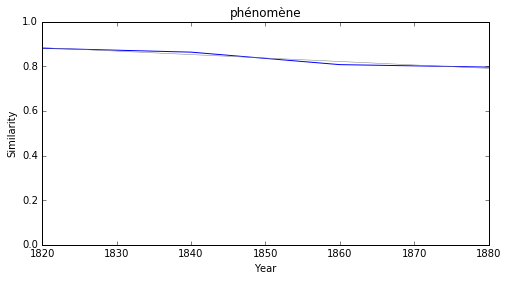

européen


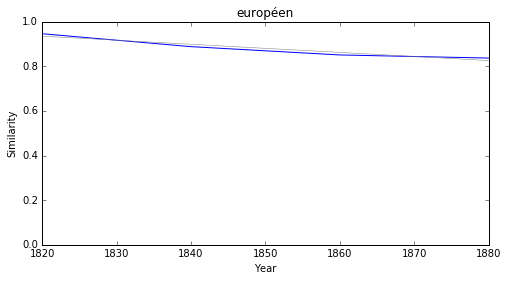

conservateur


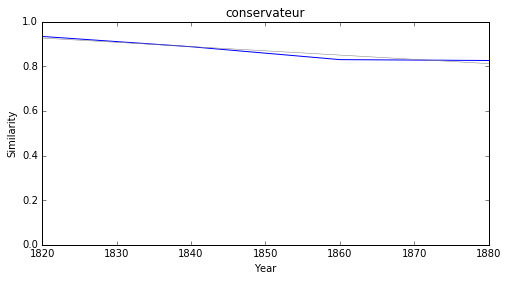

union


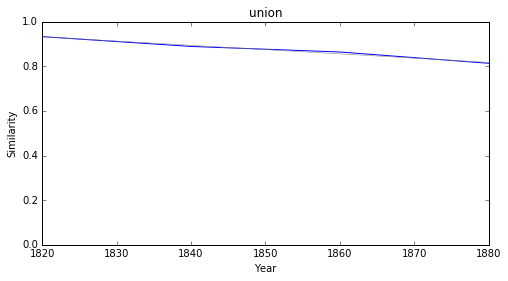

logique


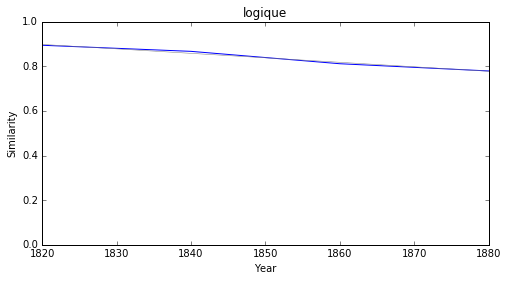

### <i><b>pouvoir</i></b>

           token     slope         p
34  commentateur -0.013635  0.017172
19    admissible -0.013191  0.042237
9        presque -0.010433  0.007303
33    concevable -0.010098  0.040521
42         alors -0.008738  0.015540
12     accoupler -0.008713  0.014090
11      ensemble -0.007602  0.025157
18         ordre -0.007067  0.010272
5          ainsi -0.007049  0.036815
31     induction -0.007027  0.025741



oie


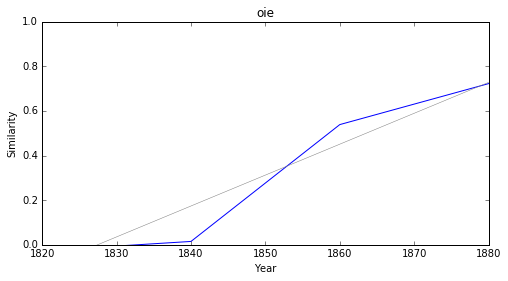

hobereau


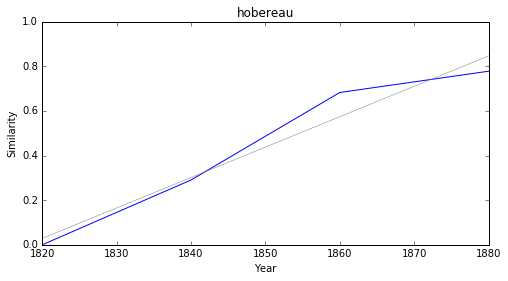

calculateur


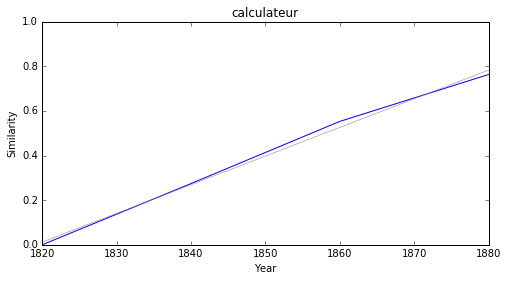

berner


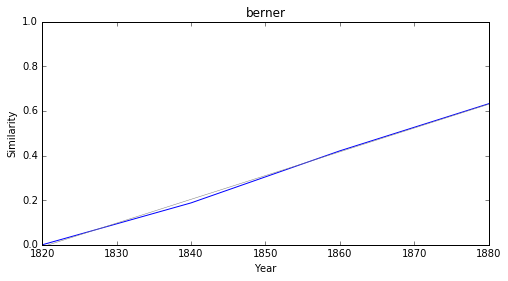

adepte


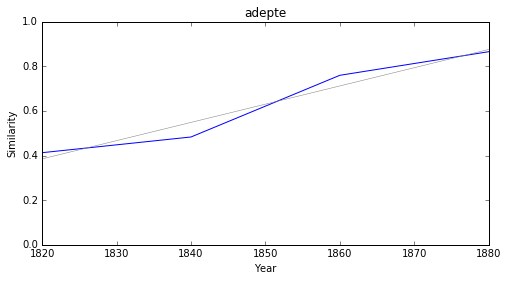

confident


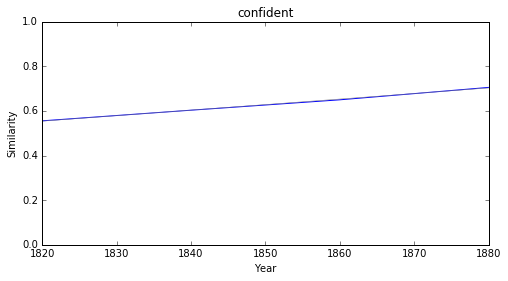

améliorer


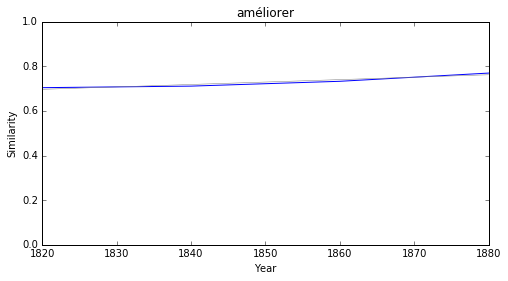

détrôner


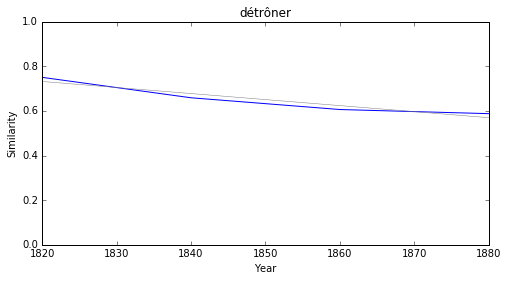

règle


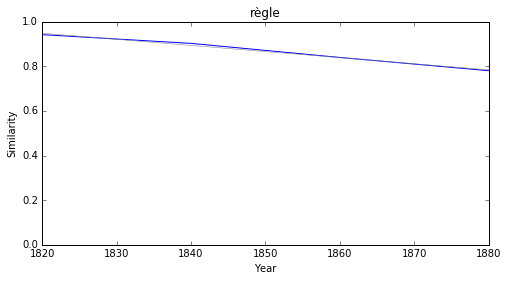

usage


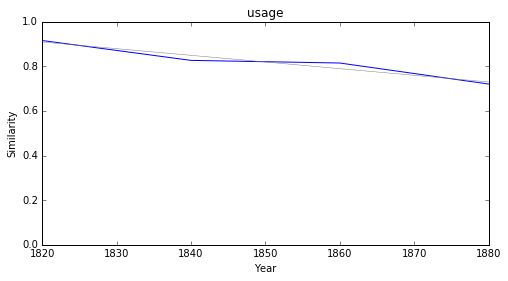

### <i><b>théologie</i></b>

         token     slope         p
39  dominiquin -0.016628  0.024721
45   astrolabe -0.013122  0.033426
1         face -0.010650  0.016710
23     attirer -0.008384  0.025145
53        lèse -0.007462  0.015003
58    barbarie -0.007355  0.003667
3   connivence -0.006734  0.012218
24       poste -0.006575  0.014207
52    frédéric -0.006570  0.006285
43     bouffon -0.006547  0.034710



positiviste


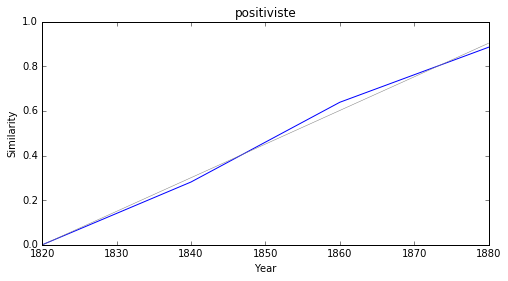

breslau


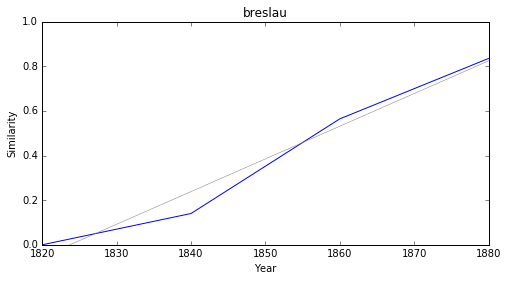

mayence


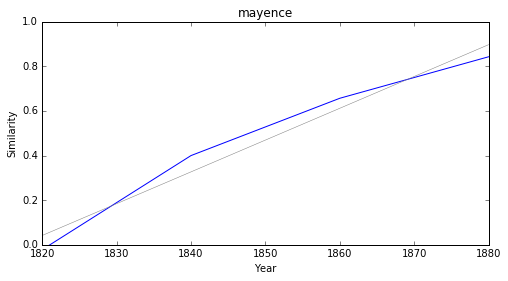

notoirement


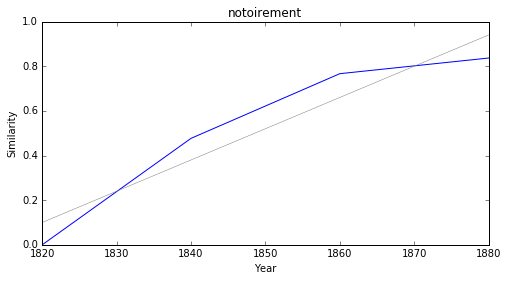

genèse


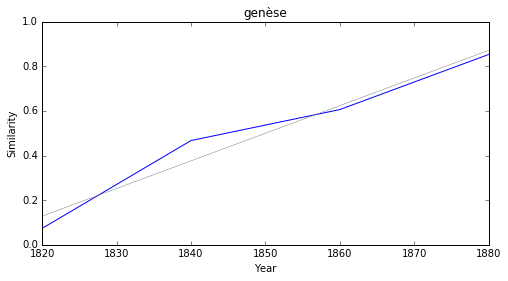

arbitrage


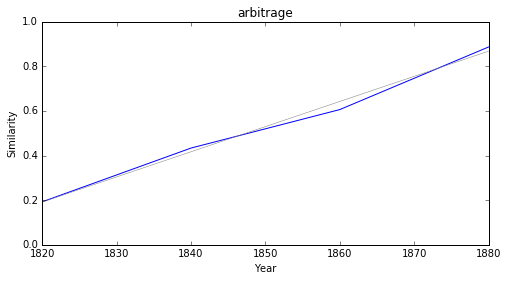

orthodoxe


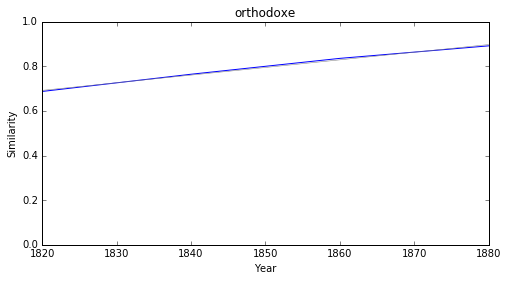

suppression


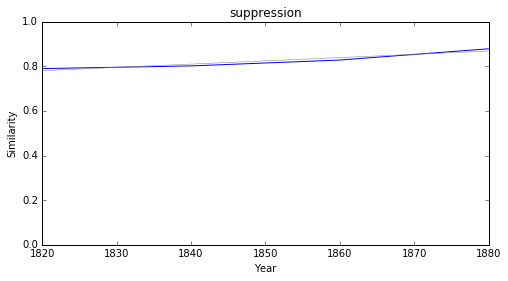

traditionnel


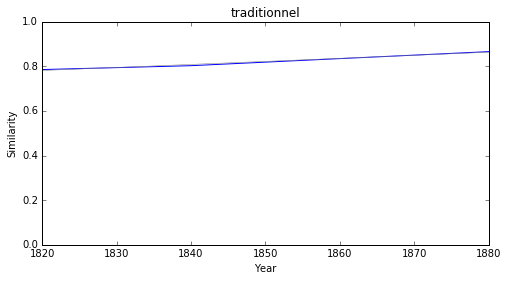

enseignement


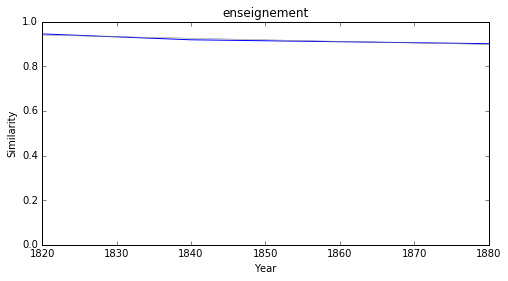

### <i><b>droit</i></b>

         token     slope         p
49     passage -0.008434  0.041818
59   mouvement -0.007496  0.018156
40  plantation -0.007215  0.008873
41       ordre -0.007067  0.010272
84      ennemi -0.007001  0.038493
39     obliger -0.006874  0.018266
75     nouveau -0.006779  0.015825
38       parti -0.006646  0.022232
48      france -0.006609  0.015401
61       suite -0.006537  0.006897



enseignement


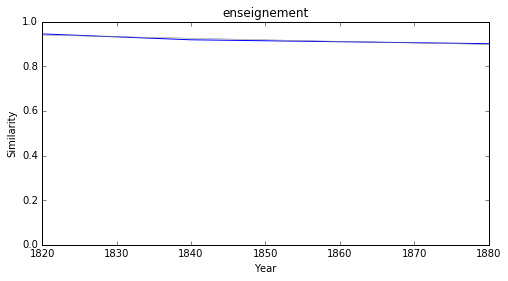

démocratie


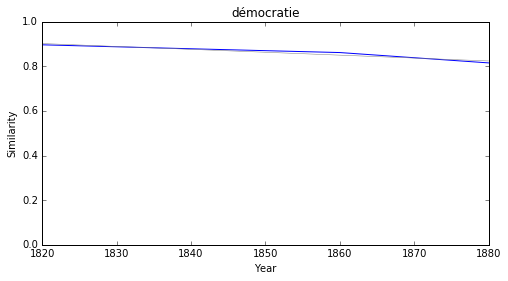

application


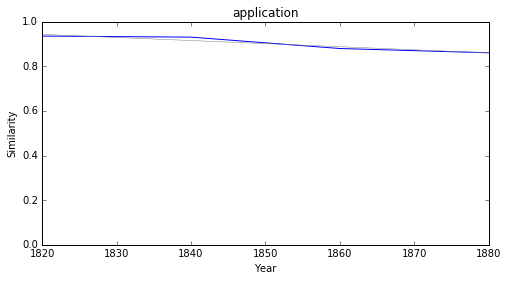

européen


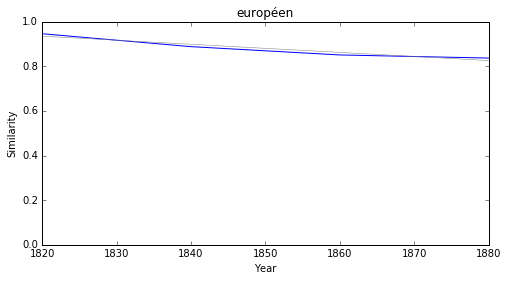

conservateur


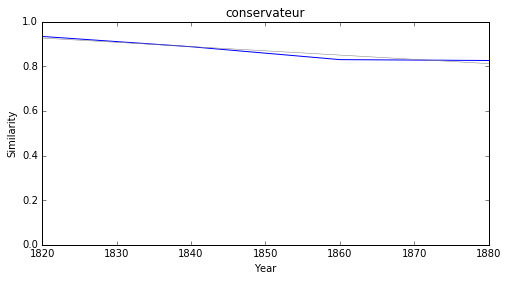

union


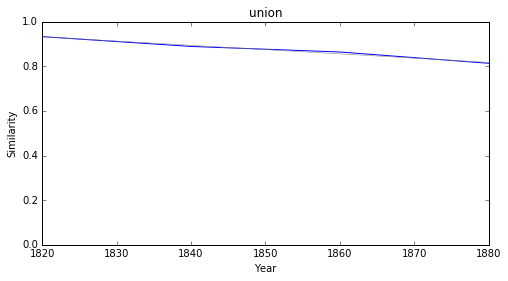

méthode


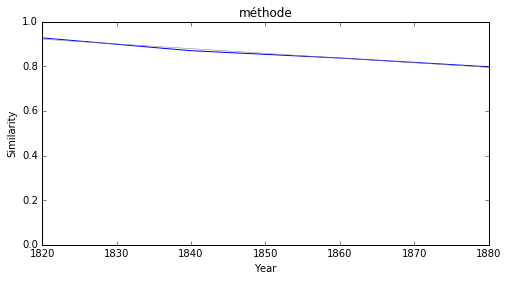

religion


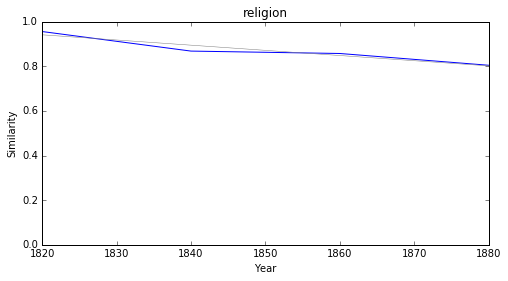

concours


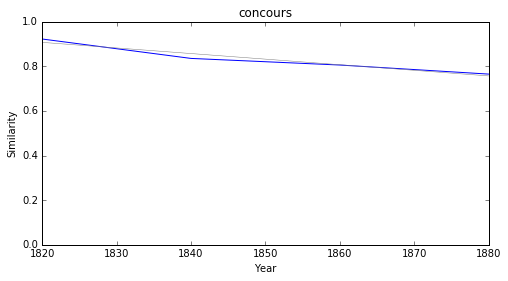

indépendance


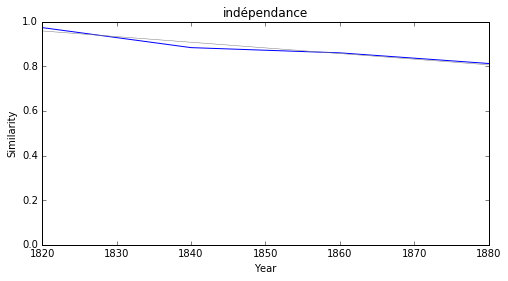

### <i><b>loi</i></b>

         token     slope         p
65   mahométan -0.015267  0.037757
119   dialecte -0.013514  0.037056
46     presque -0.010433  0.007303
43     détroit -0.008516  0.001436
18     lumière -0.008088  0.002398
106      corps -0.008030  0.032914
84       armée -0.007865  0.003266
78   mouvement -0.007496  0.018156
97      sicile -0.007311  0.037781
63       ordre -0.007067  0.010272



enseignement


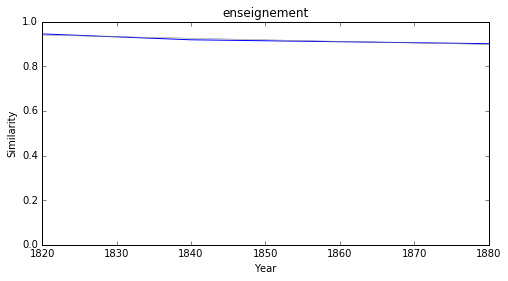

législation


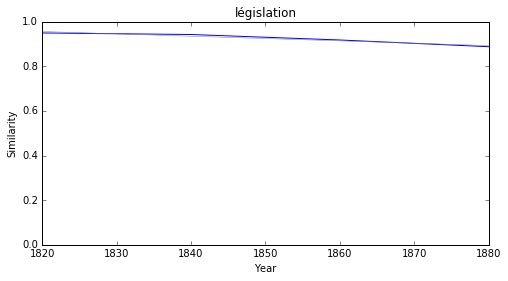

historique


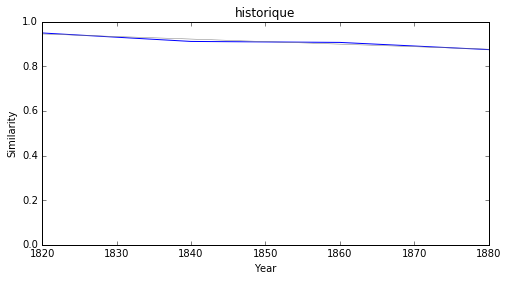

démocratie


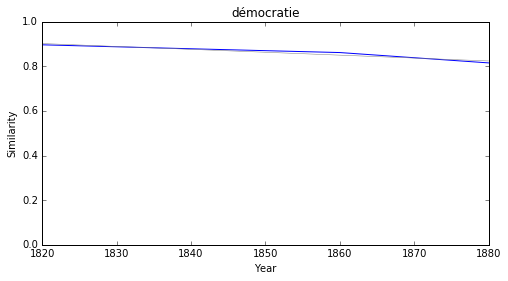

application


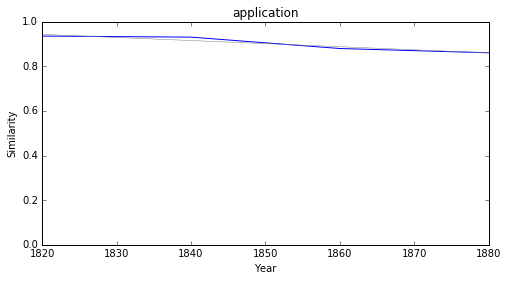

phénomène


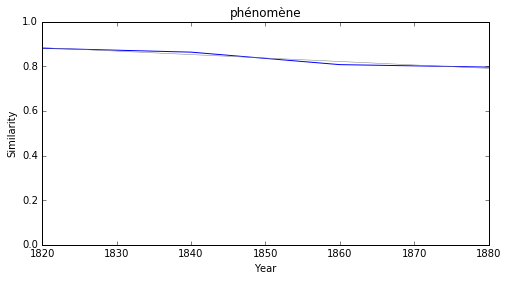

européen


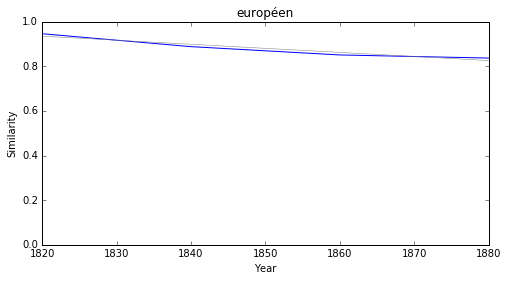

conservateur


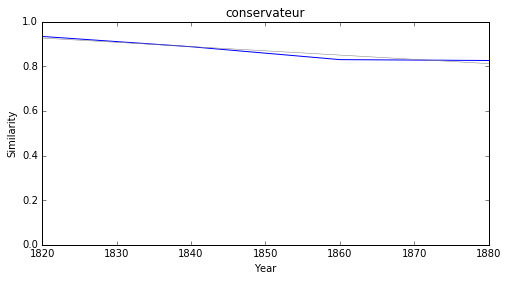

union


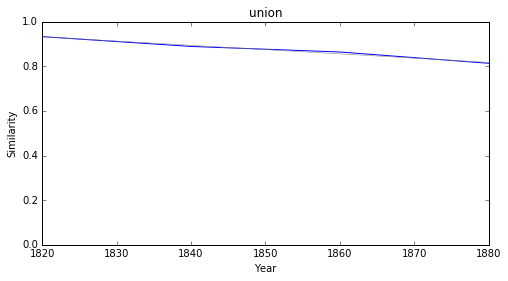

établissement


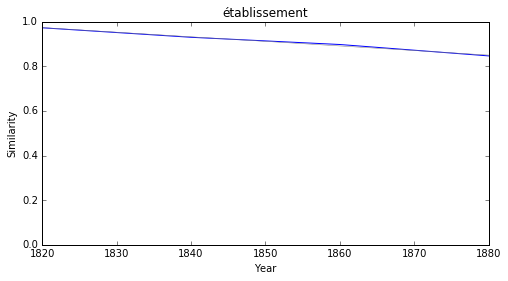

### <i><b>méthode</i></b>

           token     slope         p
15       bertram -0.016029  0.021381
33        london -0.015723  0.009491
52  commentateur -0.013635  0.017172
21       désoler -0.007834  0.002865
24       grouper -0.007432  0.013631
57        persan -0.006498  0.037718
51       bédouin -0.006456  0.016332
18     portugais -0.006442  0.010221
38         vasco -0.005603  0.031134
43        manche -0.005559  0.009343



quinine


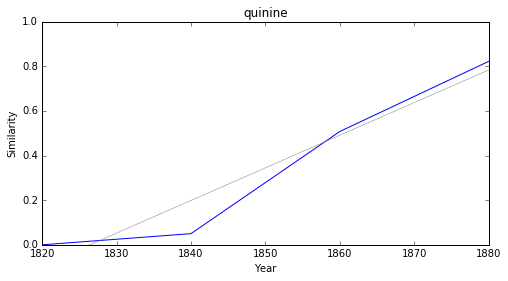

adepte


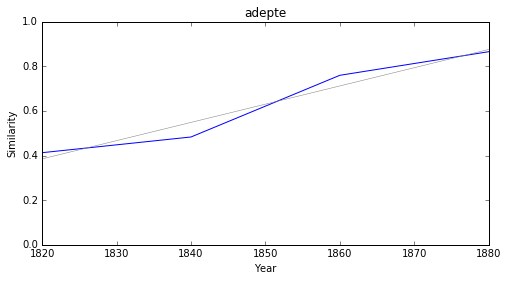

enseignement


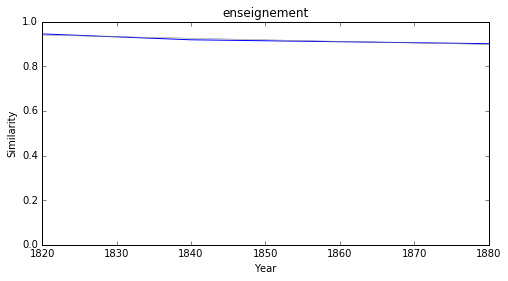

historique


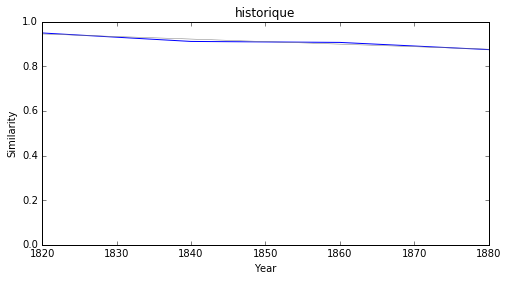

démocratie


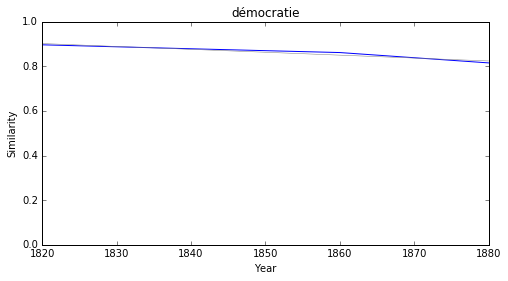

application


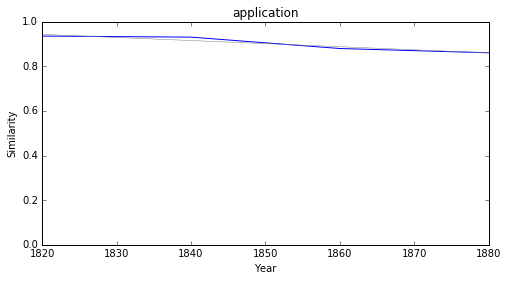

protecteur


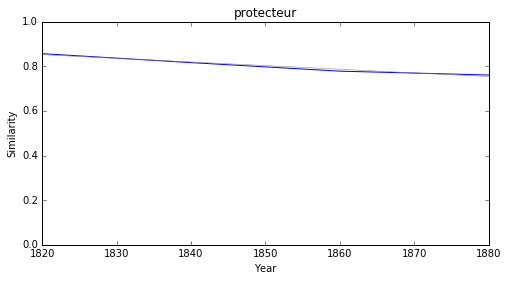

minorité


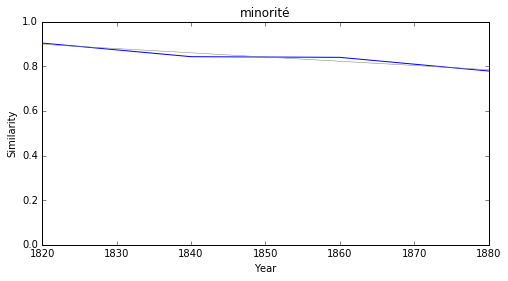

conservateur


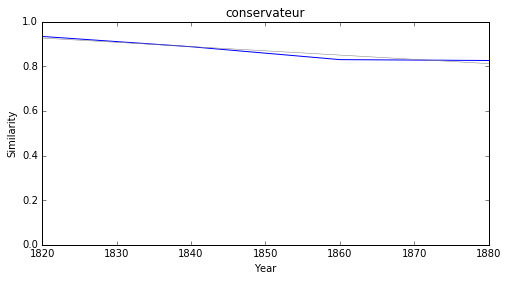

union


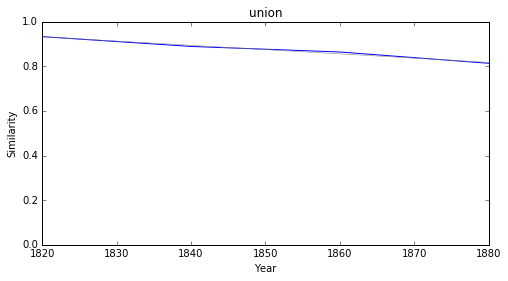

### <i><b>génie</i></b>

         token     slope         p
17     chaucer -0.015698  0.013846
35     détroit -0.008516  0.001436
56     passage -0.008434  0.041818
15     lumière -0.008088  0.002398
82       corps -0.008030  0.032914
61   mouvement -0.007496  0.018156
87       trait -0.007424  0.035014
6   déposition -0.007134  0.006830
94     habiter -0.006989  0.041307
63       masse -0.006567  0.025922



enseignement


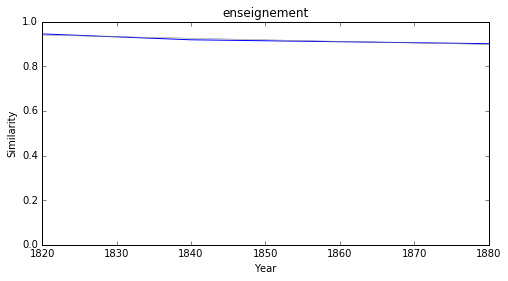

historique


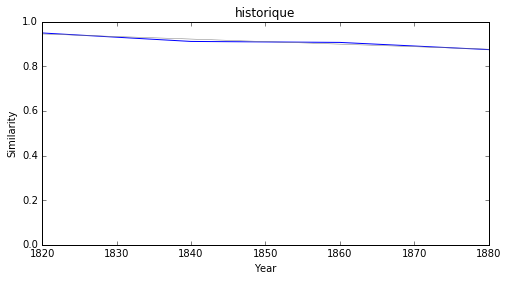

démocratie


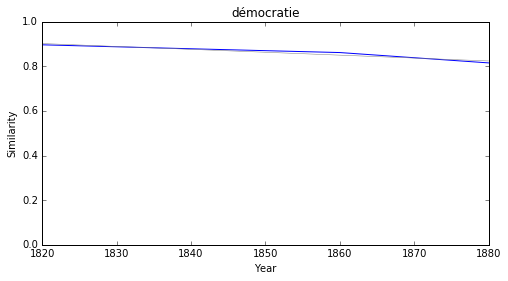

application


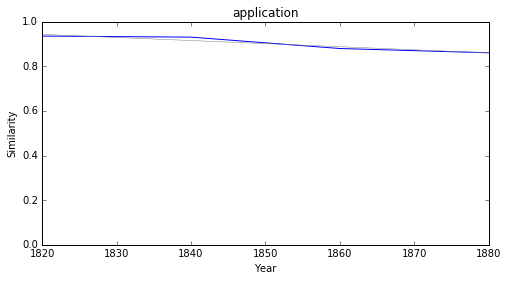

phénomène


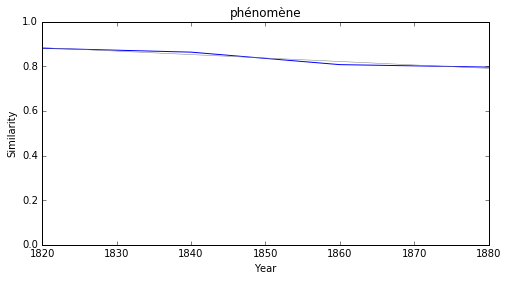

protecteur


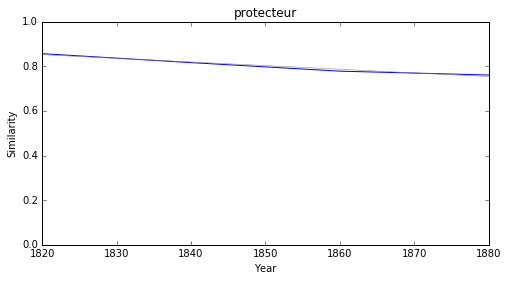

conservateur


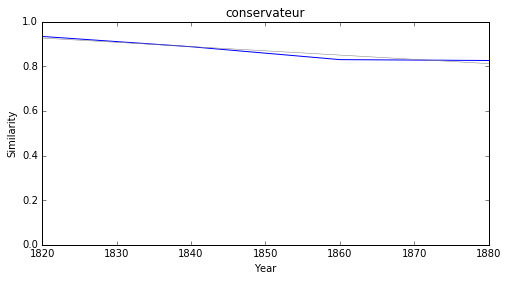

union


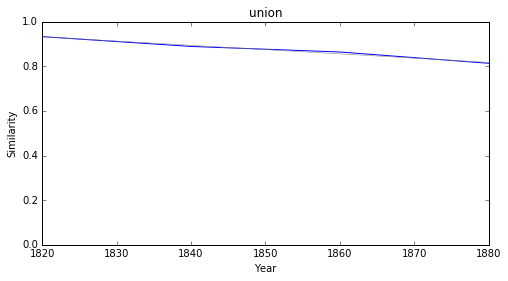

logique


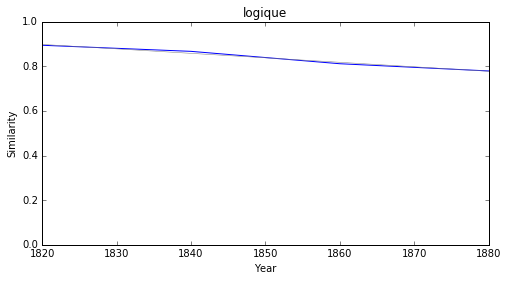

établissement


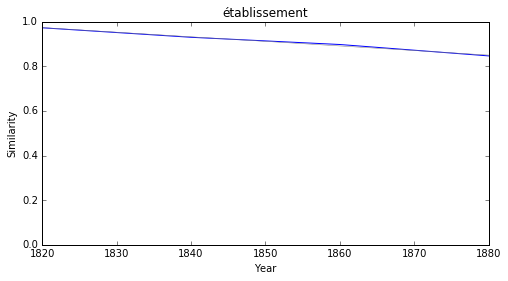

### <i><b>romantisme</i></b>

       token     slope         p
39    callao -0.017481  0.046608
3   arabique -0.013446  0.012099
26   aînesse -0.011994  0.008539
25      midi -0.009097  0.036187
22   détroit -0.008516  0.001436
17     horde -0.008018  0.028376
43  sépulcre -0.007805  0.008518
38    sommet -0.007619  0.040466
19     seine -0.007441  0.017926
14    vésuve -0.007429  0.006704



accession


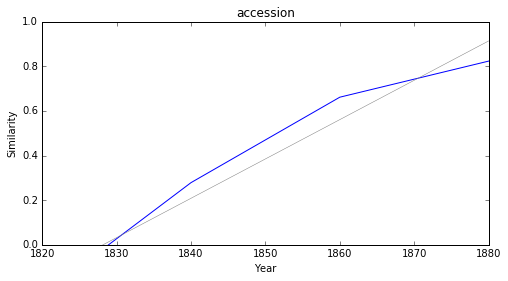

physiologie


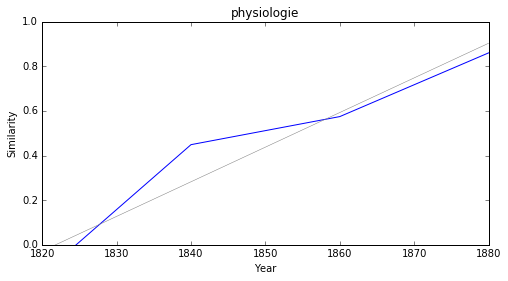

peccadille


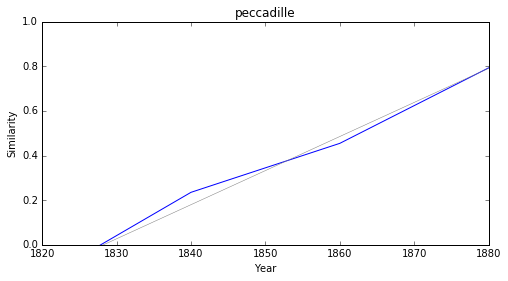

positiviste


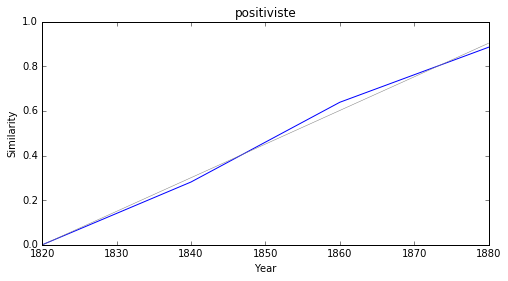

li


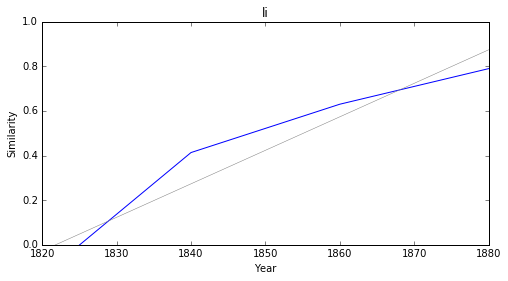

tcheou


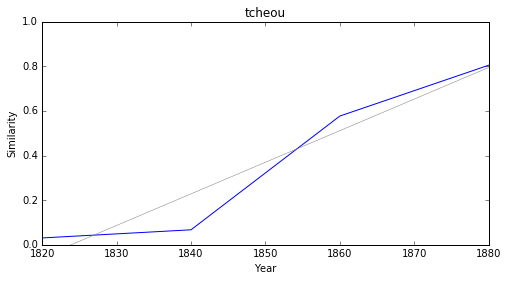

notoirement


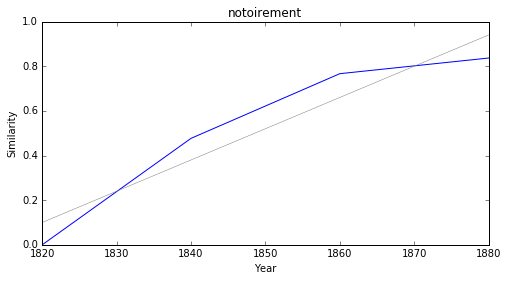

pion


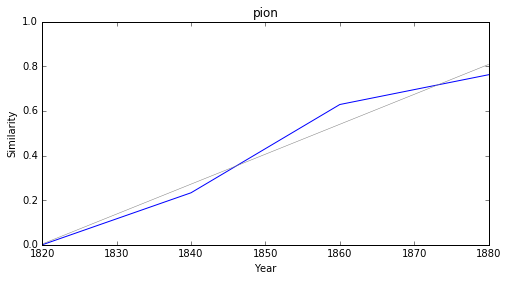

vexer


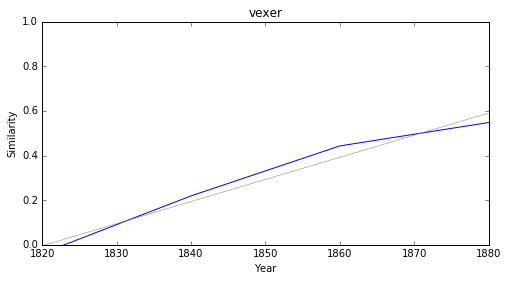

ouï


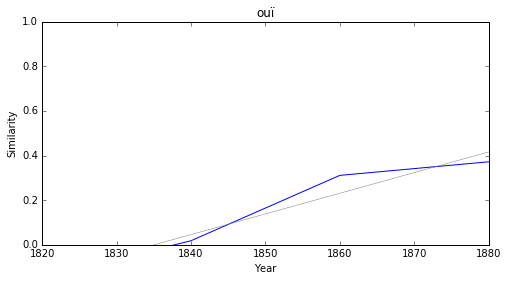

### <i><b>réalisme</i></b>

            token     slope         p
30      prophétie -0.005488  0.003746
7        inimitié -0.005385  0.007743
22         portée -0.005220  0.015506
15  contemplation -0.004646  0.040057
5       convoquer -0.004091  0.029016
13         curial -0.004064  0.017519
19   redoublement -0.002758  0.024654
0        baptiser  0.002712  0.004129
20           jarl  0.002715  0.043335
2       orthodoxe  0.003419  0.002439



périphrase


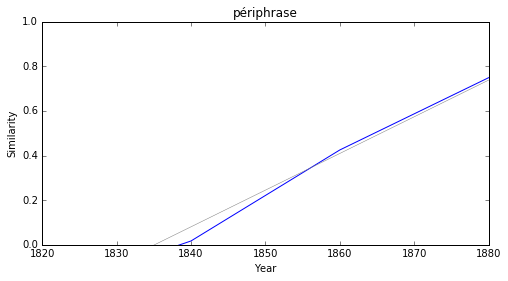

récalcitrant


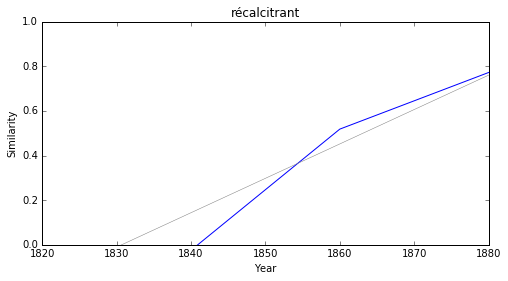

vitry


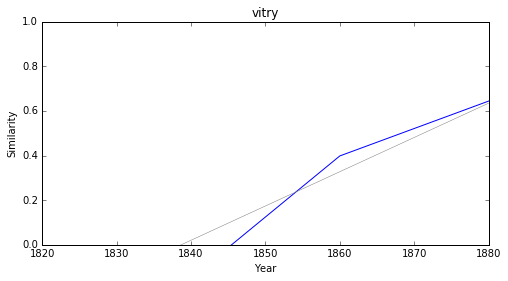

moisi


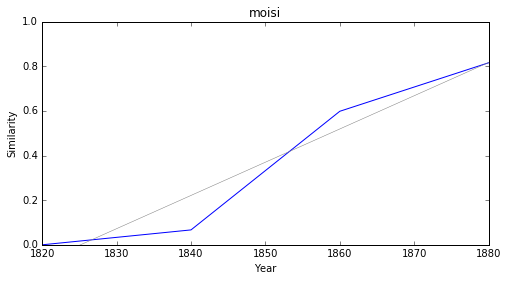

restrictif


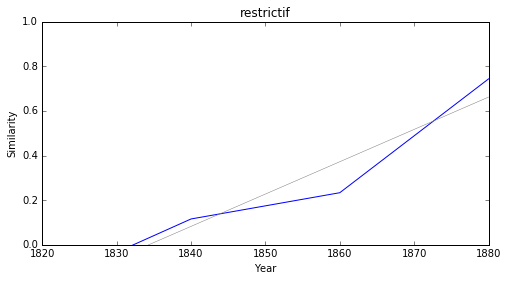

conradin


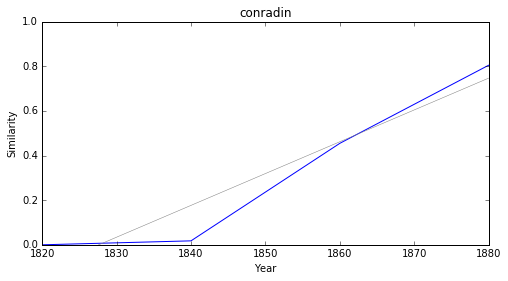

zénith


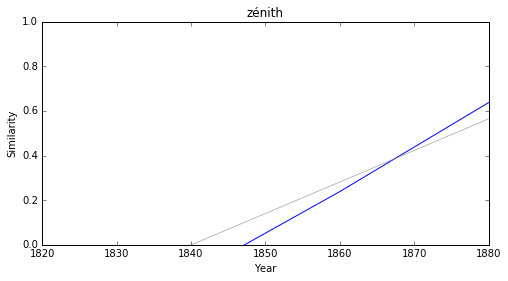

picorer


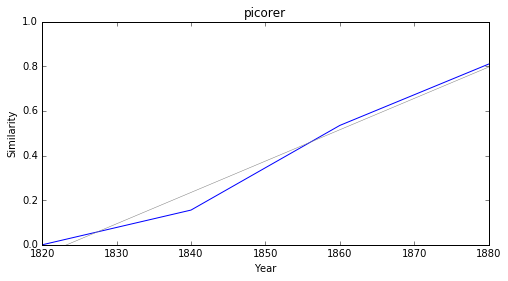

somnolent


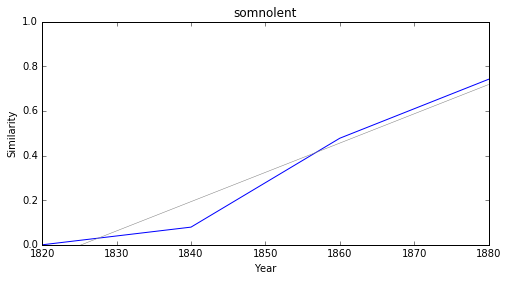

maret


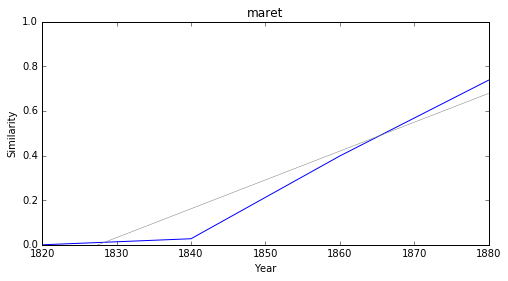

### <i><b>symbolisme</i></b>

          token     slope         p
13       chacal -0.008920  0.000457
36        tigre -0.008169  0.020246
2         temps -0.007708  0.025140
16   chargement -0.007228  0.028088
27     sophiste -0.006702  0.009353
28  réformateur -0.006270  0.027424
31        tyran -0.006166  0.025805
12       galère -0.005934  0.027049
39     localité -0.005588  0.018624
34        chose -0.005217  0.044107



peccadille


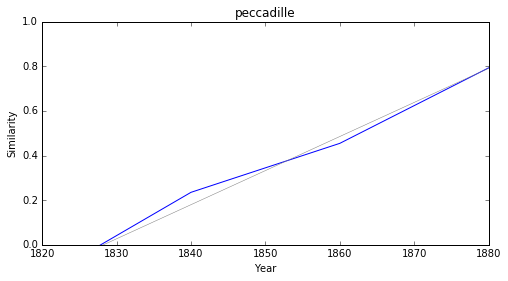

sauvegarder


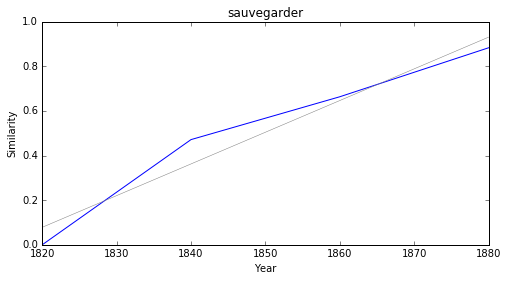

renouveau


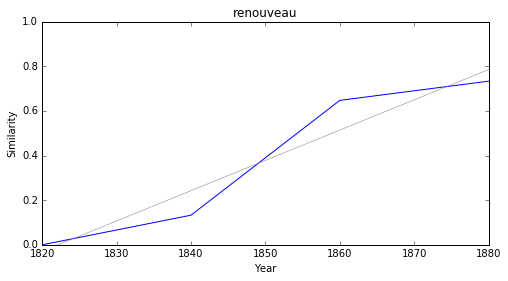

patronner


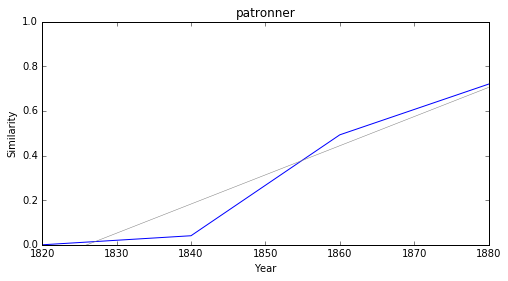

mécréant


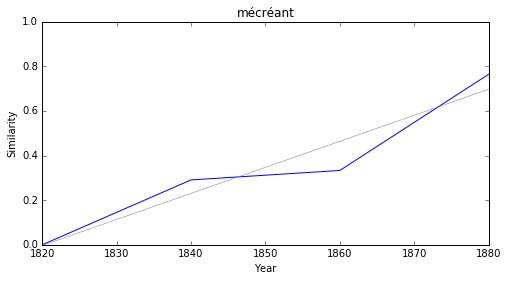

huppé


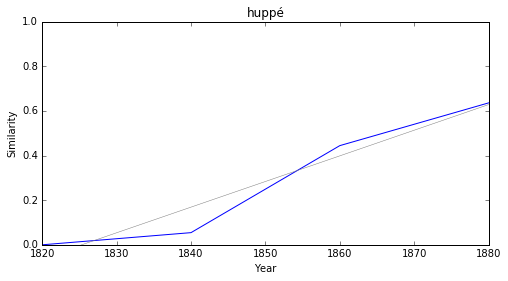

tourbillonnant


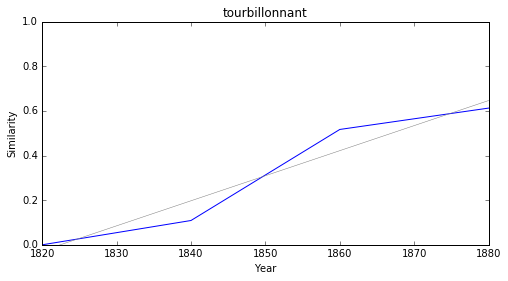

ontario


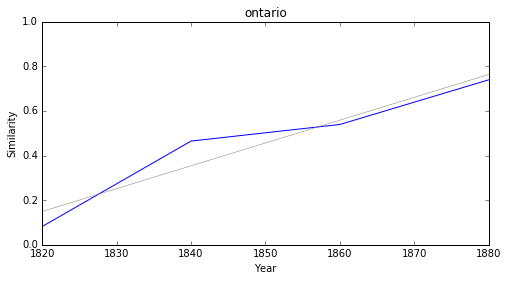

couvre


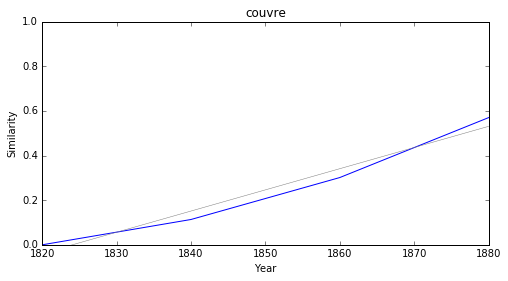

hung


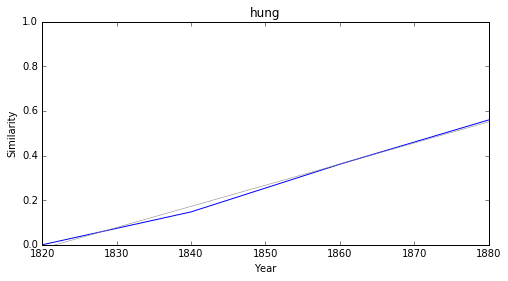

### <i><b>naturalisme</i></b>

        token     slope         p
18     london -0.015723  0.009491
23     frugal -0.013597  0.017924
26    ukraine -0.011184  0.017070
27  sémiramis -0.010123  0.037619
3      crique -0.008174  0.023332
8     impasse -0.008101  0.031953
11      horde -0.008018  0.028376
2       carré -0.006890  0.010677
35   archipel -0.006694  0.000482
34       cime -0.006550  0.035810



dogmatisme


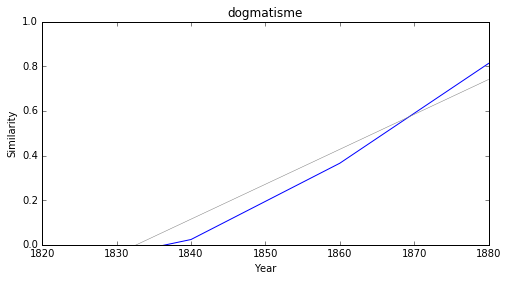

vitry


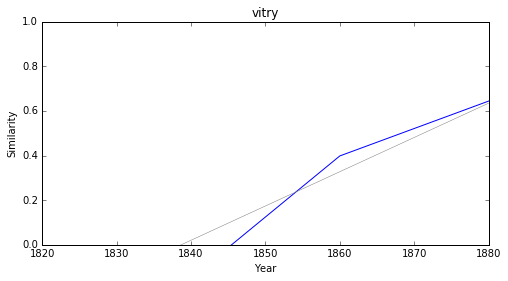

positiviste


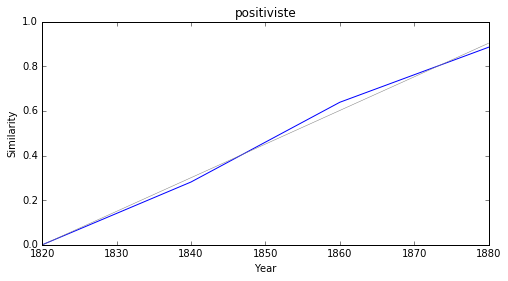

moisi


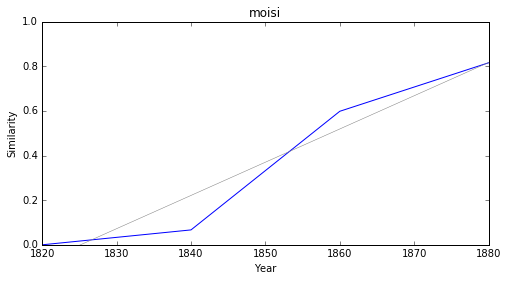

conradin


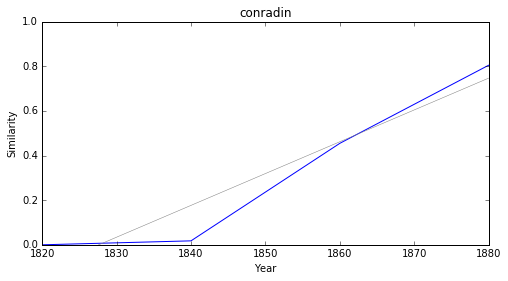

picorer


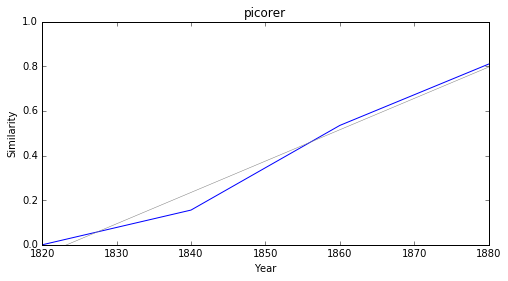

fashion


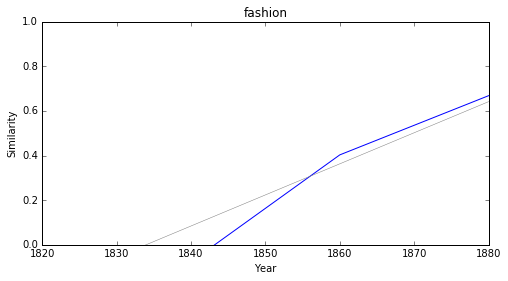

triumvirat


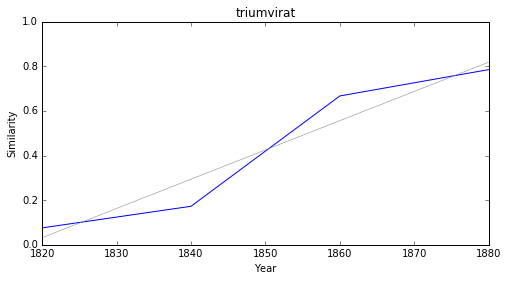

lé


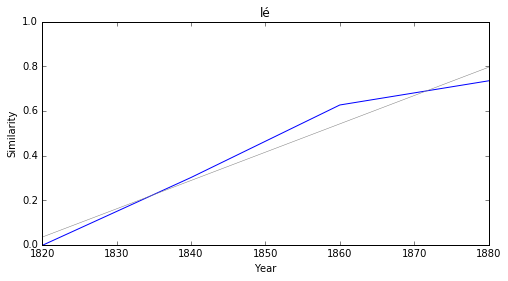

augurer


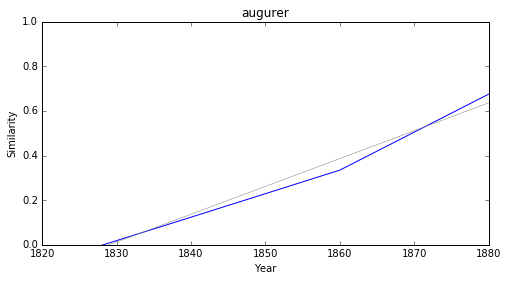

In [23]:
for word in testList :
    display(Markdown("### <i><b>"+word+"</i></b>"))
    df2 = pd.DataFrame(entries[word], columns=('token', 'slope', 'p'))
    print(df2.sort_values('slope', ascending=True).head(10))
    print('\n\n')
    
    for i, row in df2.sort_values('slope', ascending=False).head(10).iterrows():
        plot_cosine_series('littérature', row['token'], 8, 4)

# Intersected neighbors

In this part, we show which significant terms tend to be, throughout time, the nearest neighbours to the main entry. That is to say that these vectors follow the same evolution through time as the main entry and are very near to the "littérature" vector. At this stage, we only ask for significant terms (filter above : "if fit.pvalues[1] < 0.05").

In [24]:
def intersect_neighbor_vocab(anchor, topn=2000):
    
    vocabs = []
    
    for year, model in models.items():
        similar = model.most_similar(anchor, topn=topn)
        vocabs.append(set([s[0] for s in similar]))
        
    return set.intersection(*vocabs)

In [25]:
intersect_vocab = intersect_neighbor_vocab('littérature')

In [26]:
entries={}

for word in testList:
    data = []
    for token in intersect_neighbor_vocab(word):
    
        series = cosine_series('littérature', token)
        fit = lin_reg(series)
    
        if fit.pvalues[1] < 0.05:
            data.append((token, fit.params[1], fit.pvalues[1]))
    entries[word]=data

In [27]:
import pandas as pd

### <i><b>littérature</i></b>

             token     slope         p
15       intérieur -0.003225  0.014314
17       assemblée -0.003086  0.011471
6            école -0.003076  0.030137
10         variété -0.003062  0.046254
21       américain -0.003046  0.042373
24            base -0.002863  0.038574
30  administration -0.002784  0.022356
1            ligue -0.002782  0.037557
9          symbole -0.002771  0.006271
4    confédération -0.002754  0.003113



intérieur


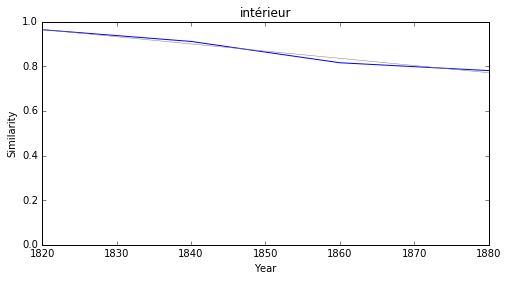

assemblée


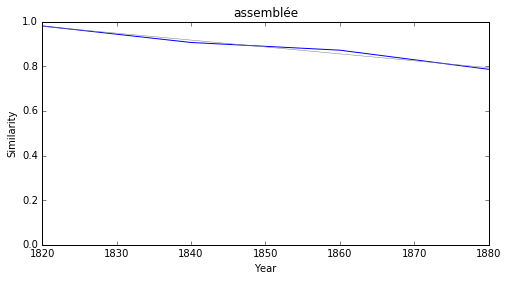

école


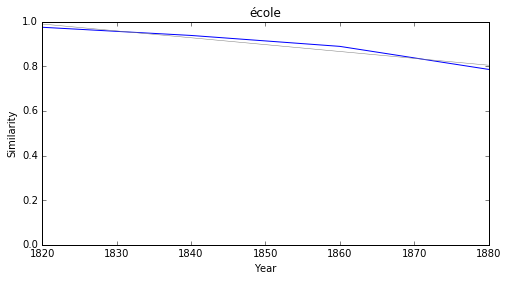

variété


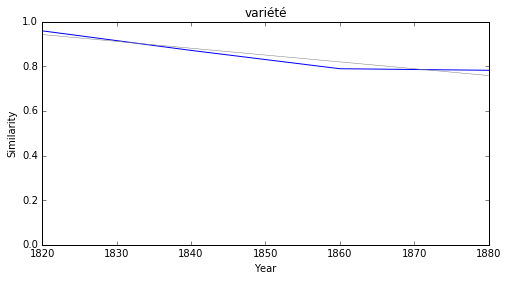

américain


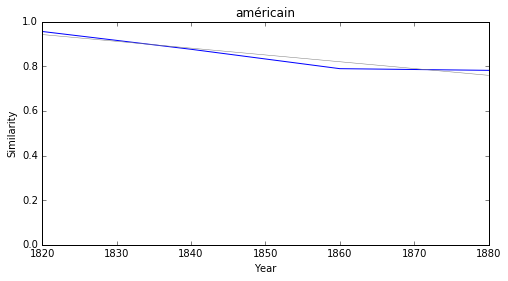

base


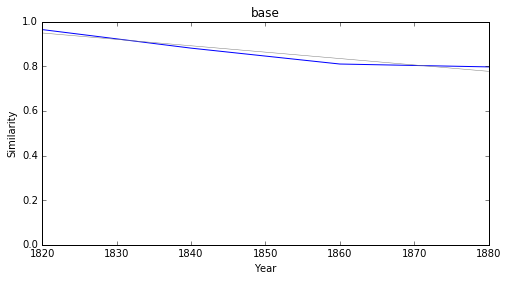

administration


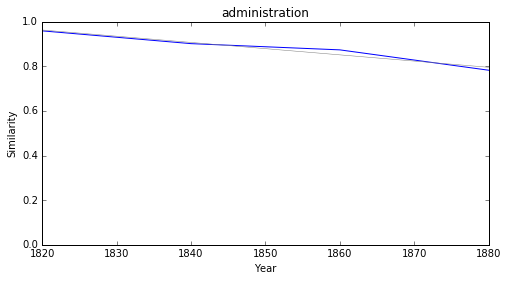

ligue


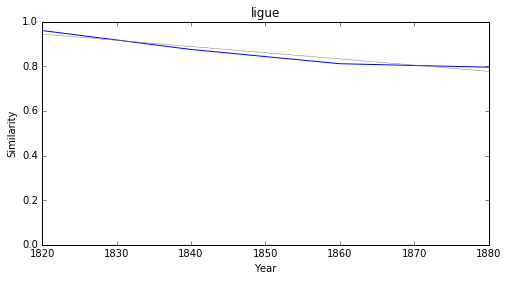

symbole


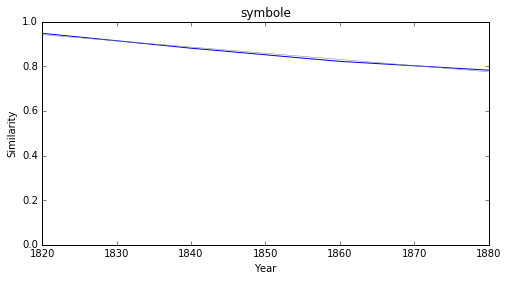

confédération


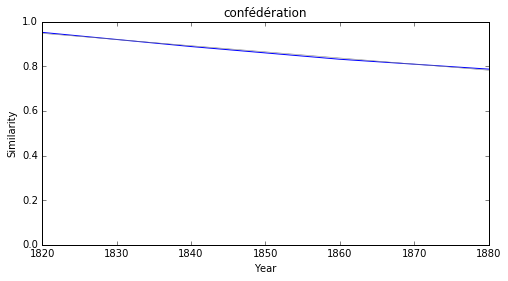

### <i><b>poésie</i></b>

           token     slope         p
35    expression -0.006442  0.045263
13          goût -0.006063  0.027297
31    différence -0.004831  0.014919
32  connaissance -0.004738  0.012819
15       utilité -0.004088  0.011800
22        animal -0.004031  0.019104
5          choix -0.004003  0.030599
7        respect -0.003782  0.010598
9      érudition -0.003650  0.008007
30       naturel -0.003522  0.042976



expression


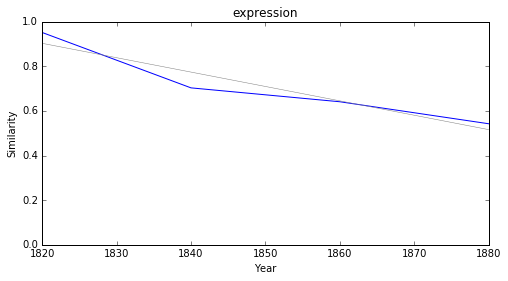

goût


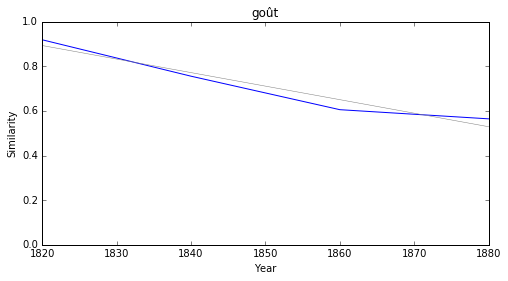

différence


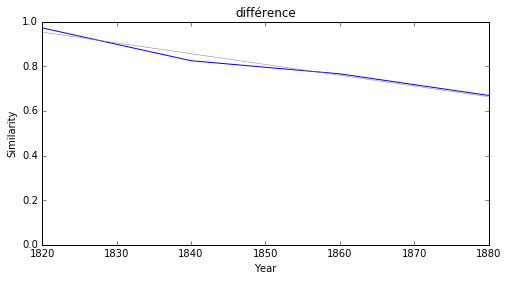

connaissance


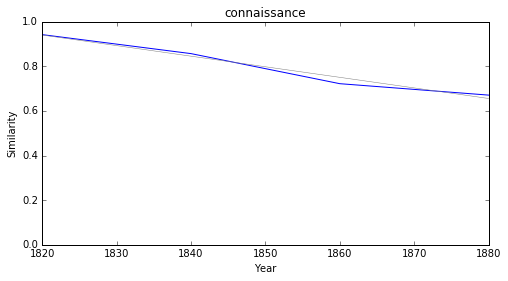

utilité


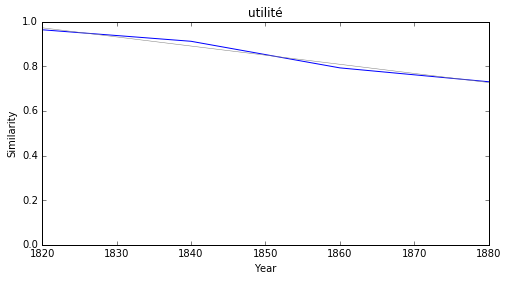

animal


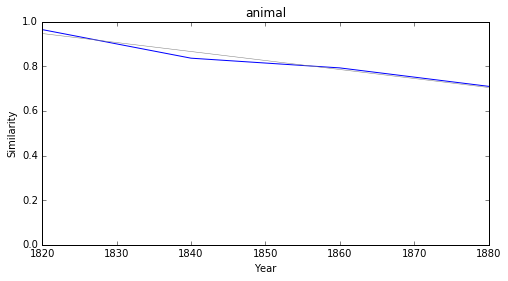

choix


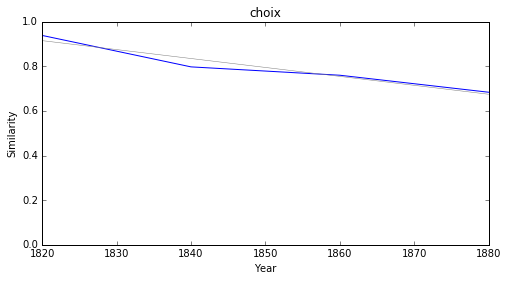

respect


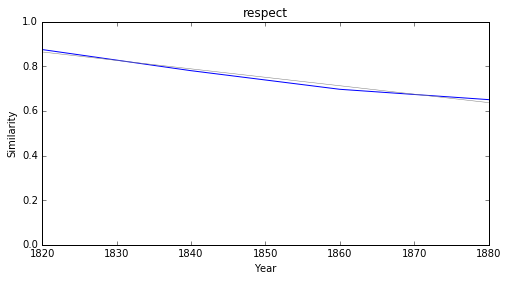

érudition


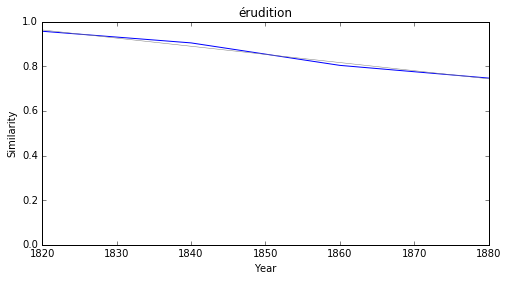

naturel


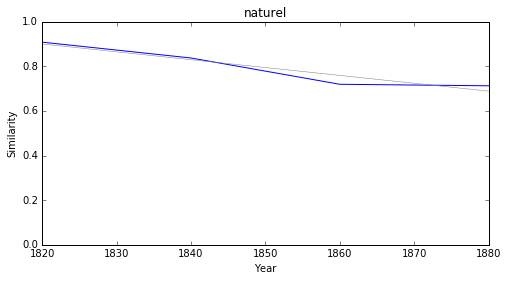

### <i><b>science</i></b>

         token     slope         p
56        goût -0.006063  0.027297
24       forme -0.005944  0.003317
23     travail -0.005350  0.039644
19      empire -0.005340  0.010169
83     attaque -0.005258  0.031298
80    relation -0.005237  0.000886
64      ancien -0.005099  0.001092
78      membre -0.005060  0.002210
47  différence -0.004831  0.014919
2      anglais -0.004798  0.038224



goût


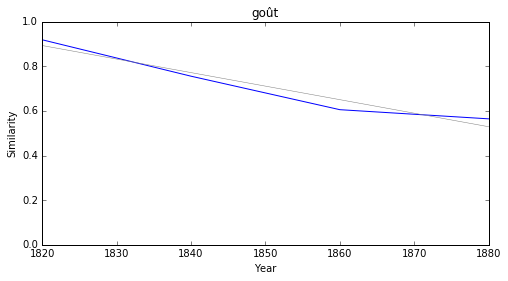

forme


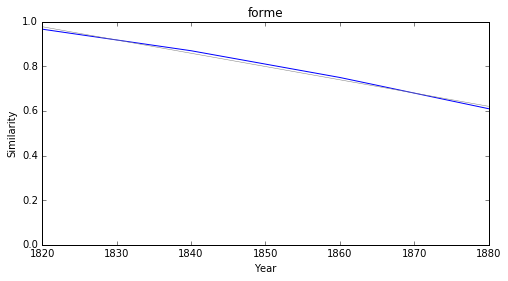

travail


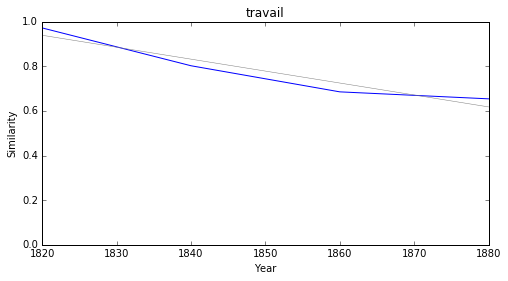

empire


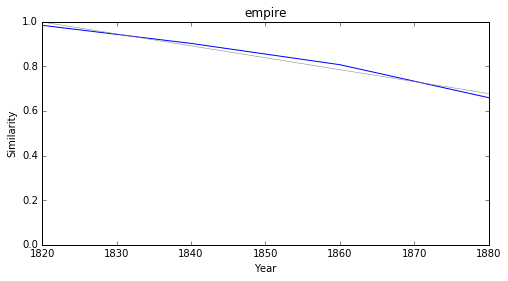

attaque


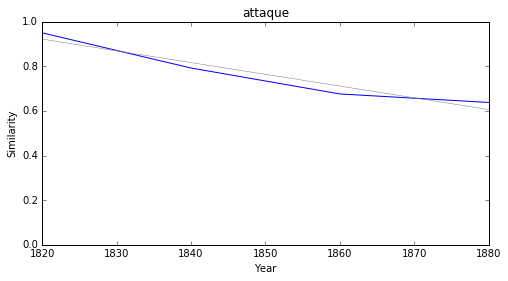

relation


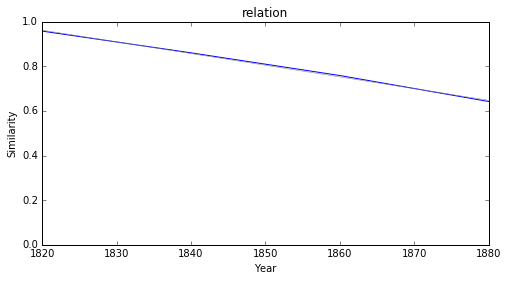

ancien


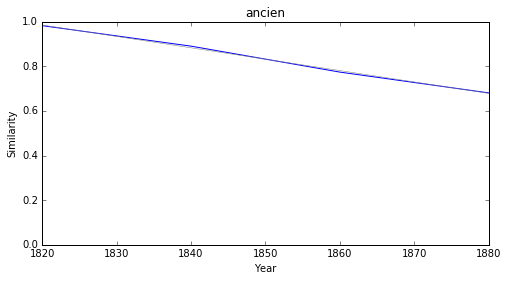

membre


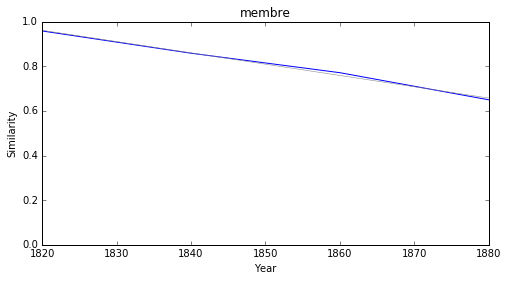

différence


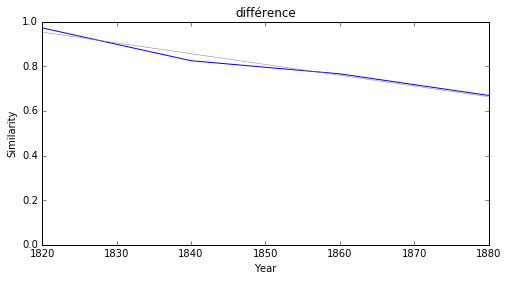

anglais


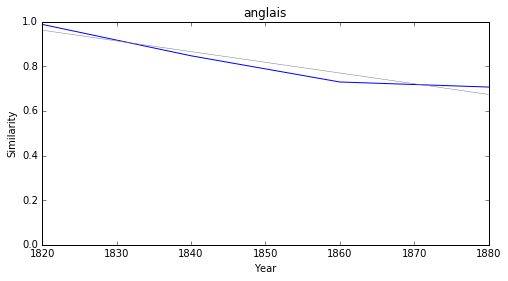

### <i><b>savoir</i></b>

           token     slope         p
0         partir -0.009330  0.046056
16         alors -0.008738  0.015540
1        appeler -0.007226  0.039331
6           goût -0.006063  0.027297
15         chose -0.005217  0.044107
12          idée -0.005182  0.016626
9        exemple -0.005143  0.022409
8           pays -0.004830  0.034580
4   connaissance -0.004738  0.012819
3          égard -0.004374  0.032402



partir


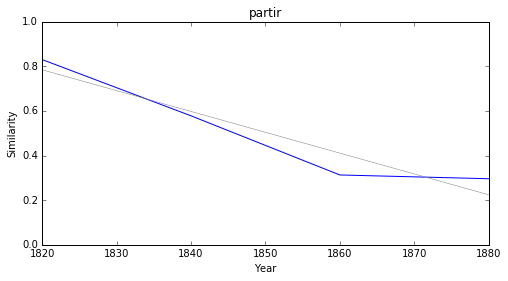

alors


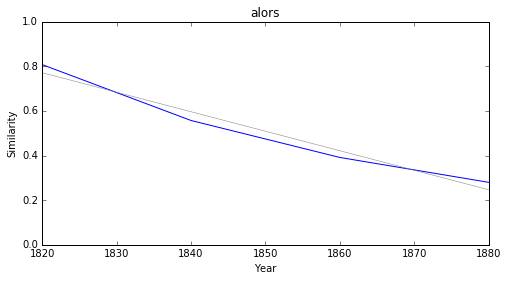

appeler


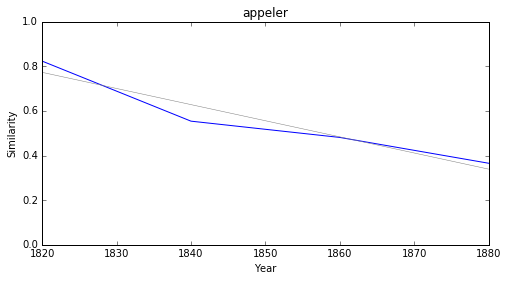

goût


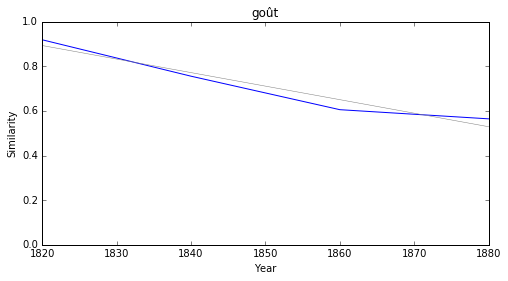

chose


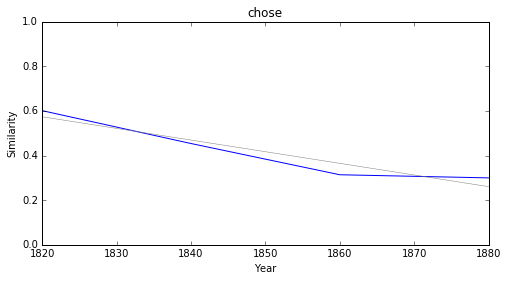

idée


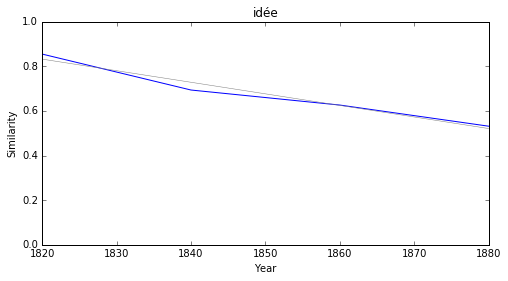

exemple


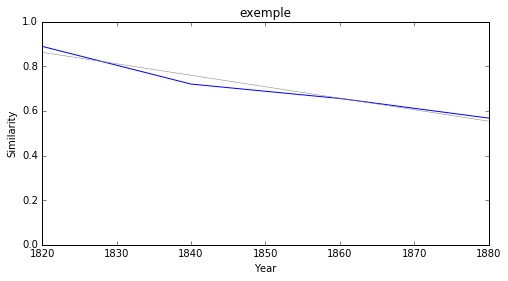

pays


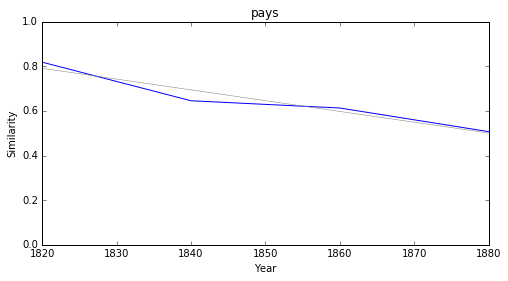

connaissance


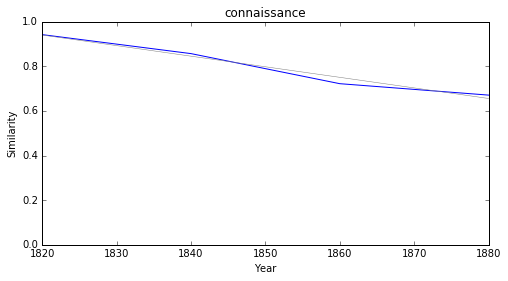

égard


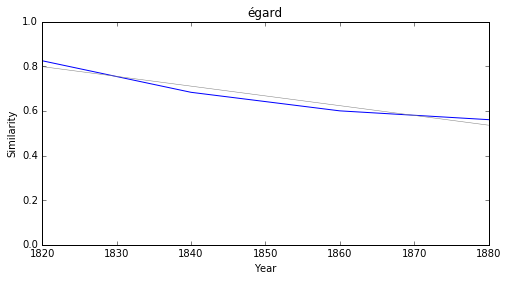

### <i><b>histoire</i></b>

      token     slope         p
48   siècle -0.007156  0.048405
44    ordre -0.007067  0.010272
13     rang -0.006814  0.002347
20     page -0.006793  0.017720
53   france -0.006609  0.015401
62    suite -0.006537  0.006897
73    façon -0.006441  0.037881
95  conseil -0.006223  0.000807
87   partie -0.006169  0.008586
43    cours -0.006104  0.008896



siècle


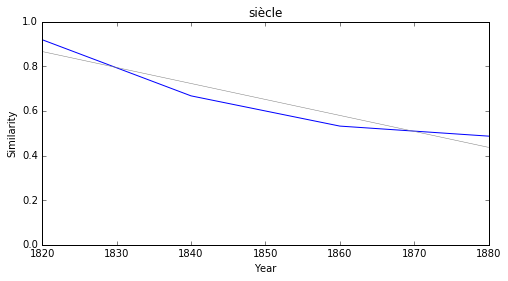

ordre


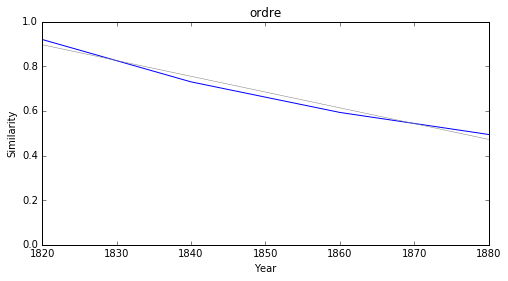

rang


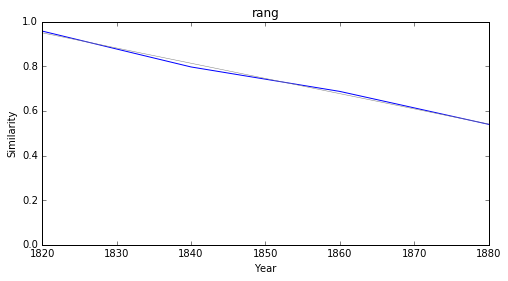

page


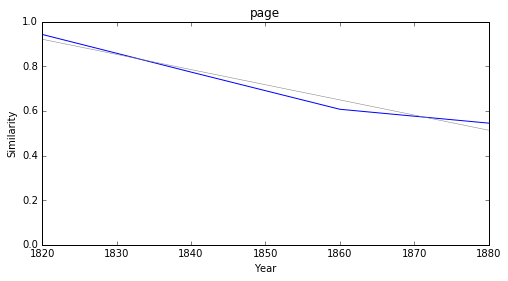

france


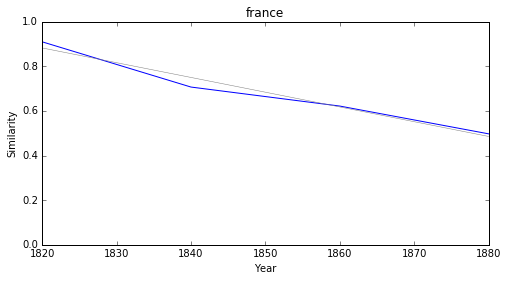

suite


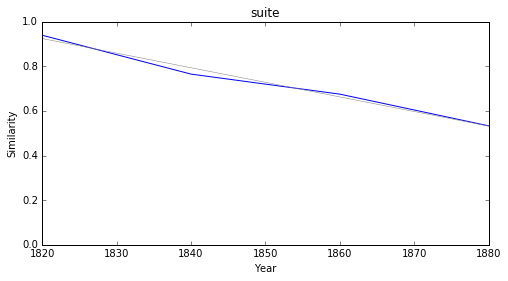

façon


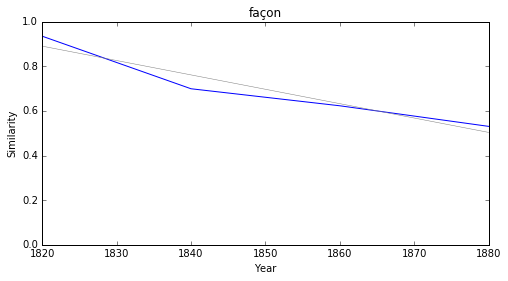

conseil


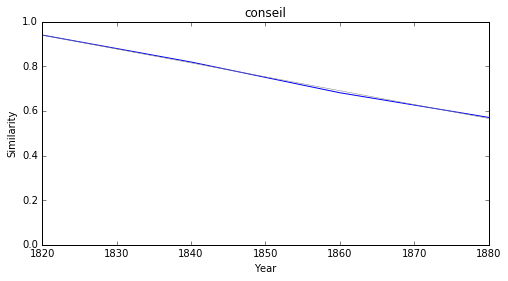

partie


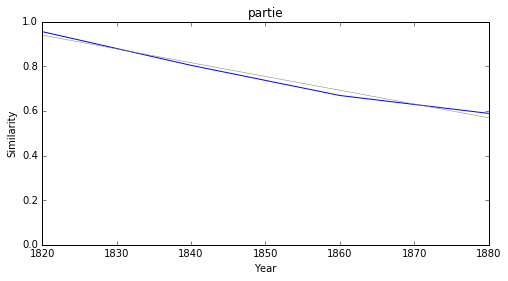

cours


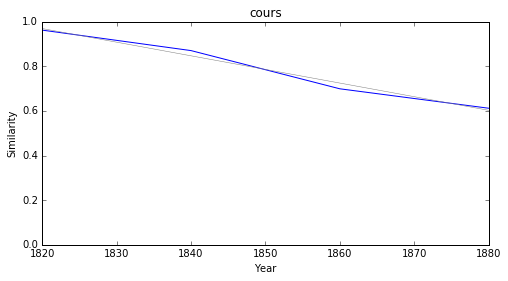

### <i><b>philosophie</i></b>

       token     slope         p
42     suite -0.006537  0.006897
51     façon -0.006441  0.037881
40      goût -0.006063  0.027297
59    prusse -0.005606  0.000049
37  habitude -0.005501  0.018412
14   travail -0.005350  0.039644
12    empire -0.005340  0.010169
56  relation -0.005237  0.000886
29   général -0.005175  0.017044
45    ancien -0.005099  0.001092



suite


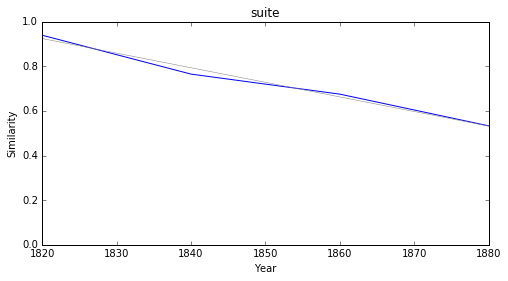

façon


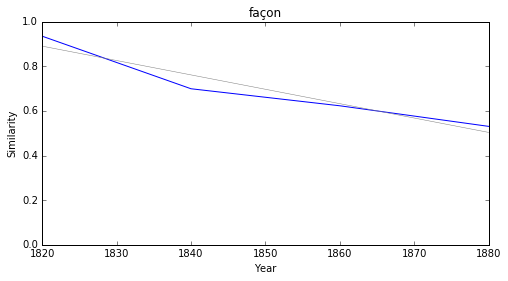

goût


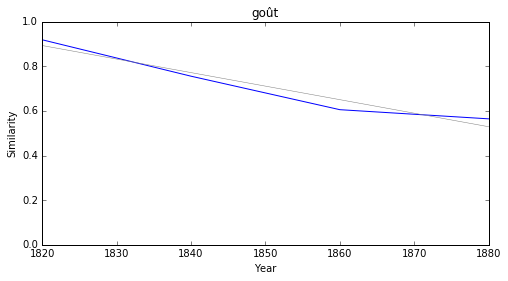

prusse


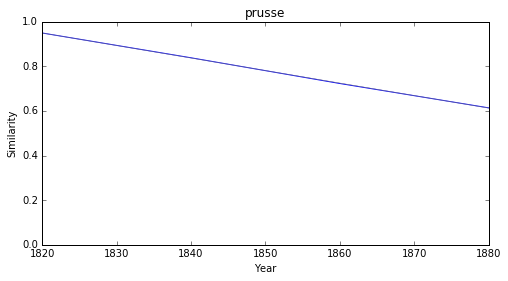

habitude


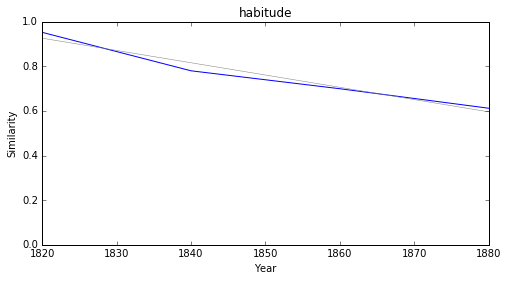

travail


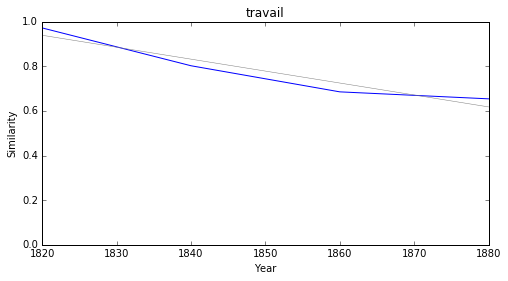

empire


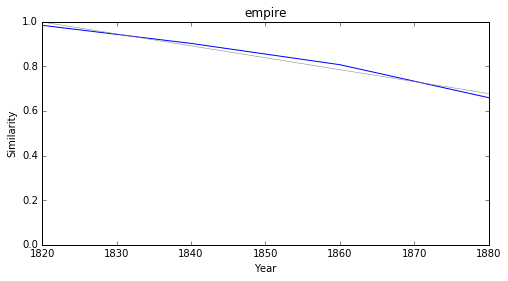

relation


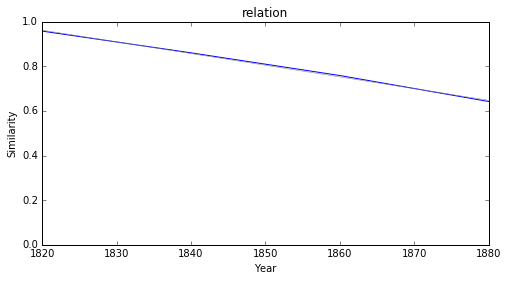

général


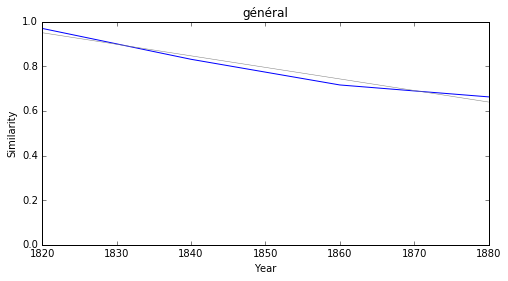

ancien


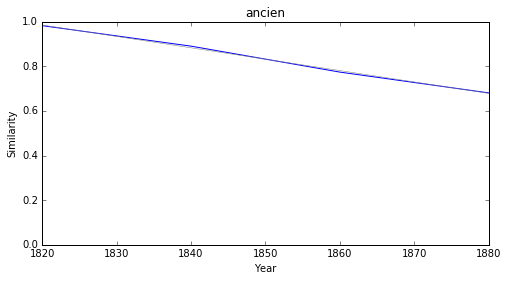

### <i><b>lettre</i></b>

         token     slope         p
1       phrase -0.007553  0.039357
9         page -0.006793  0.017720
0      journal -0.006792  0.030479
6     empereur -0.006729  0.011613
7          nom -0.006216  0.005584
10    camarade -0.006076  0.044866
5   successeur -0.004998  0.015220
8      mémoire -0.004963  0.046450
2         note -0.004950  0.007569
3   secrétaire -0.004268  0.038719



phrase


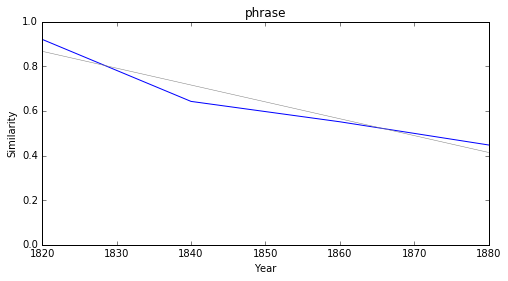

page


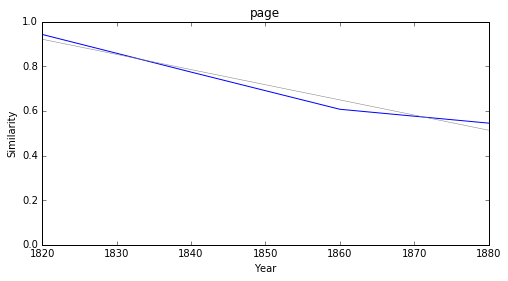

journal


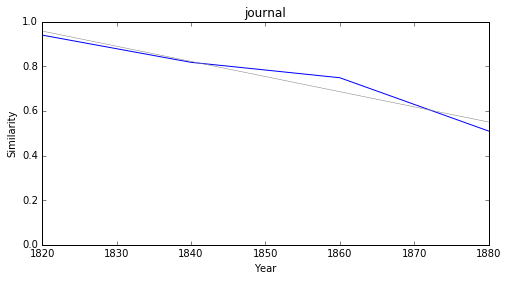

empereur


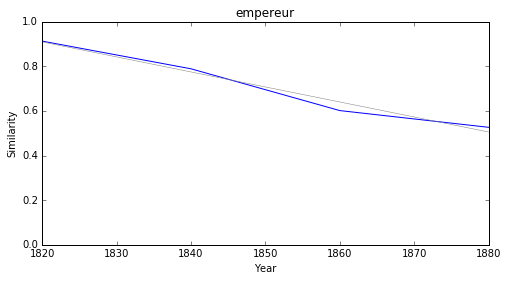

nom


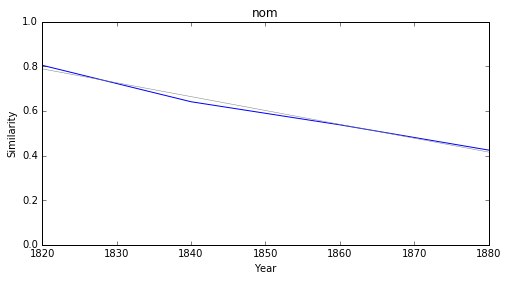

camarade


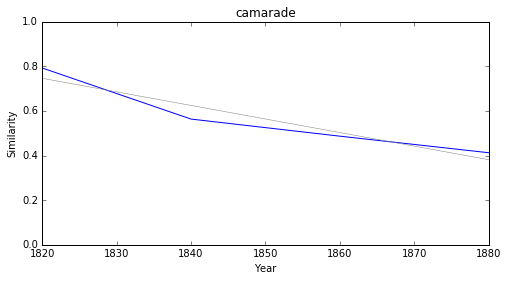

successeur


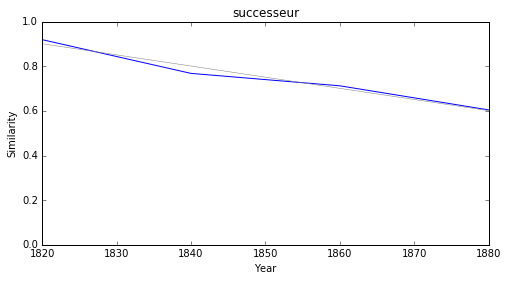

mémoire


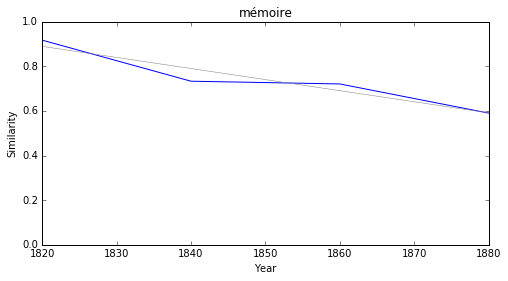

note


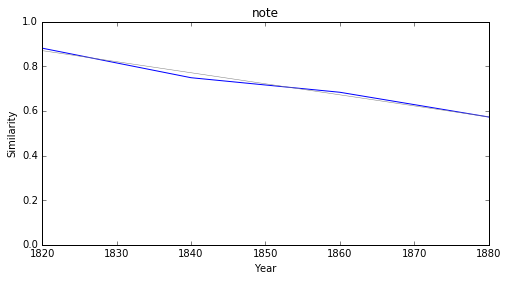

secrétaire


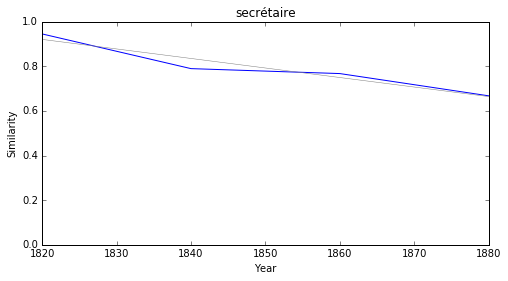

### <i><b>critique</i></b>

           token     slope         p
3      condition -0.004316  0.026131
6    observation -0.004045  0.042081
5          choix -0.004003  0.030599
4        réalité -0.003858  0.042915
20   disposition -0.003702  0.034700
7   indifférence -0.003640  0.049360
19       naturel -0.003522  0.042976
18        valeur -0.003520  0.031877
21   particulier -0.003482  0.017055
22          paix -0.003310  0.008634



condition


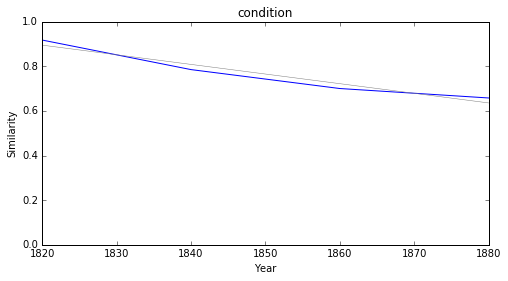

observation


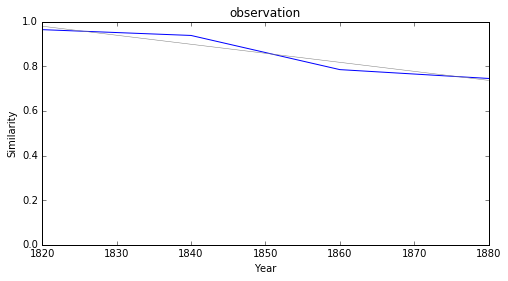

choix


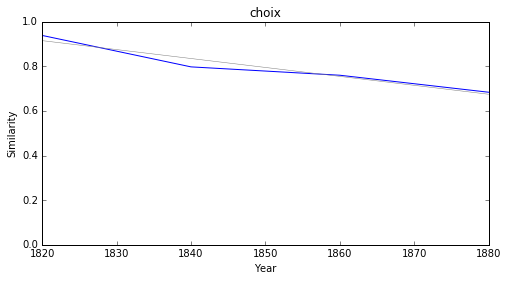

réalité


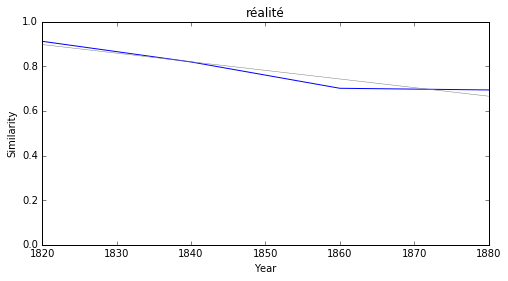

disposition


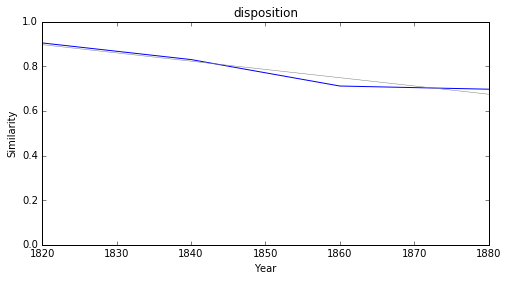

indifférence


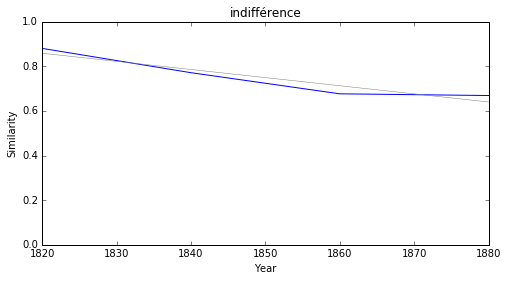

naturel


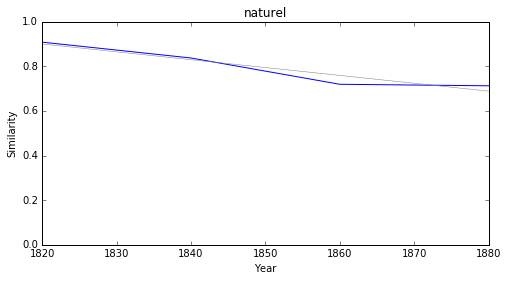

valeur


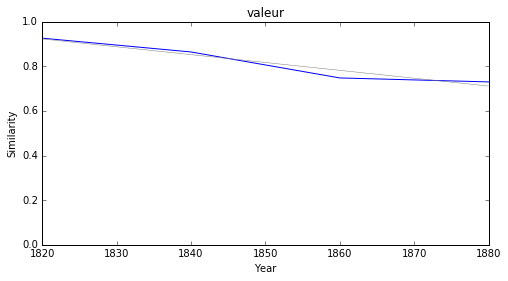

particulier


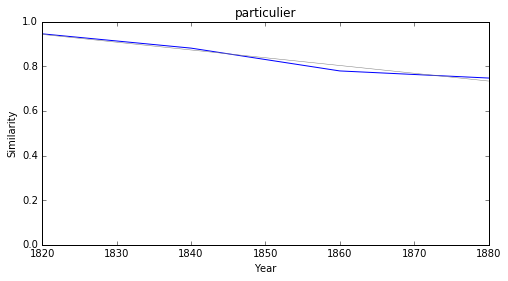

paix


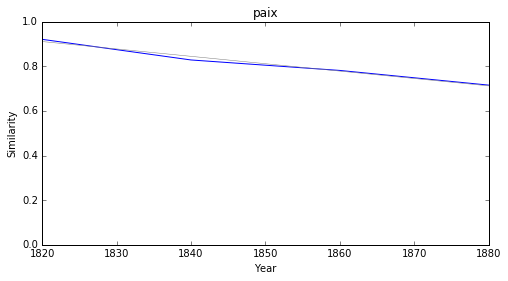

### <i><b>roman</i></b>

           token     slope         p
9           page -0.006793  0.017720
11       tableau -0.005519  0.017552
1         refuge -0.004772  0.031731
7         animal -0.004031  0.019104
3          choix -0.004003  0.030599
4   indifférence -0.003640  0.049360
2     découverte -0.003545  0.032680
8     simplicité -0.003514  0.033690
0        coutume -0.003421  0.016124
5        variété -0.003062  0.046254



page


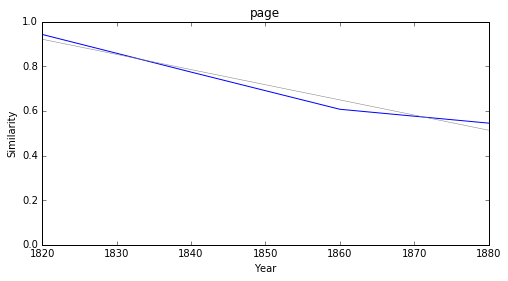

tableau


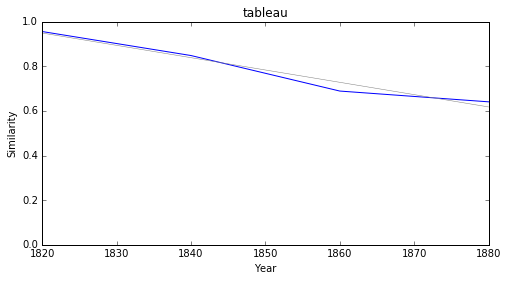

refuge


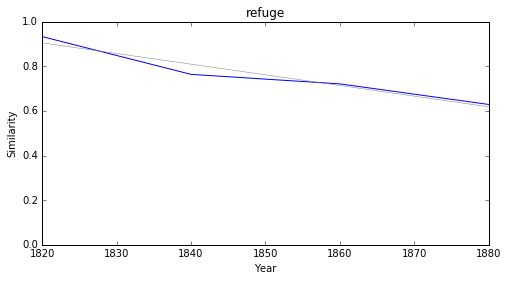

animal


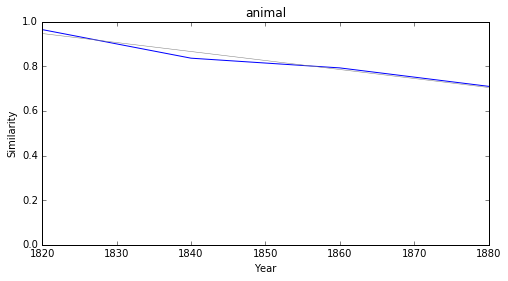

choix


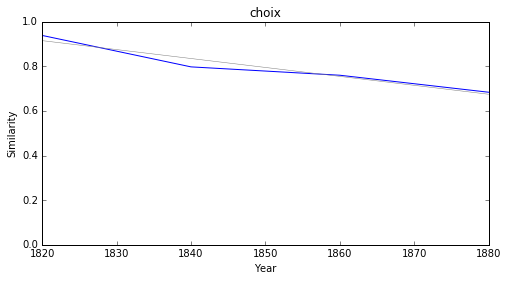

indifférence


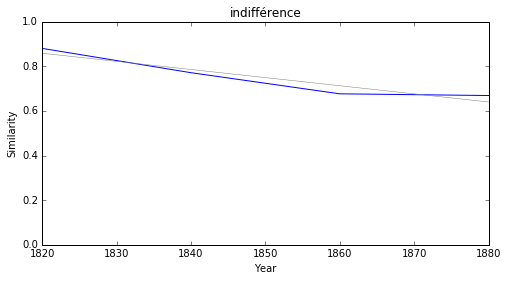

découverte


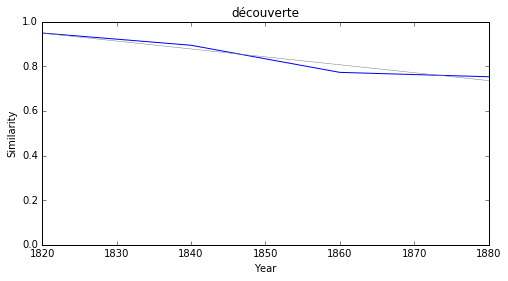

simplicité


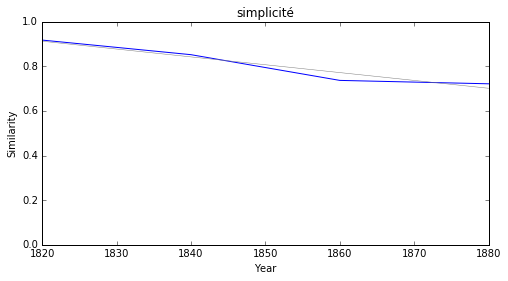

coutume


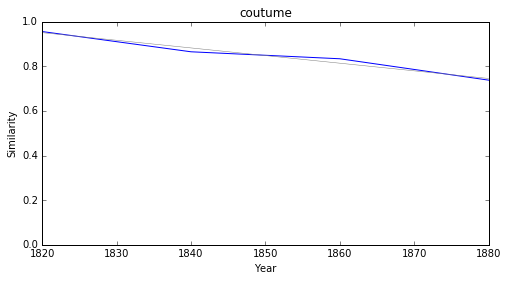

variété


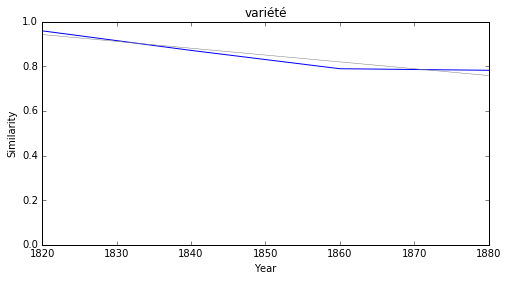

### <i><b>théâtre</i></b>

       token     slope         p
7    passage -0.008434  0.041818
19    sommet -0.007619  0.040466
6     caveau -0.007357  0.013109
14    fleuve -0.007341  0.039305
24     puits -0.007084  0.022792
8      pente -0.006923  0.042082
22  boutique -0.006852  0.039049
26      rang -0.006814  0.002347
10   journal -0.006792  0.030479
21  pavillon -0.006716  0.041256



passage


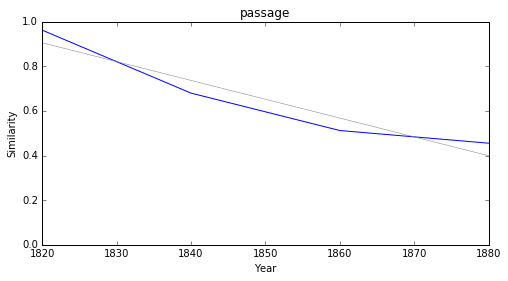

sommet


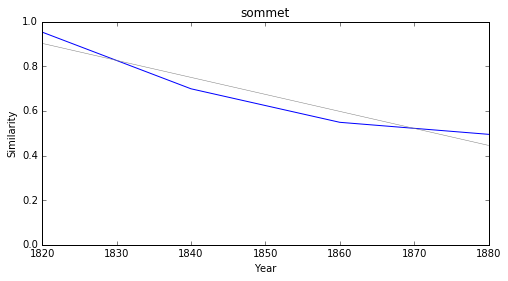

caveau


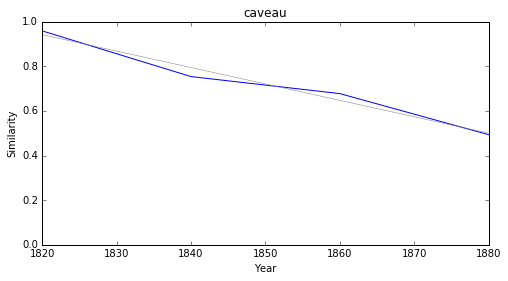

fleuve


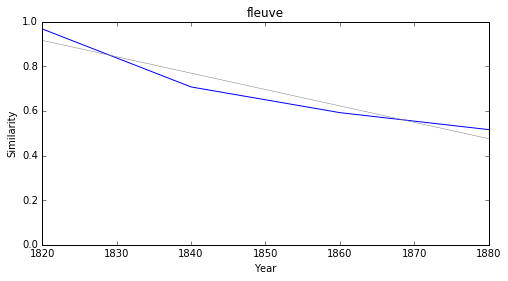

puits


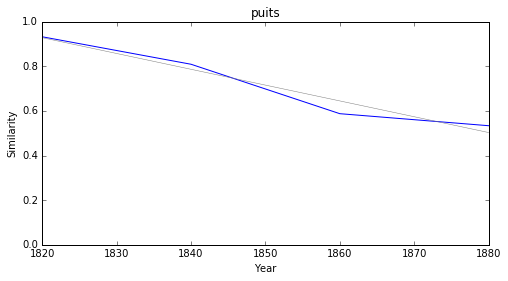

pente


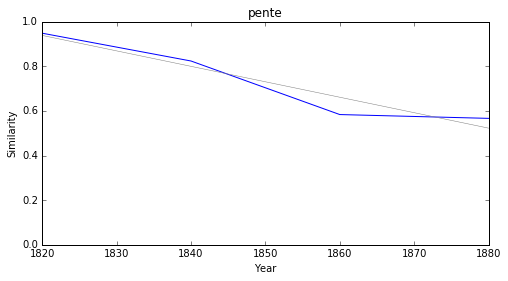

boutique


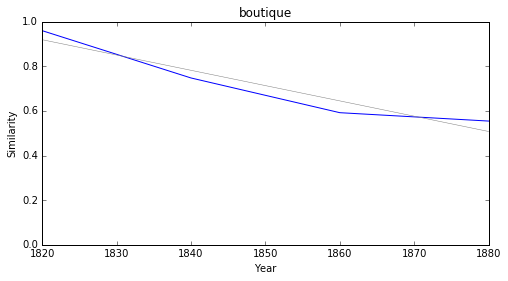

rang


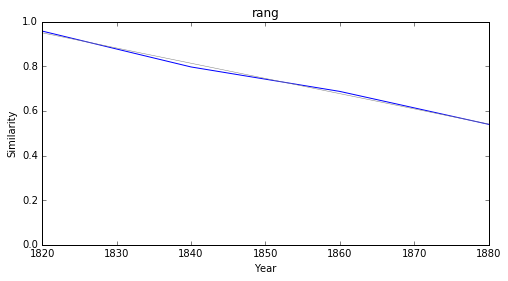

journal


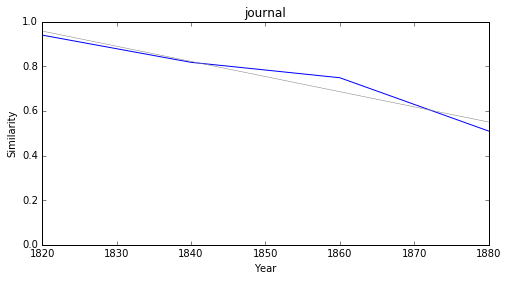

pavillon


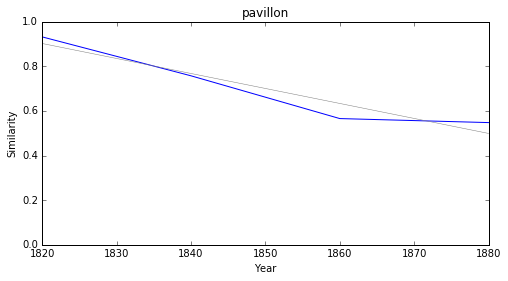

### <i><b>drame</i></b>

         token     slope         p
18    quartier -0.006064  0.001250
1     chaussée -0.005939  0.009522
8       centre -0.005935  0.008050
23     tableau -0.005519  0.017552
15        camp -0.005509  0.031391
20       globe -0.005061  0.014543
16     costume -0.005036  0.004637
0       refuge -0.004772  0.031731
2      contrée -0.004727  0.024867
12  secrétaire -0.004268  0.038719



quartier


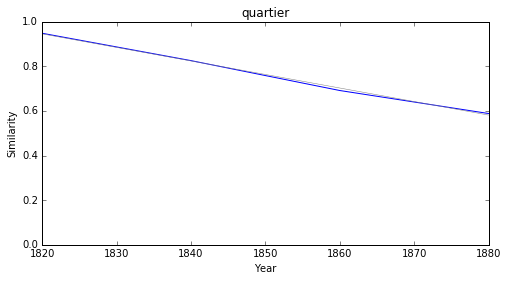

chaussée


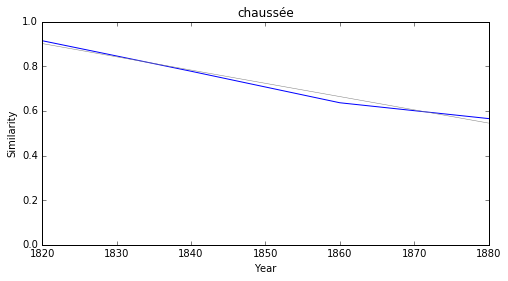

centre


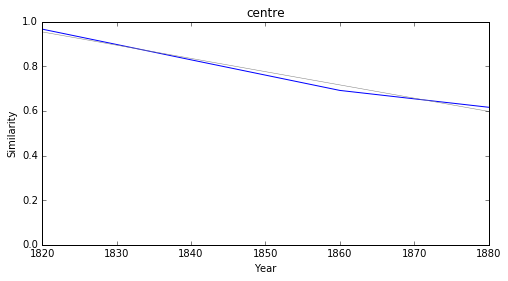

tableau


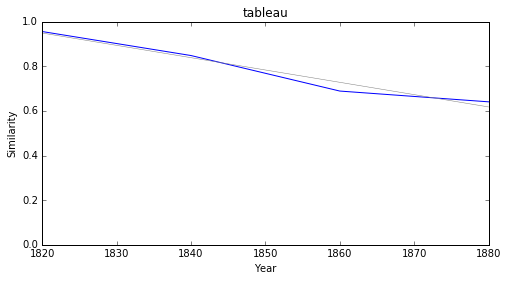

camp


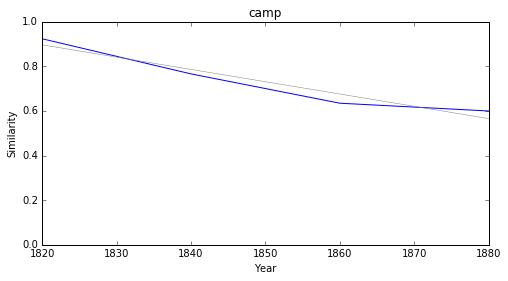

globe


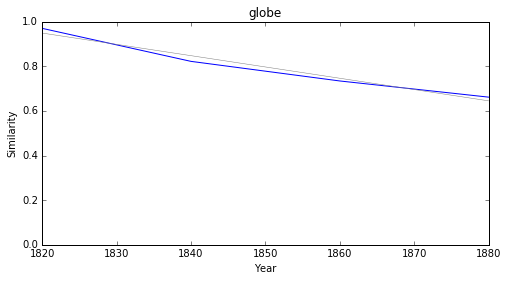

costume


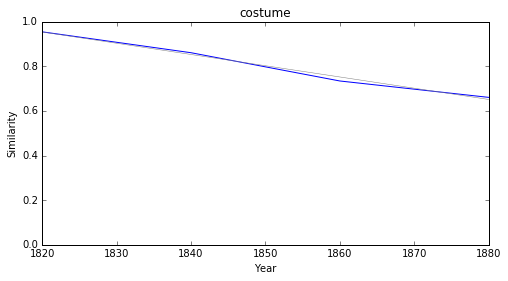

refuge


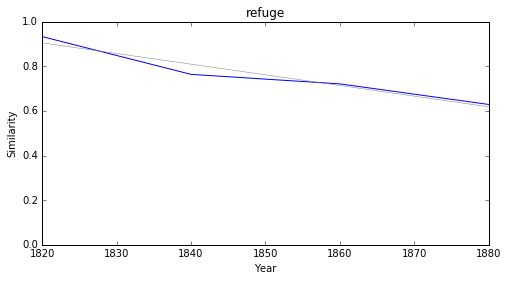

contrée


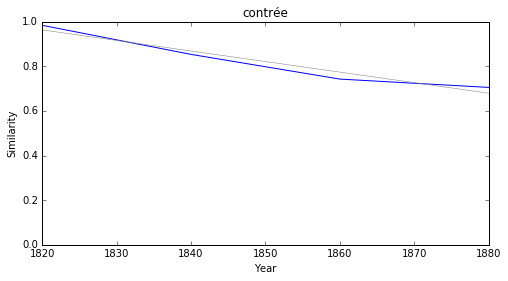

secrétaire


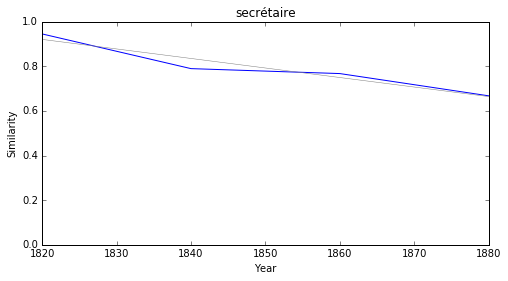

### <i><b>esprit</i></b>

         token     slope         p
23     presque -0.010433  0.007303
47   mouvement -0.007496  0.018156
68       trait -0.007424  0.035014
33       parti -0.006646  0.022232
40  expression -0.006442  0.045263
56       façon -0.006441  0.037881
7     présence -0.006312  0.000473
49         nom -0.006216  0.005584
46        goût -0.006063  0.027297
10       forme -0.005944  0.003317



presque


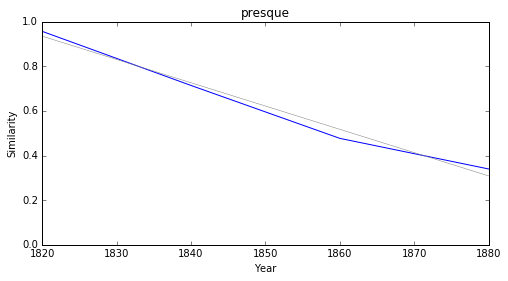

mouvement


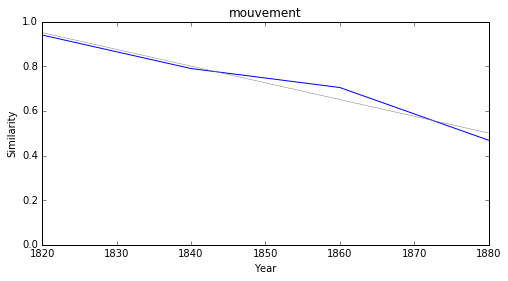

trait


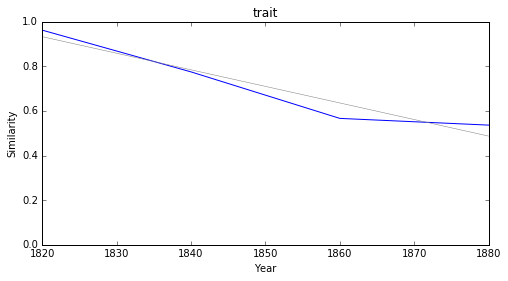

parti


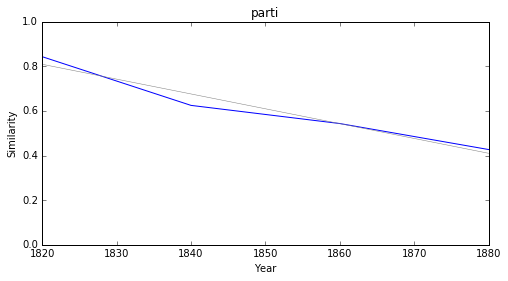

expression


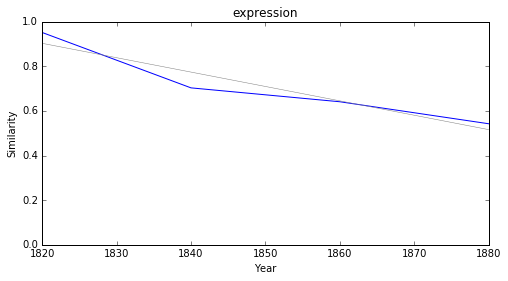

façon


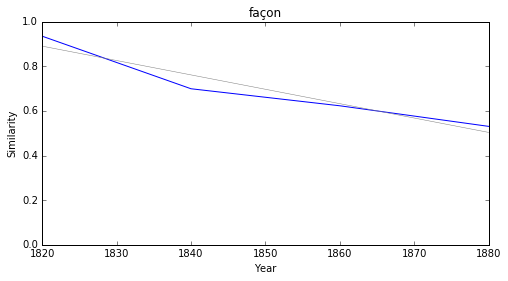

présence


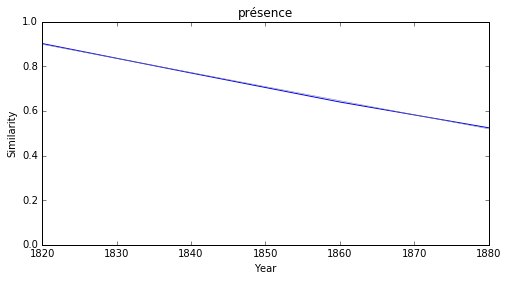

nom


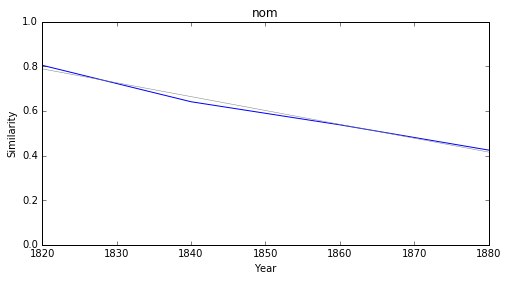

goût


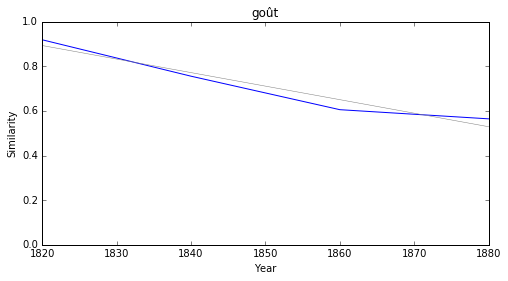

forme


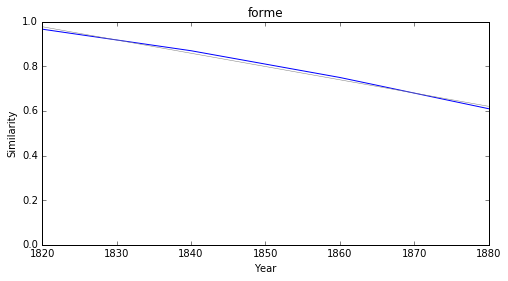

### <i><b>langue</i></b>

           token     slope         p
37       tableau -0.005519  0.017552
7       habitude -0.005501  0.018412
28      attitude -0.005440  0.020285
16       attaque -0.005258  0.031298
32    différence -0.004831  0.014919
35  connaissance -0.004738  0.012819
24     existence -0.004581  0.009667
30     empreinte -0.004426  0.015470
0          phase -0.004313  0.030517
25      prestige -0.004218  0.006495



tableau


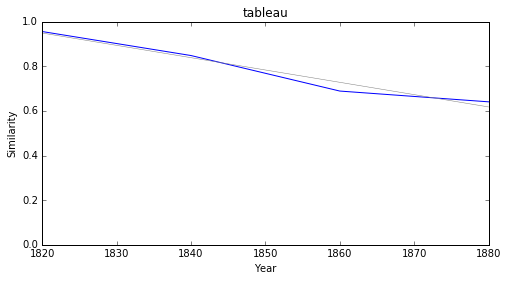

habitude


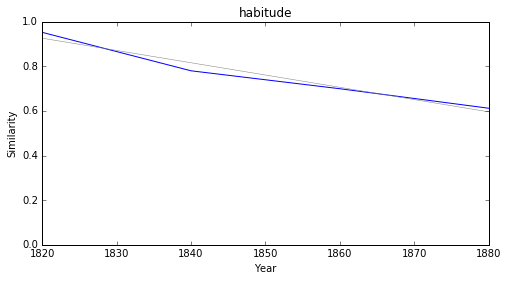

attitude


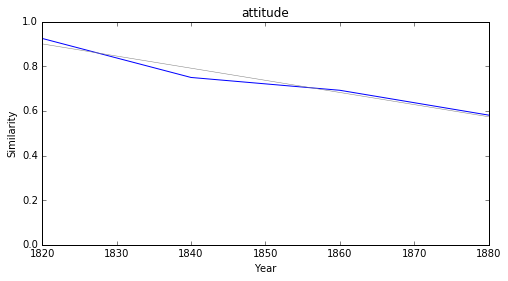

attaque


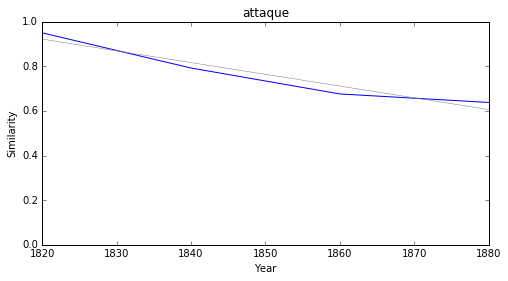

différence


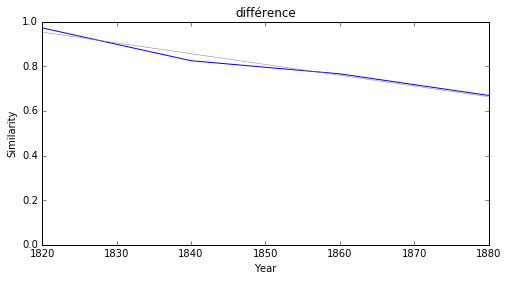

connaissance


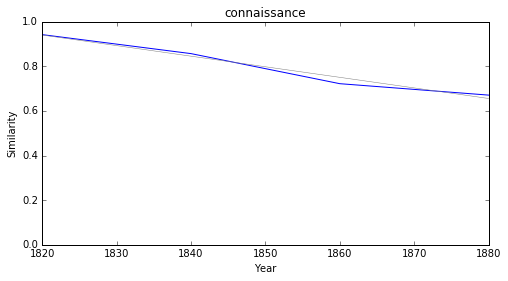

existence


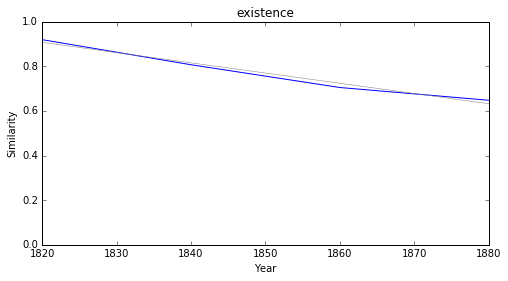

empreinte


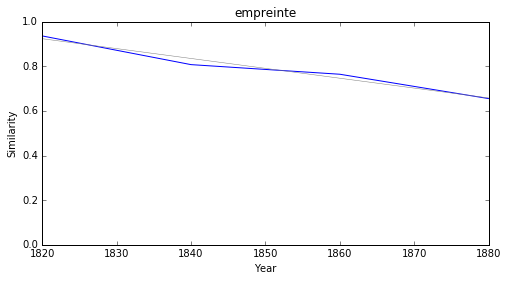

phase


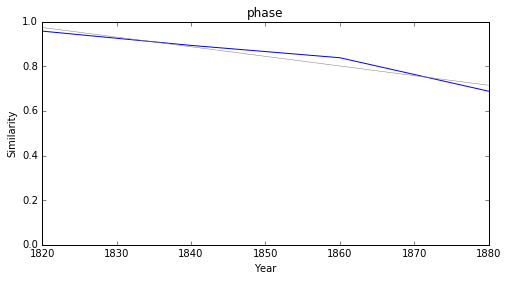

prestige


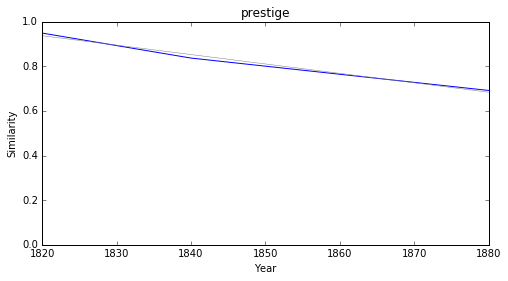

### <i><b>diplomatie</i></b>

           token     slope         p
10       chaleur -0.004709  0.022404
8   proclamation -0.004567  0.011658
13     empreinte -0.004426  0.015470
15   disposition -0.003702  0.034700
2     découverte -0.003545  0.032680
4       invasion -0.003469  0.033389
0       bretagne -0.003347  0.029354
5       appareil -0.003138  0.018812
6        variété -0.003062  0.046254
9         unique -0.002984  0.005502



chaleur


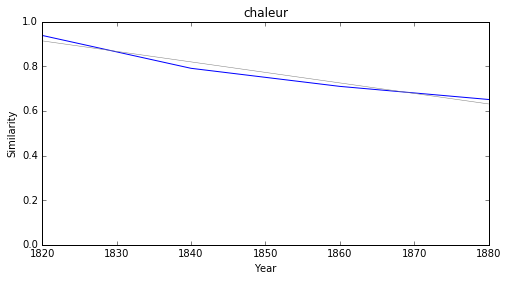

proclamation


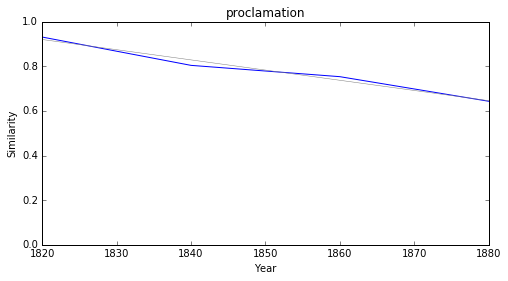

empreinte


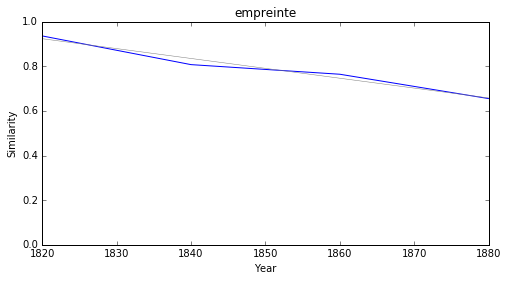

disposition


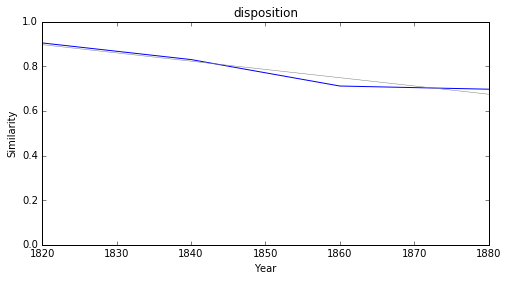

découverte


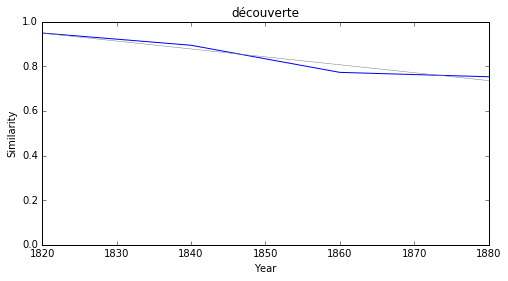

invasion


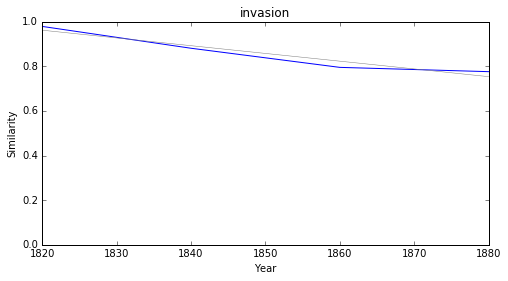

bretagne


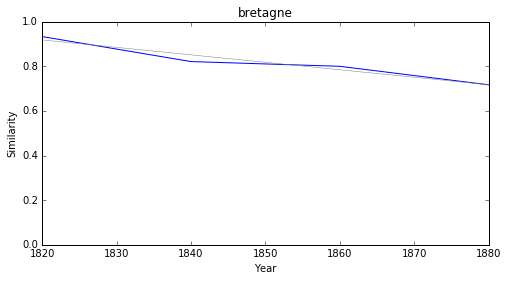

appareil


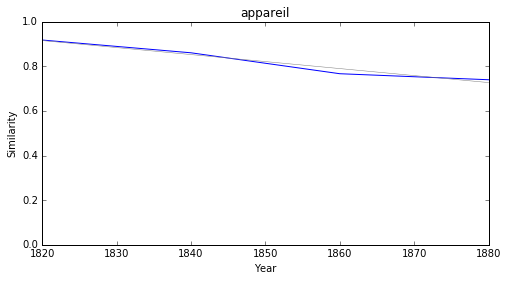

variété


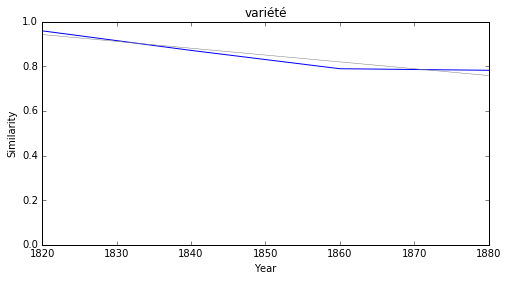

unique


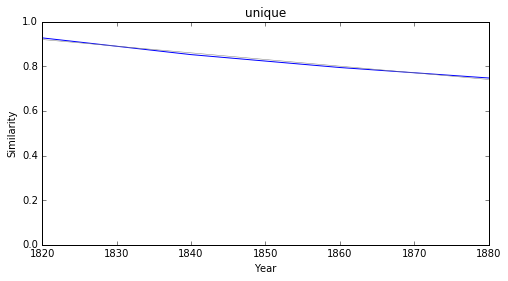

### <i><b>politique</i></b>

          token     slope         p
73        armée -0.007865  0.003266
14         rang -0.006814  0.002347
91      nouveau -0.006779  0.015825
61       france -0.006609  0.015401
99     français -0.006503  0.001331
106     conseil -0.006223  0.000807
98       partie -0.006169  0.008586
84   angleterre -0.006099  0.024524
67         goût -0.006063  0.027297
26        forme -0.005944  0.003317



armée


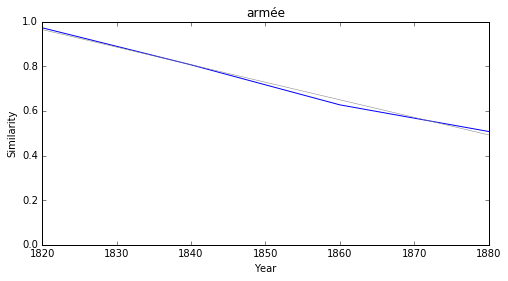

rang


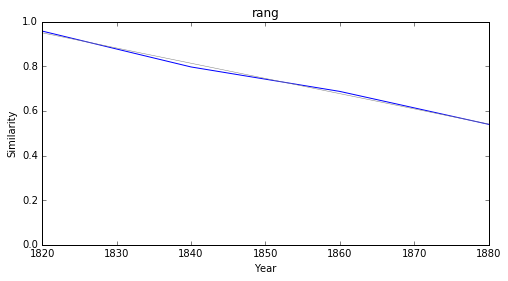

nouveau


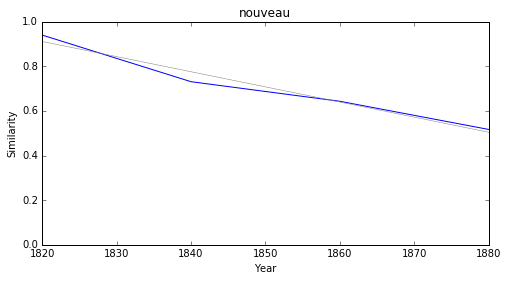

france


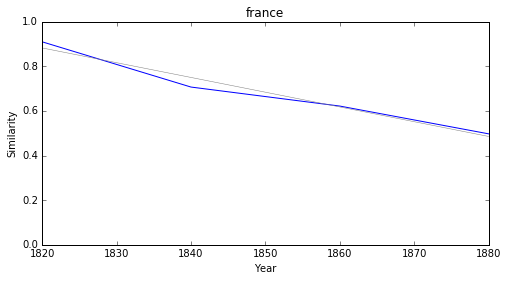

français


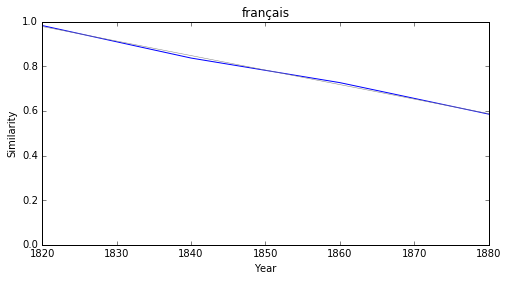

conseil


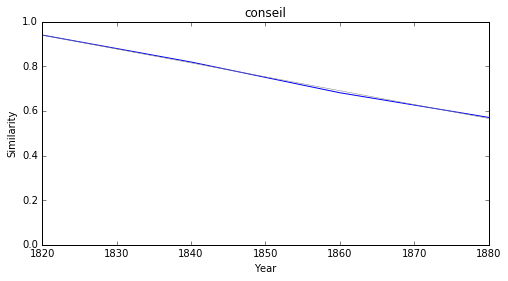

partie


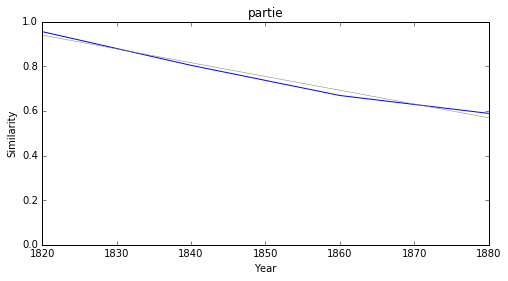

angleterre


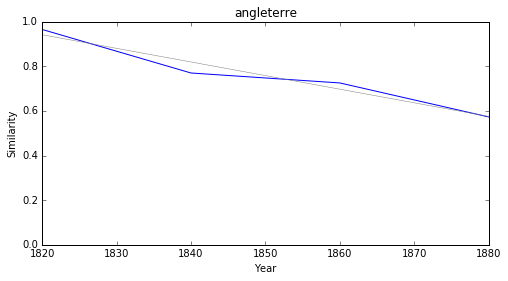

goût


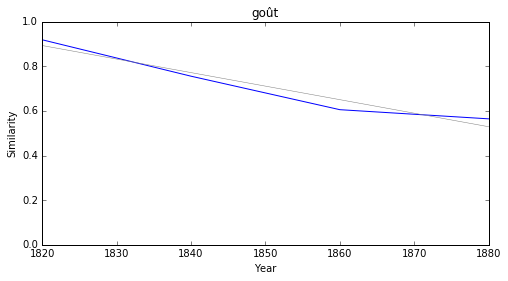

forme


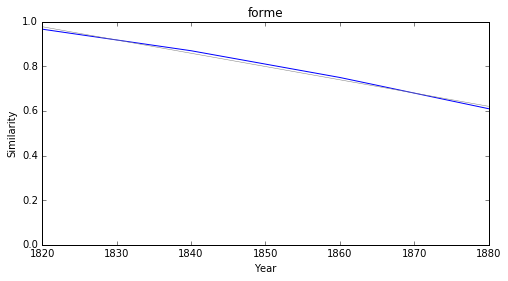

### <i><b>morale</i></b>

          token     slope         p
34       ancien -0.005099  0.001092
47    puissance -0.004711  0.016234
31  représenter -0.004538  0.045512
27          loi -0.004317  0.015691
44      utilité -0.004088  0.011800
10     puissant -0.004043  0.018347
9        valeur -0.003520  0.031877
25   simplicité -0.003514  0.033690
30    souverain -0.003489  0.034843
12  particulier -0.003482  0.017055



ancien


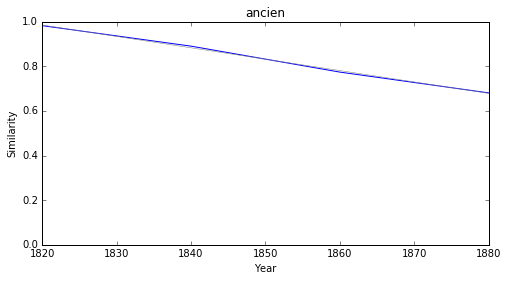

puissance


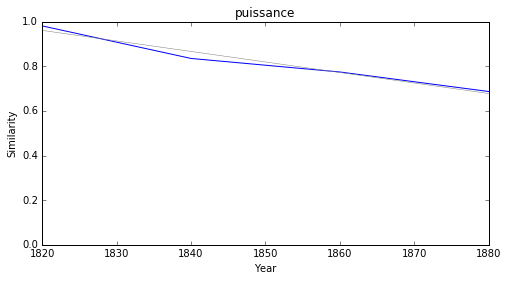

représenter


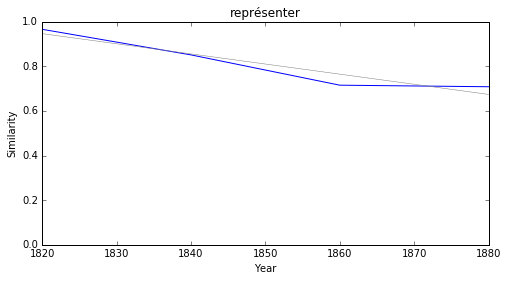

loi


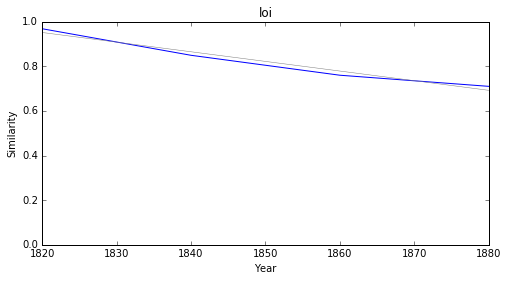

utilité


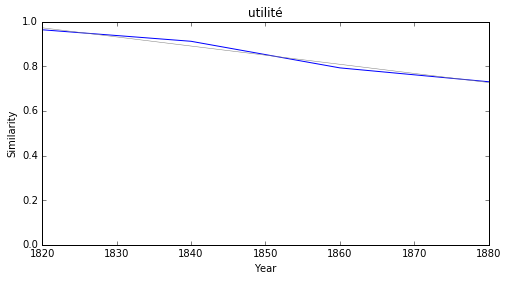

puissant


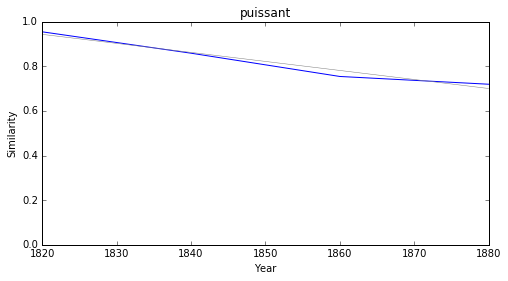

valeur


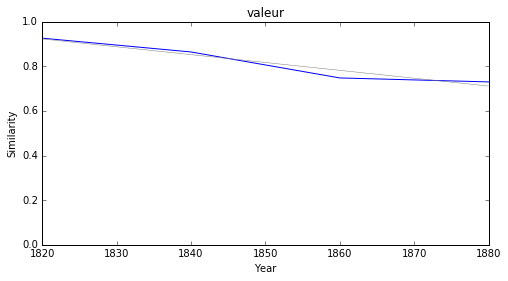

simplicité


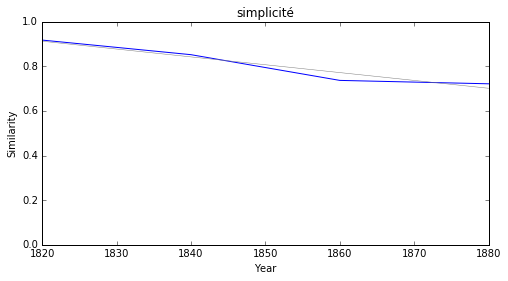

souverain


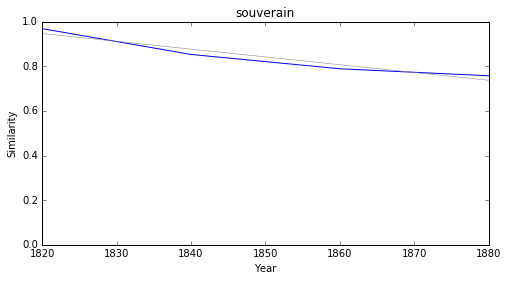

particulier


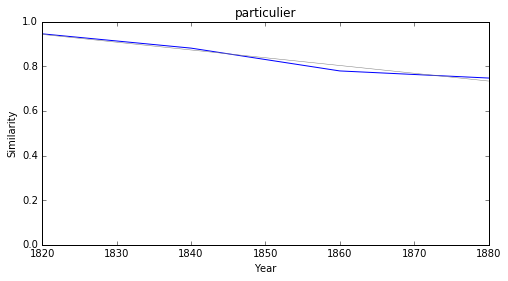

### <i><b>société</i></b>

        token     slope         p
76      armée -0.007865  0.003266
14       rang -0.006814  0.002347
87      façon -0.006441  0.037881
103    partie -0.006169  0.008586
52      cours -0.006104  0.008896
70       goût -0.006063  0.027297
24      forme -0.005944  0.003317
73     église -0.005842  0.037979
58    tableau -0.005519  0.017552
67   habitude -0.005501  0.018412



armée


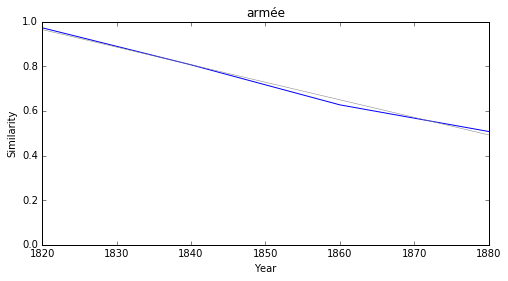

rang


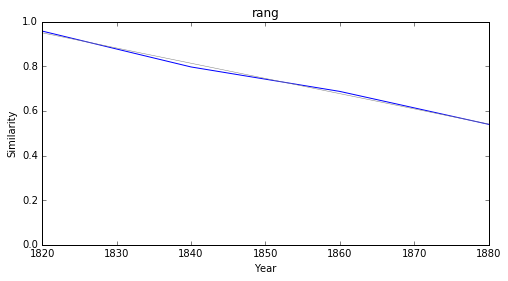

façon


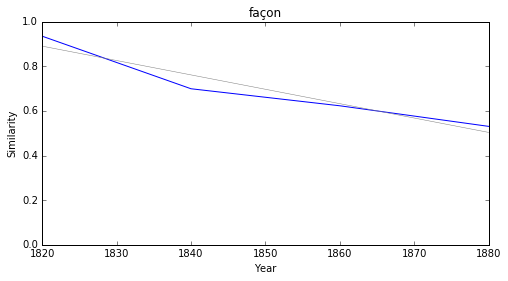

partie


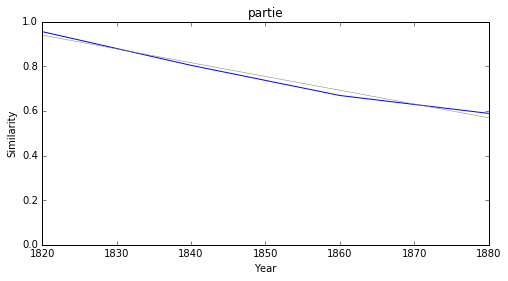

cours


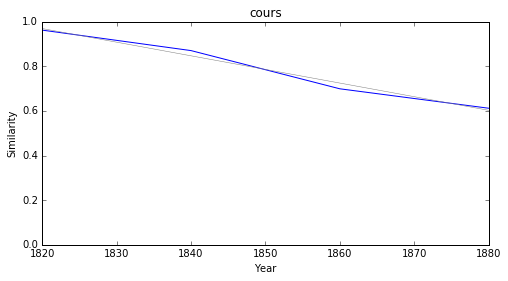

goût


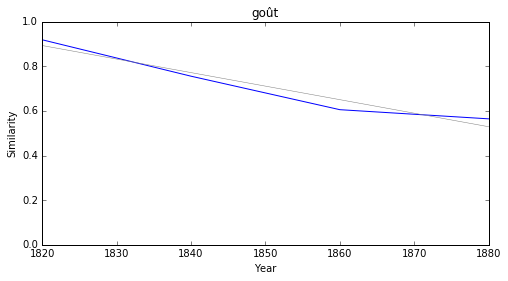

forme


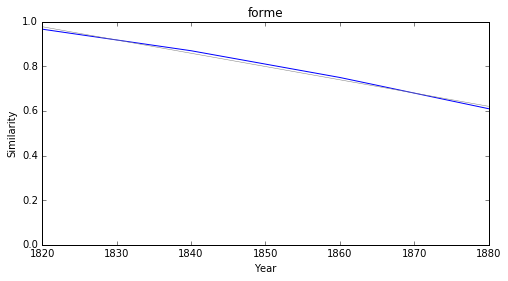

église


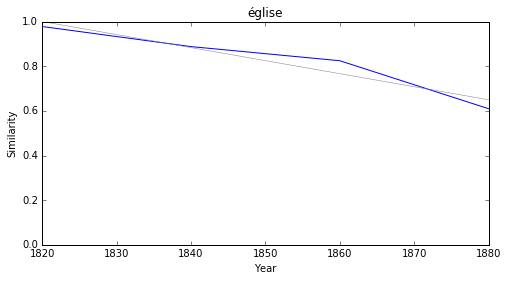

tableau


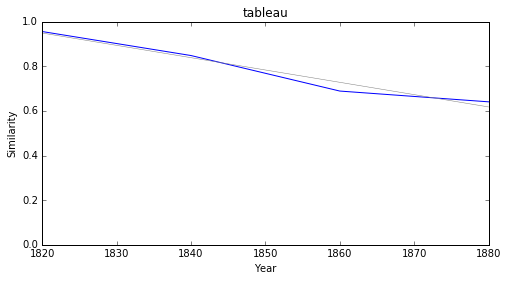

habitude


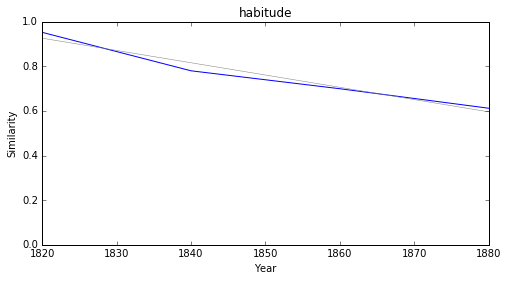

### <i><b>pouvoir</i></b>

        token     slope         p
27      alors -0.008738  0.015540
15  mouvement -0.007496  0.018156
6       ainsi -0.007049  0.036815
26     ennemi -0.007001  0.038493
9     obliger -0.006874  0.018266
8       parti -0.006646  0.022232
12     france -0.006609  0.015401
20      façon -0.006441  0.037881
17        nom -0.006216  0.005584
14       goût -0.006063  0.027297



alors


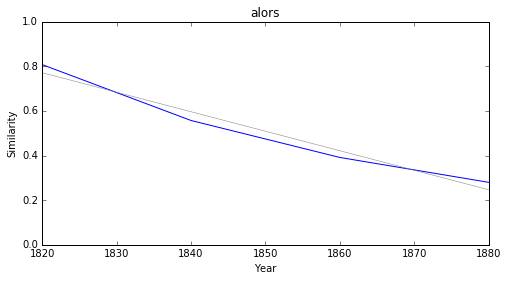

mouvement


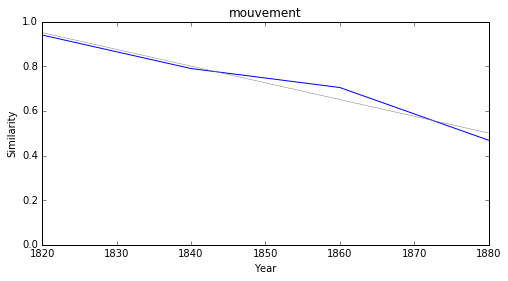

ainsi


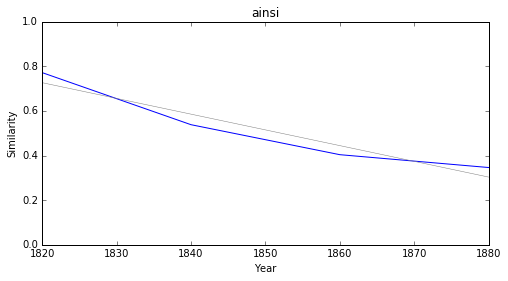

ennemi


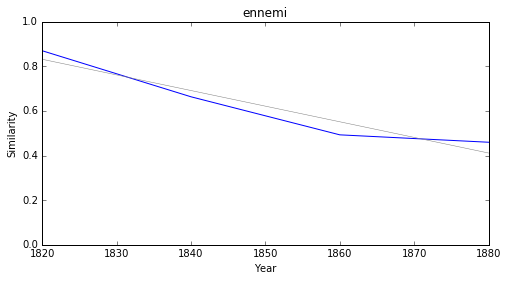

obliger


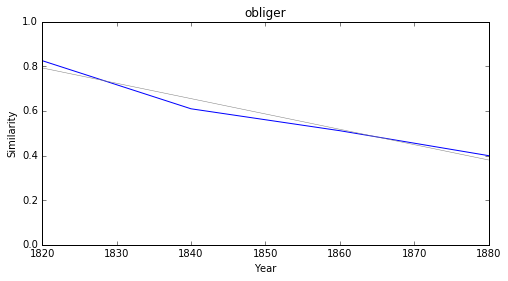

parti


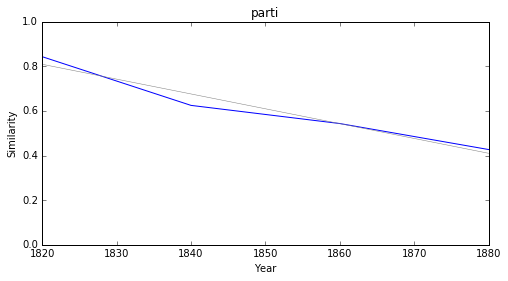

france


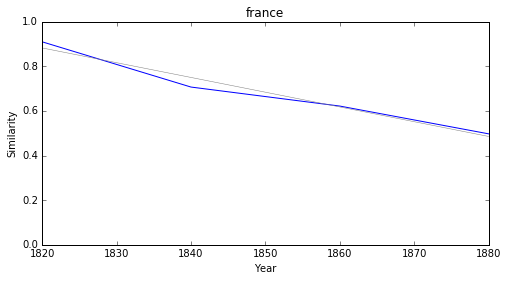

façon


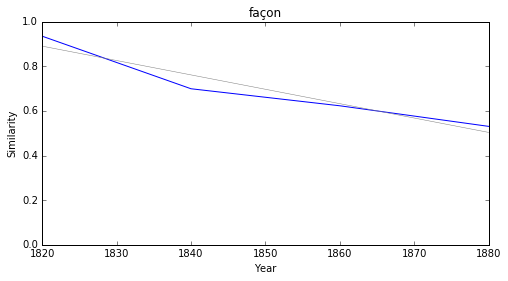

nom


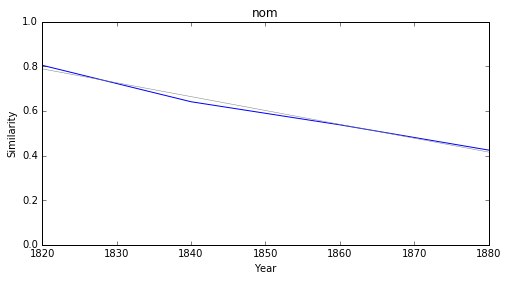

goût


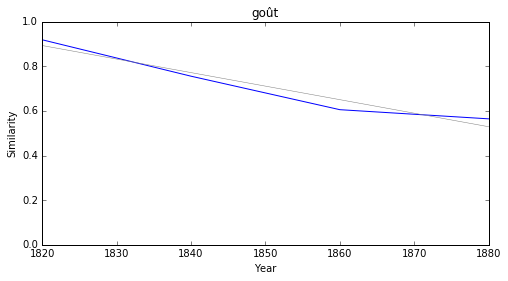

### <i><b>théologie</i></b>

          token     slope         p
1       révolte -0.003016  0.022303
2  conspiration -0.002563  0.034864
0         latin -0.002018  0.016694



révolte


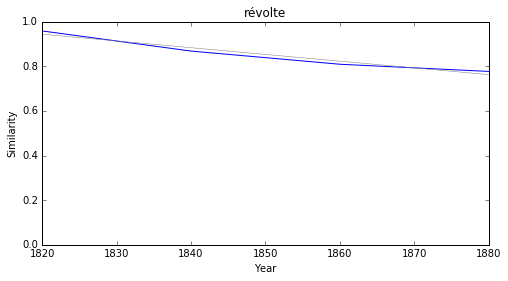

conspiration


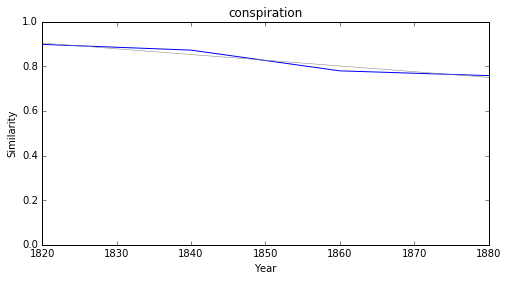

latin


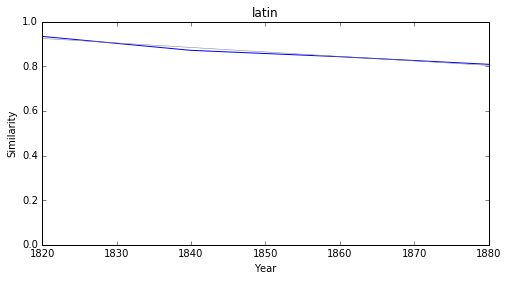

### <i><b>droit</i></b>

        token     slope         p
15       côté -0.010213  0.045479
22      place -0.008900  0.025967
61  mouvement -0.007496  0.018156
45      ordre -0.007067  0.010272
89     ennemi -0.007001  0.038493
10       rang -0.006814  0.002347
79    nouveau -0.006779  0.015825
63   empereur -0.006729  0.011613
43      parti -0.006646  0.022232
51     france -0.006609  0.015401



côté


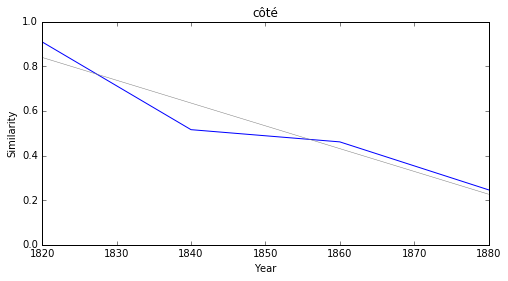

place


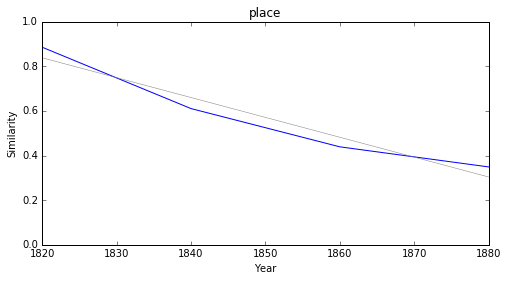

mouvement


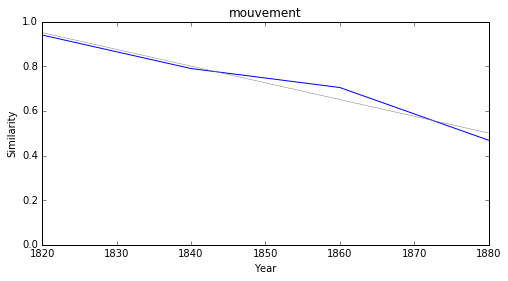

ordre


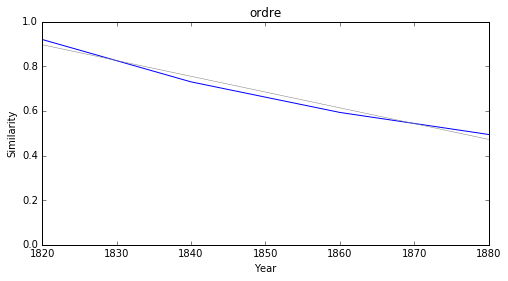

ennemi


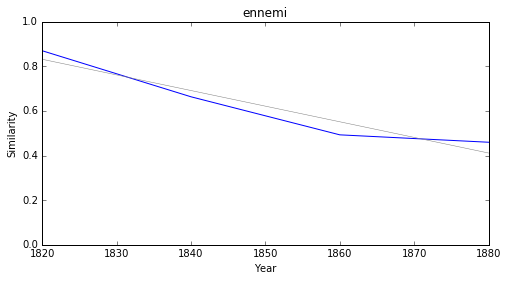

rang


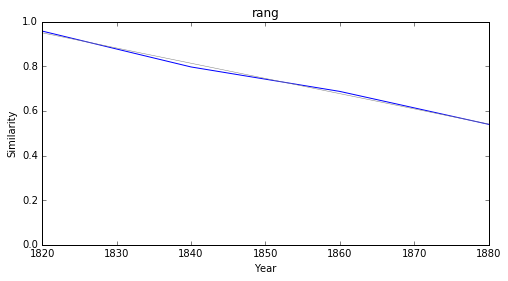

nouveau


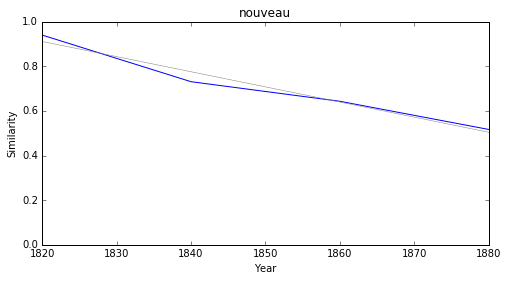

empereur


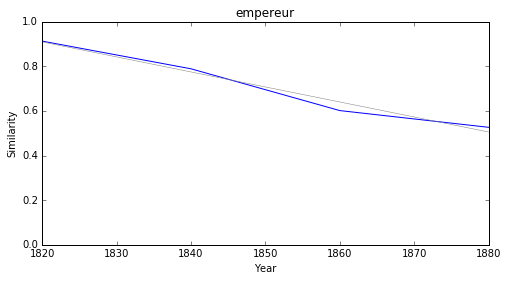

parti


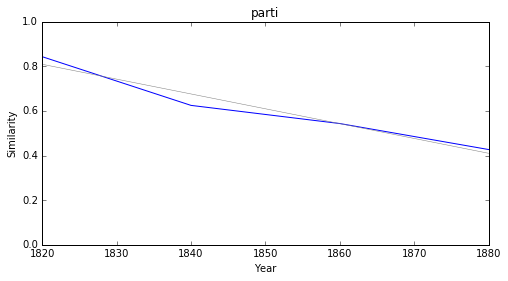

france


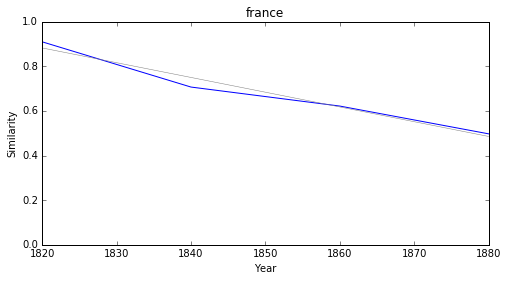

### <i><b>loi</i></b>

        token     slope         p
78      armée -0.007865  0.003266
55      ordre -0.007067  0.010272
14       rang -0.006814  0.002347
101   nouveau -0.006779  0.015825
64     france -0.006609  0.015401
75      suite -0.006537  0.006897
110  français -0.006503  0.001331
90      façon -0.006441  0.037881
119   conseil -0.006223  0.000807
108    partie -0.006169  0.008586



armée


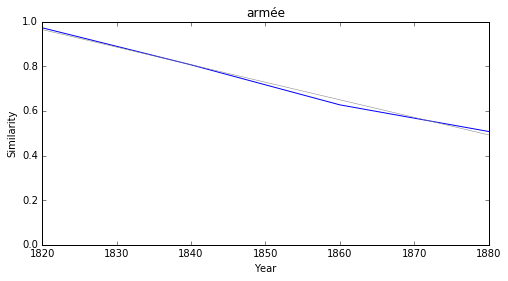

ordre


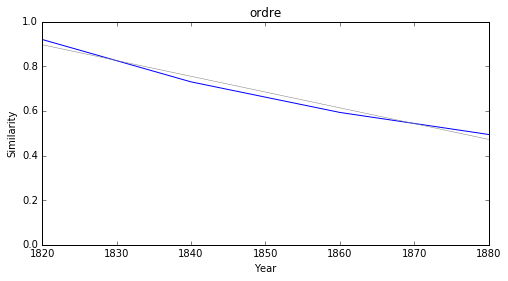

rang


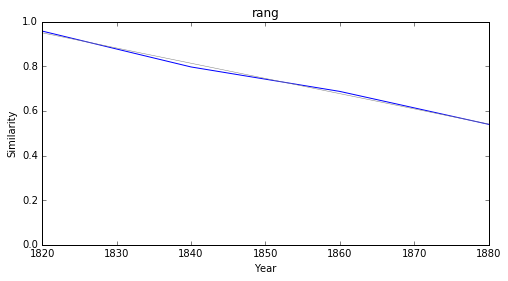

nouveau


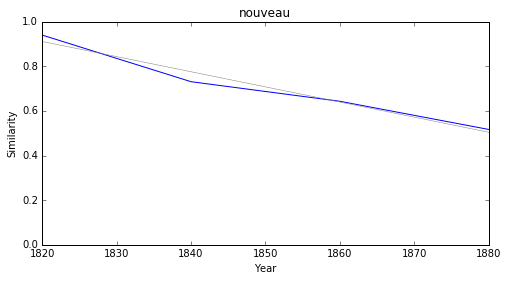

france


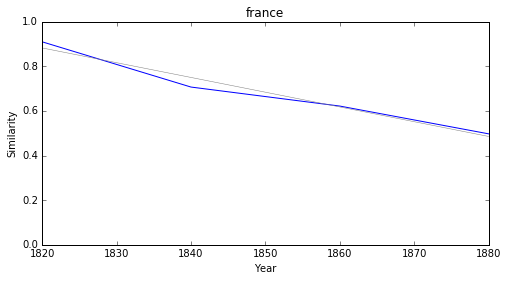

suite


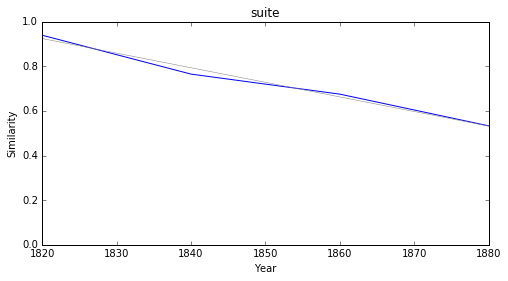

français


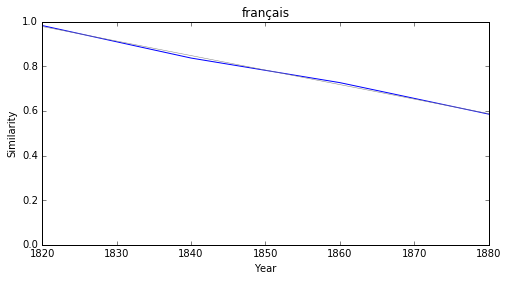

façon


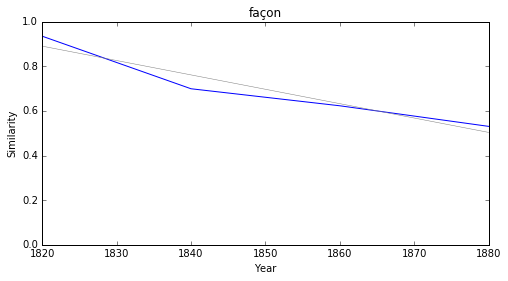

conseil


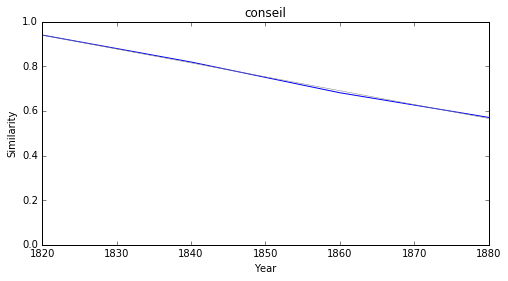

partie


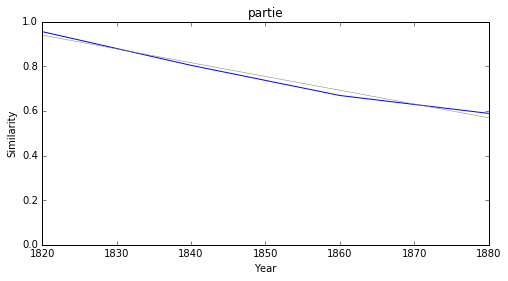

### <i><b>méthode</i></b>

         token     slope         p
5       nuance -0.004207  0.044337
11        acte -0.004145  0.012609
9      utilité -0.004088  0.011800
4        choix -0.004003  0.030599
7    érudition -0.003650  0.008007
3   découverte -0.003545  0.032680
14  simplicité -0.003514  0.033690
0      coutume -0.003421  0.016124
6   oppression -0.003266  0.005478
8       unique -0.002984  0.005502



nuance


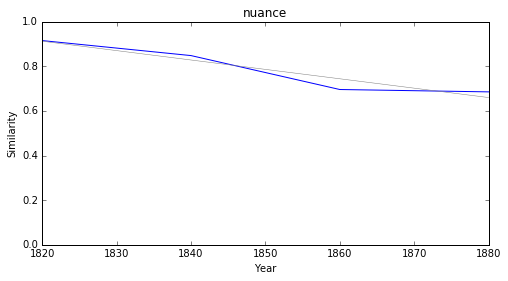

acte


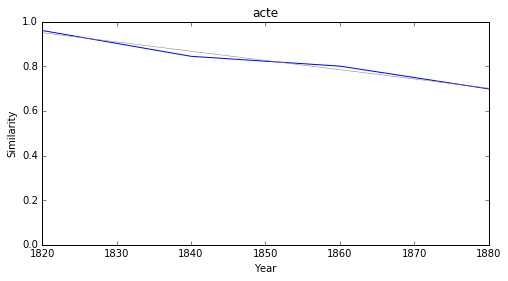

utilité


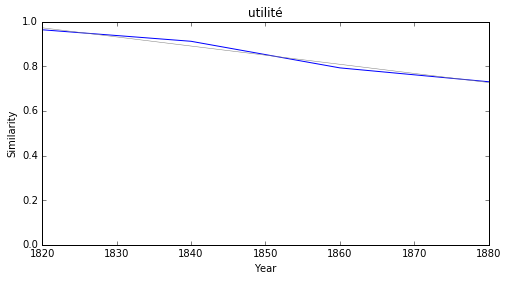

choix


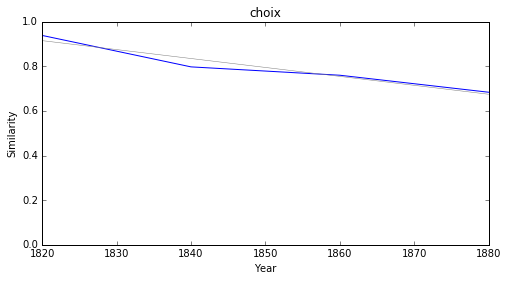

érudition


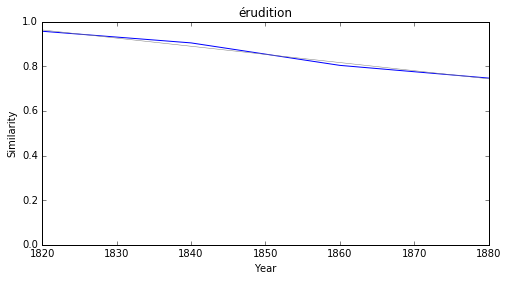

découverte


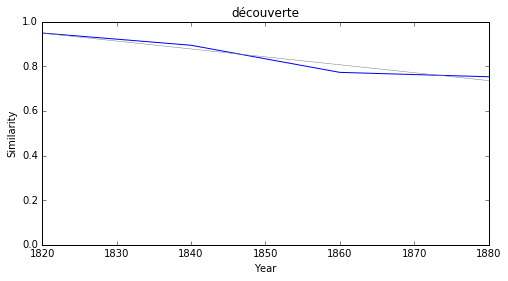

simplicité


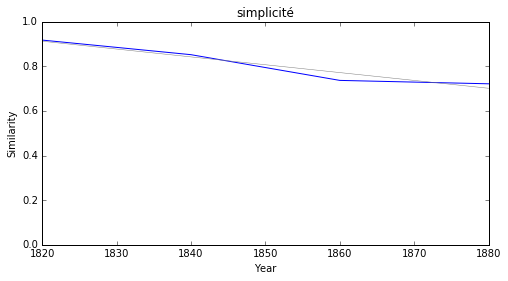

coutume


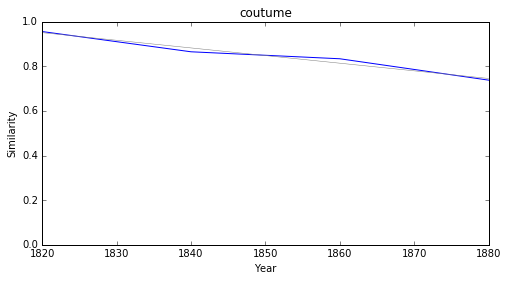

oppression


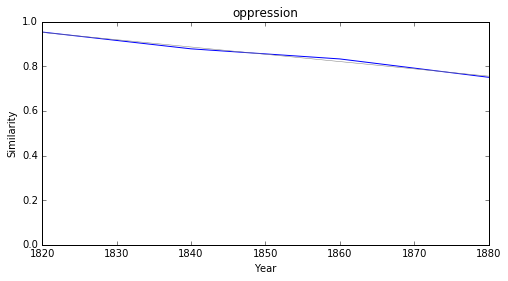

unique


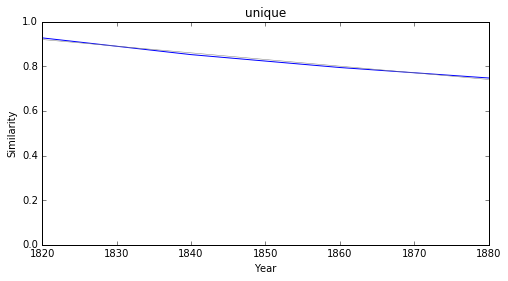

### <i><b>génie</i></b>

         token     slope         p
76       trait -0.007424  0.035014
10        rang -0.006814  0.002347
46  expression -0.006442  0.045263
83     conseil -0.006223  0.000807
56         nom -0.006216  0.005584
53        goût -0.006063  0.027297
16       forme -0.005944  0.003317
45     tableau -0.005519  0.017552
51    habitude -0.005501  0.018412
27    inimitié -0.005385  0.007743



trait


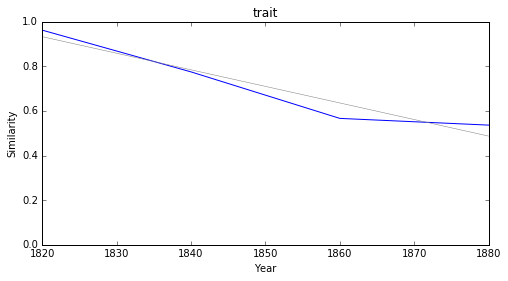

rang


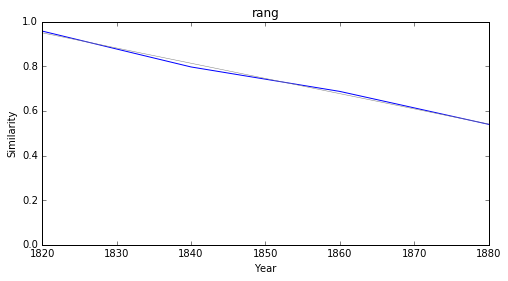

expression


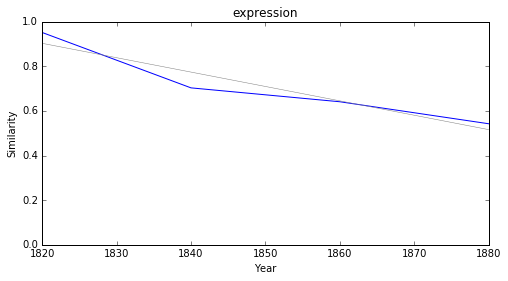

conseil


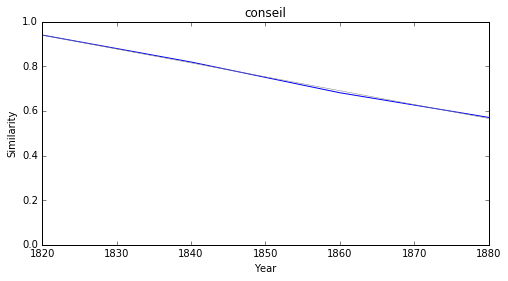

nom


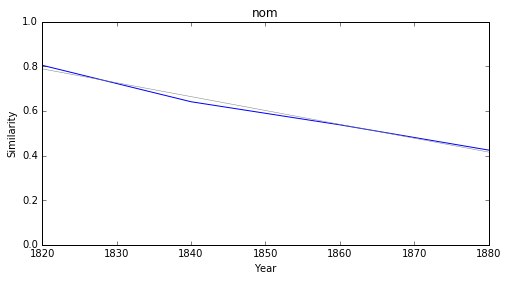

goût


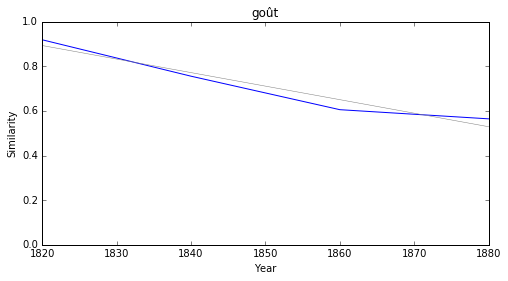

forme


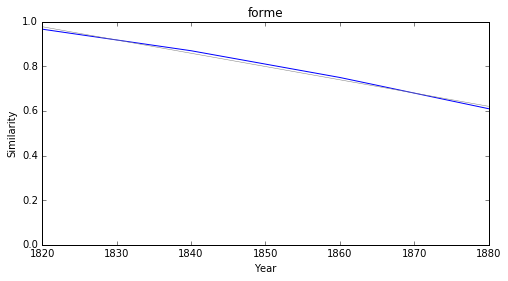

tableau


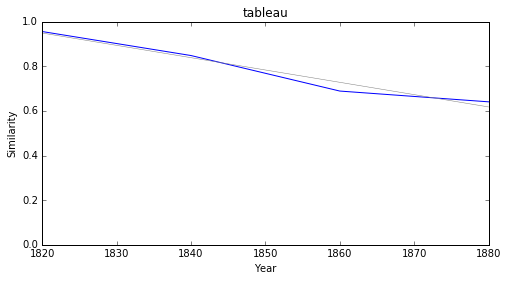

habitude


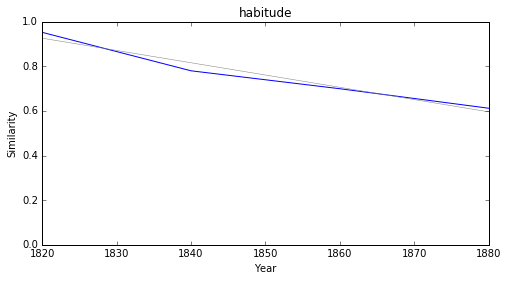

inimitié


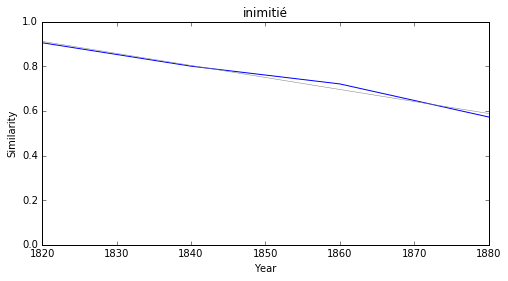

### <i><b>romantisme</i></b>

Empty DataFrame
Columns: [token, slope, p]
Index: []





### <i><b>réalisme</i></b>

Empty DataFrame
Columns: [token, slope, p]
Index: []





### <i><b>symbolisme</i></b>

Empty DataFrame
Columns: [token, slope, p]
Index: []





### <i><b>naturalisme</i></b>

Empty DataFrame
Columns: [token, slope, p]
Index: []





In [28]:
from IPython.display import Markdown, display

for word in testList :
    display(Markdown("### <i><b>"+word+"</i></b>"))
    df3 = pd.DataFrame(entries[word], columns=('token', 'slope', 'p'))
    print(df3.sort_values('slope', ascending=True).head(10))
    print('\n\n')
    
    for i, row in df3.sort_values('slope', ascending=True).head(10).iterrows():
        plot_cosine_series('littérature', row['token'], 8, 4)